In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append('/home/grimur/git/nplinker/nplinker/prototype/')


In [3]:
import csv
import numpy

In [4]:
from nplinker import nplinker
from nplinker import logconfig
logconfig.LogConfig.setLogLevel('DEBUG')

from nplinker.parsers.kcb import KCBParser
from nplinker.scoring import misc

In [5]:
# Established links

In [6]:
established_links = [
    ('CNS205', 'BGC0000827', 206),
    ('CNS205', 'BGC0000333', 489),
    ('CNB440', 'BGC0000940', 25),
    ('CNB440', 'BGC0000241', 381),
    ('CNT005', 'BGC0001228', 492),
    ('CNS205', 'BGC0000137', 353),
    ('CNS205', 'BGC0000137', 358),
    ('CNS237', 'BGC0001830', 309)
]

In [7]:
# Load data with orignal bigscape weights

In [8]:
npl = nplinker.NPLinker('/home/grimur/data-crusemann/nplinker_crusemann_20200131/crusemann_new.toml')
npl.load_data()

20:48:22 [DEBUG] config.py:71, Parsing default config file: /home/grimur/.config/nplinker/nplinker.toml
20:48:22 [DEBUG] config.py:74, Loading user config /home/grimur/data-crusemann/nplinker_crusemann_20200131/crusemann_new.toml
20:48:22 [INFO] config.py:106, Loading from local data in directory /home/grimur/data-crusemann/nplinker_crusemann_26112019
20:48:22 [DEBUG] loader.py:129, DatasetLoader(/home/grimur/data-crusemann/nplinker_crusemann_26112019, , False)
20:48:22 [DEBUG] nplinker.py:119, Enabled scoring method: metcalf
20:48:22 [DEBUG] nplinker.py:119, Enabled scoring method: testscore
20:48:22 [DEBUG] nplinker.py:119, Enabled scoring method: rosetta
20:48:22 [DEBUG] nplinker.py:240, load_data (normal case, full load, met_only=False)
20:48:22 [WARNING] loader.py:31, WARNING: unable to find extra_nodes_file in path "/home/grimur/data-crusemann/nplinker_crusemann_26112019/quantification_table_reformatted/*.csv"
20:48:22 [WARNING] loader.py:31, WARNING: unable to find metadata_tabl

20:48:23 [WARNING] metabolomics.py:517, Unknown strain: 38a.mzXML for cluster index 44972
20:48:23 [WARNING] metabolomics.py:517, Unknown strain: 5a.mzXML for cluster index 116143
20:48:23 [WARNING] metabolomics.py:517, Unknown strain: 6a.mzXML for cluster index 80280
20:48:23 [WARNING] metabolomics.py:517, Unknown strain: 40b.mzXML for cluster index 121459
20:48:23 [WARNING] metabolomics.py:517, Unknown strain: 42b.mzXML for cluster index 95477
20:48:23 [WARNING] metabolomics.py:517, Unknown strain: S801-3-EA.mzXML for cluster index 13340
20:48:23 [WARNING] metabolomics.py:517, Unknown strain: H643-3-EA.mzXML for cluster index 13340
20:48:23 [WARNING] metabolomics.py:517, Unknown strain: 26c.mzXML for cluster index 58621
20:48:23 [WARNING] metabolomics.py:517, Unknown strain: 35c.mzXML for cluster index 58621
20:48:23 [WARNING] metabolomics.py:517, Unknown strain: 28a.mzXML for cluster index 58621
20:48:23 [WARNING] metabolomics.py:517, Unknown strain: 29a.mzXML for cluster index 5911

True

In [9]:
sal_trop = ['CNB440',
'CNB476',
'CNB536',
'CNH898',
'CNR699',
'CNS197',
'CNS416',
'CNT250',
'CNT261',
'CNY012',
'CNY678',
'CNY681']

In [10]:
sal_are = ['CNB458', 
'CNB527', 
'CNH643', 
'CNH646', 
'CNH713', 
'CNH718', 
'CNH877', 
'CNH905', 
'CNH941', 
'CNH962', 
'CNH963', 
'CNH964', 
'CNH996', 
'CNP105', 
'CNP193', 
'CNQ748', 
'CNQ884', 
'CNR107', 
'CNR425', 
'CNR921', 
'CNS051', 
'CNS205', 
'CNS243', 
'CNS296', 
'CNS299', 
'CNS325', 
'CNS342', 
'CNS673', 
'CNS744', 
'CNS820', 
'CNS848', 
'CNS991', 
'CNT005', 
'CNT088', 
'CNT798', 
'CNT799', 
'CNT800', 
'CNT849', 
'CNT850', 
'CNT857', 
'CNT859', 
'CNX481', 
'CNX482', 
'CNX508', 
'CNX814', 
'CNX891', 
'CNY011', 
'CNY230', 
'CNY231', 
'CNY234', 
'CNY237', 
'CNY244', 
'CNY256', 
'CNY260', 
'CNY280', 
'CNY281', 
'CNY282', 
'CNY486', 
'CNY679', 
'CNY685', 
'CNY690', 
'CNY694']

In [11]:
sal_pac = ['CNH732',
'CNQ768',
'CNR114',
'CNR510',
'CNR894',
'CNR909',
'CNR942',
'CNS055',
'CNS103',
'CNS143',
'CNS237',
'CNS801',
'CNS860',
'CNS863',
'CNS960',
'CNS996',
'CNT001',
'CNT003',
'CNT029',
'CNT045',
'CNT084',
'CNT124',
'CNT131',
'CNT133',
'CNT138',
'CNT148',
'CNT150',
'CNT403',
'CNT569',
'CNT584',
'CNT603',
'CNT609',
'CNT796',
'CNT851',
'CNT854',
'CNT855',
'CNY202',
'CNY239',
'CNY330',
'CNY331',
'CNY363',
'CNY498',
'CNY646',
'CNY666',
'CNY673',
'CNY703']

In [12]:
strep = ['CNB091',
'CNH099',
'CNH189',
'CNH287',
'CNP082',
'CNQ149',
'CNQ329',
'CNQ525',
'CNQ766',
'CNQ865',
'CNR698',
'CNS335',
'CNS606',
'CNS615',
'CNS654',
'CNT302',
'CNT318',
'CNT360',
'CNT371',
'CNT372',
'CNX435',
'CNY228',
'CNY243',
'TAA040',
'TAA204',
'TAA486']

In [13]:
# Only keep the salinispora that we're interested in?
filtered_strains = []
for strain_id in sal_are + sal_pac:
    filtered_strains.append(npl.strains.lookup(strain_id))


In [14]:
npl._strains.filter(filtered_strains)

In [15]:
npl._strains

StrainCollection(n=106)

In [16]:
def sample_from_id_lists(gcf_id_list, mf_id_list, samples=1000):
    gcfs_in_id_list = set([])
    mfs_in_id_list = set([])

    for strain_id in gcf_id_list:
        strain_object = npl.strains.lookup(strain_id)
        if strain_object is None:
            continue
        gcfs_in_id_list = gcfs_in_id_list.union([x for x in npl.gcfs if strain_object in x.strains])
        
    for strain_id in mf_id_list:
        strain_object = npl.strains.lookup(strain_id)
        if strain_object is None:
            continue
        mfs_in_id_list = mfs_in_id_list.union([x for x in npl.molfams if strain_object in x.strains])

    gcfs_in_id_list = list(gcfs_in_id_list)
    mfs_in_id_list = list(mfs_in_id_list)
        
    scores = []
    for i in range(samples):
        gcf = numpy.random.choice(gcfs_in_id_list)
        mf = numpy.random.choice(mfs_in_id_list)
        score = misc.metcalf_scoring(mf, gcf, npl.strains, standardised=True)
        scores.append(score)
        
    return scores

In [17]:
s1_2 = sample_from_id_lists(sal_pac, sal_are, samples=10000)
s2_2 = sample_from_id_lists(sal_pac, sal_pac, samples=10000)
s3_2 = sample_from_id_lists(sal_are, sal_are, samples=10000)
s4_2 = sample_from_id_lists(sal_are, sal_pac, samples=10000)

perc = numpy.percentile(s1_2 + s2_2 + s3_2 + s4_2, 95)
mix_1 = len([x for x in s1_2 if x > perc]) / len(s1_2)
mix_2 = len([x for x in s4_2 if x > perc]) / len(s4_2)
hom_1 = len([x for x in s2_2 if x > perc]) / len(s2_2)
hom_2 = len([x for x in s3_2 if x > perc]) / len(s3_2)

print(mix_1)
print(mix_2)
print(hom_1)
print(hom_2)

KeyboardInterrupt: 

In [28]:
(mix_1 + mix_2) / 2

0.0334

In [18]:
(hom_1 + hom_2) / 2

NameError: name 'hom_1' is not defined

In [18]:
sal_are_2 = [
    'CNB458',
    'CNB527',
    'CNH643',
    'CNH646',
    'CNH713',
    'CNH718',
    'CNH877',
    'CNH905',
    'CNH741',
    'CNH962',
    'CNH963',
    'CNH964',
    'CNH996',
    'CNH996B',
    'CNP105',
    'CNP193',
    'CNQ748',
    'CNQ884',
    'CNR107',
    'CNR425',
    'CNR921',
    'CNS051',
    'CNS205',
    'CNS243',
    'CNS296',
    'CNS299',
    'CNS325',
    'CNS342',
    'CNS673',
    'CNS744',
    'CNS820',
    'CNS848',
    'CNS991',
    'CNT005',
    'CNT798',
    'CNT799',
    'CNT800',
    'CNT849',
    'CNT850',
    'CNT857',
    'CNT859',
    'CNX481',
    'CNX482',
    'CNX508',
    'CNX814',
    'CNX891',
    'CNY011',
    'CNY230',
    'CNY231',
    'CNY234',
    'CNY237',
    'CNY244',
    'CNY256',
    'CNY260',
    'CNY280',
    'CNY281',
    'CNY282',
    'CNY486',
    'CNY679',
    'CNY685',
    'CNY690',
    'CNY694',
    
]

In [20]:
len(sal_are)

62

In [21]:
len(sal_are_2)

62

In [22]:
len(set(sal_are).intersection(sal_are_2))

60

In [23]:
[x for x in sal_are if x not in sal_are_2]

['CNH941', 'CNT088']

In [24]:
[x for x in sal_are_2 if x not in sal_are]

['CNH741', 'CNH996B']

In [25]:
set(sal_are + sal_pac + sal_trop).intersection([x.id for x in npl.strains])

{'CNB458',
 'CNB527',
 'CNH646',
 'CNH713',
 'CNH718',
 'CNH732',
 'CNH877',
 'CNH905',
 'CNH941',
 'CNH962',
 'CNH963',
 'CNH964',
 'CNH996',
 'CNP105',
 'CNP193',
 'CNQ748',
 'CNQ768',
 'CNQ884',
 'CNR107',
 'CNR114',
 'CNR425',
 'CNR510',
 'CNR894',
 'CNR909',
 'CNR921',
 'CNR942',
 'CNS051',
 'CNS055',
 'CNS103',
 'CNS143',
 'CNS205',
 'CNS237',
 'CNS243',
 'CNS296',
 'CNS299',
 'CNS325',
 'CNS342',
 'CNS673',
 'CNS744',
 'CNS820',
 'CNS848',
 'CNS860',
 'CNS863',
 'CNS960',
 'CNS991',
 'CNS996',
 'CNT001',
 'CNT003',
 'CNT005',
 'CNT029',
 'CNT045',
 'CNT084',
 'CNT088',
 'CNT124',
 'CNT131',
 'CNT133',
 'CNT138',
 'CNT148',
 'CNT150',
 'CNT403',
 'CNT569',
 'CNT584',
 'CNT603',
 'CNT609',
 'CNT796',
 'CNT798',
 'CNT799',
 'CNT800',
 'CNT849',
 'CNT850',
 'CNT851',
 'CNT854',
 'CNT855',
 'CNT857',
 'CNT859',
 'CNX481',
 'CNX482',
 'CNX508',
 'CNX814',
 'CNX891',
 'CNY011',
 'CNY202',
 'CNY230',
 'CNY231',
 'CNY234',
 'CNY237',
 'CNY239',
 'CNY244',
 'CNY256',
 'CNY260',
 'CNY280',

In [19]:
sal_pac_2 = [
    'CNH732',
    'CNQ768',
    'CNR114',
    'CNR510',
    'CNR894',
    'CNR909',
    'CNR942',
    'CNS055',
    'CNS103',
    'CNS237',
    'CNS801',
    'CNS860',
    'CNS996',
    'CNT001',
    'CNT003',
    'CNT029',
    'CNT045',
    'CNT084',
    'CNT124',
    'CNT131',
    'CNT133A',
    'CNT403',
    'CNT569',
    'CNT584',
    'CNT603',
    'CNT609',
    'CNT796',
    'CNT851',
    'CNT854',
    'CNT855',
    'CNY202',
    'CNY239',
    'CNY330',
    'CNY331',
    'CNY363',
    'CNY498',
    'CNY646',
    'CNY666',
    'CNY673',
    'CNY703',
    'DSM45543',
    'DSM45544',
    'DSM45547',
    'DSM45548',
    'DSM45549'
]

In [20]:
npl.strains.lookup('DSM45549')

Strain(CNT150) [7 aliases]

In [28]:
a = set([1, 2])
a.remove(1)
a

{2}

In [21]:
node_collection = set([])

class Node(object):
    def __init__(self, data=None, parent=None):
        self.left = None
        self.right = None
        self.parent = parent
        self.data = data
        
        node_collection.add(self)
        
    def insert(self, data):
        if self.data == None:
            raise ValueError("Can't insert here!")
            
        self.left = Node(data, self)
        self.right = Node(self.data, self)
        self.data = None
        
        # returns 'self', 'new'
        return self.right, self.left
        
    def collapse(self, data):
        if self.data != None:
            raise ValueError("Nothing to collapse!")
            
        self.left = None
        self.right = None
        self.data = data
        
    def get_other_child(self, node):
        if self.left == node:
            return self.right
        elif self.right == node:
            return self.left
        else:
            raise ValueError("Child not found!")
            
    def get_sibling(self):
        if self.parent is None:
            raise ValueError("No parent found!")
            
        return self.parent.get_other_child(self)
    
    def add_sibling(self, node):
        self.parent = Node()
        node.parent = self.parent
        self.parent.left = self
        self.parent.right = node
        return self.parent

In [30]:
node_collection = set([])

node_1 = Node({'id':1, 'status':1})
node_2 = Node({'id':2, 'status':1})
node_3 = Node({'id':3, 'status':1})
node_4 = Node({'id':4, 'status':0})
node_5 = Node({'id':5, 'status':0})
node_6 = Node({'id':6, 'status':0})
node_7 = Node({'id':7, 'status':0})

leaf_nodes = set([node_1, node_2, node_3, node_4, node_5, node_6, node_7])

#level -1
tmp_node_r = node_6.add_sibling(node_7)

# level_0
tmp_node_l = node_3.add_sibling(node_4)
tmp_node_r = node_5.add_sibling(tmp_node_r)

# level 1
tmp_node_r = tmp_node_l.add_sibling(tmp_node_r)
tmp_node_l = node_1.add_sibling(node_2)

# level 2
root = tmp_node_l.add_sibling(tmp_node_r)

In [31]:
leaf_nodes = set([x for x in node_collection if x.data is not None])

In [32]:
len(leaf_nodes)

7

In [33]:
nodes_to_check = list(leaf_nodes)
print(len(nodes_to_check))

mock_node_counter = 0
while len(nodes_to_check) != 0:
    node = nodes_to_check.pop(0)
    print('Checking node', node.data)
    sibling_node = node.get_sibling()
    
    print(node.data, sibling_node.data)
    if sibling_node not in leaf_nodes:
        continue
    
    if node.data['status'] == sibling_node.data['status']:
        print('merge')
        mock_node_counter += 1
        mock_node = node.parent
        mock_node_id = "mock{}".format(mock_node_counter)
        mock_node_status = node.data['status']

        mock_node.collapse({'id':mock_node_id, 'status':mock_node_status})
        leaf_nodes.remove(node)
        leaf_nodes.remove(sibling_node)
        if sibling_node in nodes_to_check:
            nodes_to_check.remove(sibling_node)
        nodes_to_check.append(mock_node)
        leaf_nodes.add(mock_node)

7
Checking node {'id': 2, 'status': 1}
{'id': 2, 'status': 1} {'id': 1, 'status': 1}
merge
Checking node {'id': 3, 'status': 1}
{'id': 3, 'status': 1} {'id': 4, 'status': 0}
Checking node {'id': 4, 'status': 0}
{'id': 4, 'status': 0} {'id': 3, 'status': 1}
Checking node {'id': 5, 'status': 0}
{'id': 5, 'status': 0} None
Checking node {'id': 6, 'status': 0}
{'id': 6, 'status': 0} {'id': 7, 'status': 0}
merge
Checking node {'id': 'mock1', 'status': 1}
{'id': 'mock1', 'status': 1} None
Checking node {'id': 'mock2', 'status': 0}
{'id': 'mock2', 'status': 0} {'id': 5, 'status': 0}
merge
Checking node {'id': 'mock3', 'status': 0}
{'id': 'mock3', 'status': 0} None


In [34]:
[x.data for x in leaf_nodes]

[{'id': 'mock1', 'status': 1},
 {'id': 3, 'status': 1},
 {'id': 4, 'status': 0},
 {'id': 'mock3', 'status': 0}]

In [35]:
for x in npl.molfams[4].strains:
    print(x.id)
    print(x.aliases)
    
set.union(*[x.aliases.union([x.id]) for x in npl.molfams[4].strains])

CNX482
{'ASM51455v1', 'AZWD01000000', 'GCA_000514555.1'}
CNT849
{'AREQ01000000', 'ASM37382v1', 'KB892473', 'GCA_000373825.1'}
CNS296
set()
CNR114
{'GCA_000514775.1', 'ASM51477v1', 'AZWO01000000', 'AZWO01000001'}
CNT003
{'ASM51457v1', 'AZWE01000000', 'GCA_000514575.1', 'AZWE01000001'}
CNT403
set()
CNQ748
{'AZWY01000001', 'ASM51497v1', 'GCA_000514975.1', 'AZWY01000000'}
CNY237
{'ASM37530v1', 'ARHM01000000', 'GCA_000375305.1'}
CNT005
{'AZWU01000000', 'ASM51489v1', 'GCA_000514895.1', 'AZWU01000001'}
CNS143
{'ASM25963v2', 'CNS-143', 'GCA_000259635.2', 'AIIG01'}
CNR510
set()
CNH996
{'CNH-996', 'JNLS01000000', 'ASM70234v1', 'GCA_000702345.1'}
CNY256
{'ARHF01000000', 'GCA_000375165.1', 'ASM37516v1'}
CNX891
{'AZWW01000000', 'GCA_000514935.1', 'ASM51493v1'}


{'AIIG01',
 'AREQ01000000',
 'ARHF01000000',
 'ARHM01000000',
 'ASM25963v2',
 'ASM37382v1',
 'ASM37516v1',
 'ASM37530v1',
 'ASM51455v1',
 'ASM51457v1',
 'ASM51477v1',
 'ASM51489v1',
 'ASM51493v1',
 'ASM51497v1',
 'ASM70234v1',
 'AZWD01000000',
 'AZWE01000000',
 'AZWE01000001',
 'AZWO01000000',
 'AZWO01000001',
 'AZWU01000000',
 'AZWU01000001',
 'AZWW01000000',
 'AZWY01000000',
 'AZWY01000001',
 'CNH-996',
 'CNH996',
 'CNQ748',
 'CNR114',
 'CNR510',
 'CNS-143',
 'CNS143',
 'CNS296',
 'CNT003',
 'CNT005',
 'CNT403',
 'CNT849',
 'CNX482',
 'CNX891',
 'CNY237',
 'CNY256',
 'GCA_000259635.2',
 'GCA_000373825.1',
 'GCA_000375165.1',
 'GCA_000375305.1',
 'GCA_000514555.1',
 'GCA_000514575.1',
 'GCA_000514775.1',
 'GCA_000514895.1',
 'GCA_000514935.1',
 'GCA_000514975.1',
 'GCA_000702345.1',
 'JNLS01000000',
 'KB892473'}

In [36]:
import numpy
import copy

In [22]:
def set_leaf_properties(leaf_nodes, mf, gcf):
    # overkill
    # mf_ids = set.union(*[x.aliases.union([x.id]) for x in mf.strains])
    # gcf_ids = set.union(*[x.aliases.union([x.id]) for x in gcf.strains])
    mf_ids = [x.id for x in mf.strains]
    gcf_ids = [x.id for x in gcf_strains]
    
    for leaf in leaf_nodes:
        strain_id = leaf.data['id']
        
        if strain_id in mf_ids:
            in_mf = True
        else:
            in_mf = False
        
        if strain_id in gcf_ids:
            in_gcf = True
        else:
            in_gcf = False
            
        leaf.data['status'] = (in_mf, in_gcf)
        
    return leaf_nodes

In [23]:
def calculate_correlation(leaf_nodes, mf, gcf):
    # Copy the tree
    leaf_nodes = copy.copy(leaf_nodes)
    
    # Set the leaf nodes to indicate mf/gcf presence (node.data['status'])
    leaf_nodes = set_leaf_properties(leaf_nodes, mf, gcf)
    
    nodes_to_check = list(leaf_nodes)
    print(len(nodes_to_check))

    # Collapse nodes with identical status
    mock_node_counter = 0  # keep track of nodes mocked
    while len(nodes_to_check) != 0:
        node = nodes_to_check.pop(0)
        print('Checking node', node.data)
        sibling_node = node.get_sibling()

        # Asymmetry, the sibling is a proper node
        # print(node.data, sibling_node.data)
        if sibling_node not in leaf_nodes:
            continue

        # Check the status
        if node.data['status'] == sibling_node.data['status']:
            print('merge')
            mock_node_counter += 1
            
            # The parent node becomes the mock leaf
            mock_node = node.parent
            # Generate sequential ID
            mock_node_id = "mock{}".format(mock_node_counter)
            # the same for node and sibling_node
            mock_node_status = node.data['status']

            # Remove children, set the mock node ID, add to the set of nodes to check
            mock_node.collapse({'id':mock_node_id, 'status':mock_node_status})
            # Keep track of leaf nodes
            leaf_nodes.remove(node)
            leaf_nodes.remove(sibling_node)
            leaf_nodes.add(mock_node)

            # Clean up - don't want to recheck the sibling node we just removed!
            if sibling_node in nodes_to_check:
                nodes_to_check.remove(sibling_node)
            nodes_to_check.append(mock_node)
            
    # Standardised correlation score
    population_size = len(leaf_nodes)
    mf_size = len([x for x in leaf_nodes if x.data['status'][0] is True])
    gcf_size = len([x for x in leaf_nodes if x.data['status'][1] is True])
    overlap = len([x for x in leaf_nodes if x.data['status'] == (True, True)])
    
    # Score weights
    w_neither, w_gcf_only, w_mf_only, w_both = scoring.misc.METCALF_WEIGHTS
    
    raw_score = scoring.misc.metcalf_count(mf_size, 
                                           gcf_size, 
                                           overlap, 
                                           population_size, 
                                           w_both, 
                                           w_mf_only, 
                                           w_gcf_only, 
                                           w_neither)
    
    score_exp, score_var = scoring.misc.metcalf_expected_count(mf_size, 
                                                               gcf_size, 
                                                               overlap, 
                                                               population_size, 
                                                               w_both, 
                                                               w_mf_only, 
                                                               w_gcf_only, 
                                                               w_neither)
    
    return (raw_score - score_exp) / numpy.sqrt(score_var)

In [24]:
from Bio import Phylo

In [25]:
import io



In [26]:
def get_parent(tree, child_clade):
    node_path = tree.get_path(child_clade)
    return node_path[-2]

In [42]:
tree = Phylo.read(io.StringIO("((A, B), ((C, D), (E, (F, G))))"), format='newick')
Phylo.draw_ascii(tree)

leaves = tree.get_terminals()

leaves[0].properties = 1
leaves[1].properties = 1
leaves[2].properties = 1
leaves[3].properties = 0
leaves[4].properties = 0
leaves[5].properties = 0
leaves[6].properties = 0

nodes_to_check = list(leaves)
print(len(nodes_to_check))

mock_node_counter = 0
while len(nodes_to_check) != 0:
    node = nodes_to_check.pop(0)
    print('Checking node', node)
    
    for potential_sibling_node in tree.get_terminals():
        print('+', node, potential_sibling_node)
        dist = tree.trace(node, potential_sibling_node)
        if len(dist) == 2:
            print(node, potential_sibling_node)
            if potential_sibling_node in nodes_to_check:
                sibling_idx = nodes_to_check.index(potential_sibling_node)
                sibling_node = nodes_to_check.pop(sibling_idx)
            break
    else:
        print('No sibling for', node)
        continue
    
    print(node, node.properties, sibling_node, sibling_node.properties)
        
    if node.properties == sibling_node.properties:
        print('merge')
        mock_node_counter += 1
        
        mock_node = get_parent(tree, node)
        mock_node_id = "mock{}".format(mock_node_counter)
        mock_node_properties = node.properties

        mock_node.clades = []
        mock_node.name = mock_node_id
        mock_node.properties = mock_node_properties

        leaves = tree.get_terminals()
        if sibling_node in nodes_to_check:
            nodes_to_check.remove(sibling_node)
        nodes_to_check.append(mock_node)
                               
                               
Phylo.draw_ascii(tree)

                    __________________ A
  _________________|
 |                 |__________________ B
 |
_|                                     __________________ C
 |                  __________________|
 |                 |                  |__________________ D
 |_________________|
                   |                   __________________ E
                   |__________________|
                                      |                   __________________ F
                                      |__________________|
                                                         |__________________ G

7
Checking node A
+ A A
+ A B
A B
A 1 B 1
merge
Checking node C
+ C mock1
+ C C
+ C D
C D
C 1 D 0
Checking node E
+ E mock1
+ E C
+ E D
+ E E
+ E F
+ E G
No sibling for E
Checking node F
+ F mock1
+ F C
+ F D
+ F E
+ F F
+ F G
F G
F 0 G 0
merge
Checking node mock1
+ mock1 mock1
+ mock1 C
+ mock1 D
+ mock1 E
+ mock1 mock2
No sibling for mock1
Checking node mock2
+ mock2 mock1
+ mock2 C
+ mock2

In [27]:
def set_leaf_properties(leaf_nodes, mf, gcf):
    # overkill
    # mf_ids = set.union(*[x.aliases.union([x.id]) for x in mf.strains])
    # gcf_ids = set.union(*[x.aliases.union([x.id]) for x in gcf.strains])
    mf_ids = [x.id for x in mf.strains]
    gcf_ids = [x.id for x in gcf.strains]
    
    all_ids = []
    
    for leaf in leaf_nodes:
        strain_id = leaf.name
        all_ids.append(strain_id)
        
        if strain_id in mf_ids:
            in_mf = True
        else:
            in_mf = False
        
        if strain_id in gcf_ids:
            in_gcf = True
        else:
            in_gcf = False
            
        leaf.properties = (in_mf, in_gcf)
        
    return leaf_nodes

In [28]:
def collapse_tree_(tree, collapse_type):
    leaves = tree.get_terminals()
    nodes_to_check = list(leaves)
    # print(len(nodes_to_check))

    mock_node_counter = 0  # Keep track of mocked nodes
    while len(nodes_to_check) != 0:
        node = nodes_to_check.pop(0)
        # print('Checking node', node)
        # print('Terminal nodes:', tree.get_terminals())
        # Loop through to look for potential siblings
        for potential_sibling_node in tree.get_terminals():
            # print('+', node, potential_sibling_node)
            dist = tree.trace(node, potential_sibling_node)
            # siblings are terminal nodes with dist. exactly two
            if len(dist) == 2:
                # print(node, potential_sibling_node)
                if potential_sibling_node in nodes_to_check:
                    # print(nodes_to_check)
                    sibling_idx = nodes_to_check.index(potential_sibling_node)
                    sibling_node = nodes_to_check.pop(sibling_idx)
                sibling_node = potential_sibling_node
                # print('break')
                break
        else:
            # print('No sibling for', node)
            continue
        # Phylo.draw_ascii(tree)
        # print(node, node.properties, sibling_node, sibling_node.properties)

        # Check if properties match
        if node.properties == sibling_node.properties:# and node.properties == (True, True):
            if collapse_type != 'all' and node.properties != (True, True):
                continue
            #print('merge', node.properties)
            mock_node_counter += 1
            
            # print('total size:', len(tree.get_terminals()))
            # print(tree.get_terminals())

            mock_node = get_parent(tree, node)
            mock_node_id = "mock{}".format(mock_node_counter)
            mock_node_properties = node.properties

            mock_node.clades = []
            mock_node.name = mock_node_id
            mock_node.properties = mock_node_properties

            leaves = tree.get_terminals()
            if sibling_node in nodes_to_check:
                nodes_to_check.remove(sibling_node)
            nodes_to_check.append(mock_node)
            
            if len(leaves) <= 2:
                break
            
        # nodes_to_check = list(set(tree.get_terminals()).intersection(nodes_to_check))

    return tree

In [29]:
def calculate_correlation(orig_tree, mf, gcf, collapse='all'):
    # Copy the tree
    tree = copy.deepcopy(orig_tree)  # Does this work??
    leaves = tree.get_terminals()
    
    # Set the leaf nodes to indicate mf/gcf presence (node.data['status'])
    leaves = set_leaf_properties(leaves, mf, gcf)
    
    # Collapse nodes with identical status
    if collapse:
        tree = collapse_tree_(tree, collapse)

    leaf_nodes = tree.get_terminals()
    
    # print('{} -> {} nodes'.format(len(leaves), len(leaf_nodes)))
    
    # Standardised correlation score
    population_size = len(leaf_nodes)
    mf_size = len([x for x in leaf_nodes if x.properties[0] is True])
    gcf_size = len([x for x in leaf_nodes if x.properties[1] is True])
    overlap = len([x for x in leaf_nodes if x.properties == (True, True)])
    
    # Score weights
    w_neither, w_gcf_only, w_mf_only, w_both = scoring.misc.METCALF_WEIGHTS
    
    raw_score = scoring.misc.metcalf_count(mf_size, 
                                           gcf_size, 
                                           overlap, 
                                           population_size, 
                                           w_both, 
                                           w_mf_only, 
                                           w_gcf_only, 
                                           w_neither)
    
    score_exp, score_var = scoring.misc.metcalf_expected_count(mf_size, 
                                                               gcf_size, 
                                                               overlap, 
                                                               population_size, 
                                                               w_both, 
                                                               w_mf_only, 
                                                               w_gcf_only, 
                                                               w_neither)
    
    return (raw_score - score_exp) / numpy.sqrt(score_var)

In [30]:
with open('/home/grimur/mka_test/data/phylo_tree/Salinispora.tree', 'r') as f:
    salinispora_tree = Phylo.read(f, format='newick')

In [31]:
c = 0
for n in salinispora_tree.get_terminals():
    if n.name.startswith('QS--'):
        n.name = n.name[4:]
    if n.name.endswith('CNS-205'):
        n.name = 'CNS205'
    print(n.name)
    c += 1

CNY260
CNS342
CNT088
CNS744
CNS673
CNY256
CNY234
CNY282
CNY231
CNR921
CNS243
CNY244
CNY237
CNR425
CNQ748
CNS299
CNS325
CNS205
CNT005
CNY230
CNS820
CNR107
CNQ884
CNS296
CNS051
CNH718
CNX481
CNX508
CNX814
CNX482
CNX891
CNT799
CNT850
CNT859
CNT857
CNT800
CNT798
CNT849
CNY280
CNS848
CNS991
CNH964
CNP105
CNP193
CNH941
CNY679
CNH905
CNH877
CNY011
CNH646
CNH713
CNH963
CNH962
CNH996
CNY486
CNB458
CNY690
CNY694
CNB527
CNY685
CNY281
CNS143
CNR510
CNR894
CNS103
CNR909
CNQ768
CNR114
CNT131
CNT603
CNT001
CNS960
CNT003
CNY239
CNH732
CNT855
CNY498
CNY331
CNY330
CNY363
CNT796
CNT851
CNT133
CNT084
CNT609
CNS055
CNT148
CNY666
CNS863
CNS860
CNT403
CNT045
CNS996
CNY703
CNY673
CNT138
CNT029
CNT584
CNT124
CNT854
CNS237
CNT150
CNY646
CNY202
CNR942
CNT569
OG--TS--GCF_900090235--Micromonospora_echinaurantiaca_DSM_43904


In [32]:
Phylo.draw_ascii(salinispora_tree)

                           , CNY260
                           |
                           | CNS342
                           |
                           , CNT088
                           |
                           | CNS744
                           |
                           , CNS673
                           |
                           | CNY256
                           |
                           |, CNY234
                           ,|
                           || CNY282
                           |
                           | CNY231
                           |
                           , CNR921
                           |
                           | CNS243
                           |
                           , CNY244
                           |
                           | CNY237
                           |
                           , CNR425
                           |
                           | CNQ748
                           |
                      

In [33]:
salinispora_tree.prune('OG--TS--GCF_900090235--Micromonospora_echinaurantiaca_DSM_43904')

Clade(confidence=1)

In [34]:
import copy
from nplinker import scoring

In [35]:
print(npl.gcfs[10].strains)

StrainCollection(n=1) [CNY281]


In [36]:
print(npl.molfams[17].strains)

{Strain(CNS243) [3 aliases], Strain(CNR921) [3 aliases], Strain(CNT003) [4 aliases], Strain(CNS960) [5 aliases], Strain(CNS996) [3 aliases], Strain(CNS237) [4 aliases], Strain(CNT371) [3 aliases], Strain(CNY330) [4 aliases], Strain(CNT045) [3 aliases], Strain(CNY239) [3 aliases], Strain(CNH646) [4 aliases], Strain(CNH905) [3 aliases], Strain(CNB458) [3 aliases], Strain(CNR699) [3 aliases], Strain(CNS416) [3 aliases], Strain(CNS197) [4 aliases], Strain(CNB440) [5 aliases], Strain(CNT138) [7 aliases], Strain(CNX435) [0 aliases], Strain(CNB536) [4 aliases], Strain(CNY681) [0 aliases], Strain(CNS205) [5 aliases], Strain(CNS606) [3 aliases], Strain(CNS863) [7 aliases], Strain(CNR425) [3 aliases], Strain(CNR894) [4 aliases], Strain(CNH898) [3 aliases], Strain(CNQ329) [3 aliases], Strain(CNR114) [4 aliases], Strain(CNY678) [0 aliases], Strain(CNY202) [4 aliases], Strain(CNS991) [5 aliases], Strain(CNS103) [4 aliases], Strain(CNS143) [4 aliases], Strain(CNS654) [3 aliases], Strain(CNQ884) [0 a

In [53]:
calculate_correlation(salinispora_tree, npl.molfams[10], npl.gcfs[10])

0.0

In [54]:
scoring.misc.metcalf_scoring(npl.molfams[10], npl.gcfs[10], npl.strains, standardised=True)

0.0

In [55]:
npl.gcfs[10].strains

StrainCollection(n=1) [CNY281]

In [37]:
def sample_from_id_lists_corr(gcf_id_list, mf_id_list, samples=1000, collapse=True):
    gcfs_in_id_list = set([])
    mfs_in_id_list = set([])

    for strain_id in gcf_id_list:
        strain_object = npl.strains.lookup(strain_id)
        if strain_object is None:
            continue
        gcfs_in_id_list = gcfs_in_id_list.union([x for x in npl.gcfs if strain_object in x.strains])
        
    for strain_id in mf_id_list:
        strain_object = npl.strains.lookup(strain_id)
        if strain_object is None:
            continue
        mfs_in_id_list = mfs_in_id_list.union([x for x in npl.molfams if strain_object in x.strains])

    gcfs_in_id_list = list(gcfs_in_id_list)
    mfs_in_id_list = list(mfs_in_id_list)
        
    scores = []
    for i in range(samples):
        gcf = numpy.random.choice(gcfs_in_id_list)
        mf = numpy.random.choice(mfs_in_id_list)
        while len(set(gcf.strains).intersection(mf.strains)) == 0:
            gcf = numpy.random.choice(gcfs_in_id_list)
            mf = numpy.random.choice(mfs_in_id_list)
        score = calculate_correlation(salinispora_tree, mf, gcf, collapse=collapse)
        scores.append(score)
        
    return scores

In [38]:
print('sampling 1 / 4')
pac_vs_are_full_collapse = sample_from_id_lists_corr(sal_pac, sal_are, samples=10000, collapse='all')
print('sampling 2 / 4')
pac_vs_pac_full_collapse = sample_from_id_lists_corr(sal_pac, sal_pac, samples=10000, collapse='all')
print('sampling 3 / 4')
are_vs_are_full_collapse = sample_from_id_lists_corr(sal_are, sal_are, samples=10000, collapse='all')
print('sampling 4 / 4')
are_vs_pac_full_collapse = sample_from_id_lists_corr(sal_are, sal_pac, samples=10000, collapse='all')

perc = numpy.percentile(pac_vs_are_full_collapse + 
                        pac_vs_pac_full_collapse + 
                        are_vs_are_full_collapse + 
                        are_vs_pac_full_collapse, 95)
mix_corr_1 = len([x for x in pac_vs_are_full_collapse if x > perc]) / len(pac_vs_are_full_collapse)
mix_corr_2 = len([x for x in are_vs_pac_full_collapse if x > perc]) / len(are_vs_pac_full_collapse)
hom_corr_1 = len([x for x in pac_vs_pac_full_collapse if x > perc]) / len(pac_vs_pac_full_collapse)
hom_corr_2 = len([x for x in are_vs_are_full_collapse if x > perc]) / len(are_vs_are_full_collapse)

print(mix_corr_1)
print(mix_corr_2)
print(hom_corr_1)
print(hom_corr_2)

sampling 1 / 4
sampling 2 / 4
sampling 3 / 4
sampling 4 / 4
0.0427
0.0386
0.0638
0.0545


In [746]:
print('sampling 1 / 4')
pac_vs_are_part_collapse = sample_from_id_lists_corr(sal_pac, sal_are, samples=10000, collapse='consensus')
print('sampling 2 / 4')
pac_vs_pac_part_collapse = sample_from_id_lists_corr(sal_pac, sal_pac, samples=10000, collapse='consensus')
print('sampling 3 / 4')
are_vs_are_part_collapse = sample_from_id_lists_corr(sal_are, sal_are, samples=10000, collapse='consensus')
print('sampling 4 / 4')
are_vs_pac_part_collapse = sample_from_id_lists_corr(sal_are, sal_pac, samples=10000, collapse='consensus')

perc = numpy.percentile(pac_vs_are_part_collapse +
                        pac_vs_pac_part_collapse +
                        are_vs_are_part_collapse +
                        are_vs_pac_part_collapse, 95)
mix_corr_1 = len([x for x in pac_vs_are_part_collapse if x > perc]) / len(pac_vs_are_part_collapse)
mix_corr_2 = len([x for x in are_vs_pac_part_collapse if x > perc]) / len(are_vs_pac_part_collapse)
hom_corr_1 = len([x for x in pac_vs_pac_part_collapse if x > perc]) / len(pac_vs_pac_part_collapse)
hom_corr_2 = len([x for x in are_vs_are_part_collapse if x > perc]) / len(are_vs_are_part_collapse)

print(mix_corr_1)
print(mix_corr_2)
print(hom_corr_1)
print(hom_corr_2)

sampling 1 / 4
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nod

106 -> 106 nodes
106 -> 95 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 95 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 104 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 99 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 100 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 96 nodes
106 -> 99 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 94 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 105 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nod

106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 100 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 95 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 98 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes

106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 97 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 99 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 99 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 99 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 100 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 96 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 100 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 96 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 94 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 97 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 100 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 100 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 93 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

In [698]:
print(numpy.mean(s_corr_1_2))
print(numpy.mean(s_corr_2_2))
print(numpy.mean(s_corr_3_2))
print(numpy.mean(s_corr_4_2))

-0.35491017304688366
-0.28821536545641424
-0.20145173991167586
-0.35946025564955153


In [700]:
print(numpy.mean(s1_2))
print(numpy.mean(s2_2))
print(numpy.mean(s3_2))
print(numpy.mean(s4_2))

-0.10801505250180271
0.0707565628794775
0.10753313809939873
-0.12279551598544404


In [39]:
print('sampling 1 / 4')
pac_vs_are_no_collapse = sample_from_id_lists_corr(sal_pac, sal_are, samples=10000, collapse=False)
print('sampling 2 / 4')
pac_vs_pac_no_collapse = sample_from_id_lists_corr(sal_pac, sal_pac, samples=10000, collapse=False)
print('sampling 3 / 4')
are_vs_are_no_collapse = sample_from_id_lists_corr(sal_are, sal_are, samples=10000, collapse=False)
print('sampling 4 / 4')
are_vs_pac_no_collapse = sample_from_id_lists_corr(sal_are, sal_pac, samples=10000, collapse=False)

perc = numpy.percentile(pac_vs_are_no_collapse +
                        pac_vs_pac_no_collapse +
                        are_vs_are_no_collapse +
                        are_vs_pac_no_collapse, 95)
mix_corr_1 = len([x for x in pac_vs_are_no_collapse if x > perc]) / len(pac_vs_are_no_collapse)
mix_corr_2 = len([x for x in are_vs_pac_no_collapse if x > perc]) / len(are_vs_pac_no_collapse)
hom_corr_1 = len([x for x in pac_vs_pac_no_collapse if x > perc]) / len(pac_vs_pac_no_collapse)
hom_corr_2 = len([x for x in are_vs_are_no_collapse if x > perc]) / len(are_vs_are_no_collapse)

print(mix_corr_1)
print(mix_corr_2)
print(hom_corr_1)
print(hom_corr_2)

sampling 1 / 4
sampling 2 / 4
sampling 3 / 4
sampling 4 / 4
0.0355
0.0253
0.0826
0.0511


In [84]:
sal_pac
sal_are
dir(npl.bgcs[0])
npl.bgcs[0]._known_cluster_blast

In [85]:
from nplinker.parsers.kcb import KCBParser

In [86]:
kkb_bgc_hits = {}
for bgc in npl.bgcs:
    kcb_filename = KCBParser.get_kcb_filename_from_bgc(bgc)
    kcb_parser = KCBParser(kcb_filename)
    hits = []
    for mibig_id, hit in kcb_parser.hits.items():
        score = numpy.sum([x['blast_score'] for x in hit['individual_hits']])
        hits.append((mibig_id, score))
    if len(hits) > 0:
        kkb_bgc_hits[bgc] = hits

In [101]:
kkb_bgc_hits[npl.bgcs[0]]
sal_pac_bgc_count = 0
sal_pac_bgc_scores = []
sal_are_bgc_count = 0
sal_are_bgc_scores = []
for b in npl.bgcs:
    if b.strain.id in sal_pac:
        sal_pac_bgc_count += 1
        if b in kkb_bgc_hits:
            sal_pac_bgc_scores.extend([x[1] for x in kkb_bgc_hits[b]])
    if b.strain.id in sal_are:
        sal_are_bgc_count += 1
        if b in kkb_bgc_hits:
            sal_are_bgc_scores.extend([x[1] for x in kkb_bgc_hits[b]])
        

In [102]:
print(sal_pac_bgc_count)
print(len(sal_pac_bgc_scores))
print(len(sal_pac_bgc_scores) / float(sal_pac_bgc_count))
print(numpy.mean(sal_pac_bgc_scores))
print(sal_are_bgc_count)
print(len(sal_are_bgc_scores))
print(len(sal_are_bgc_scores) / float(sal_are_bgc_count))
print(numpy.mean(sal_are_bgc_scores))

1096
15874
14.483576642335766
4431.851392213683
1951
30180
15.468990261404407
5246.028992710404


In [41]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [65]:
import scipy.stats

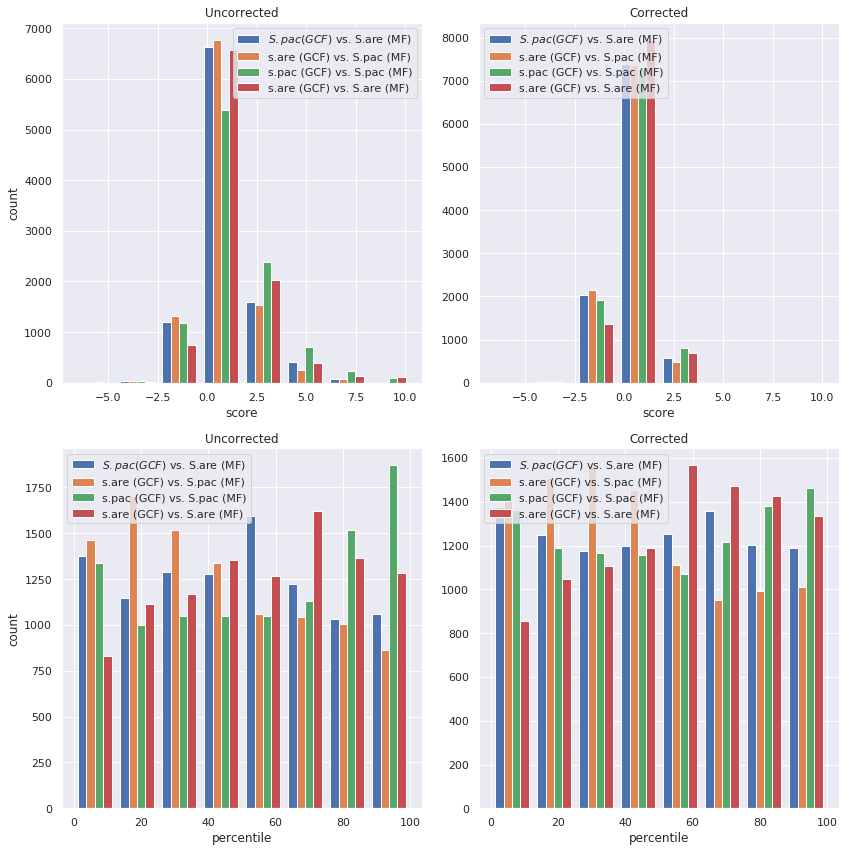

In [71]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 12))




max_val = max(max(pac_vs_are_no_collapse), max(are_vs_pac_no_collapse), max(pac_vs_pac_no_collapse), max(are_vs_are_no_collapse))
min_val = min(min(pac_vs_are_no_collapse), min(are_vs_pac_no_collapse), min(pac_vs_pac_no_collapse), min(are_vs_are_no_collapse))

ax1.hist([
              pac_vs_are_no_collapse, 
              are_vs_pac_no_collapse, 
              pac_vs_pac_no_collapse, 
              are_vs_are_no_collapse], 
         label=labels,
         bins=8,
         range=[min_val, max_val]
)
ax1.set_title('Uncorrected')
ax1.set_xlabel('score')
ax1.set_ylabel('count')
ax1.legend()

ax2.hist([pac_vs_are_full_collapse,
          are_vs_pac_full_collapse,
          pac_vs_pac_full_collapse,
          are_vs_are_full_collapse],
         label=labels,
         bins=8,
         range=[min_val, max_val]
         )
ax2.set_title('Corrected')
ax2.legend(loc='upper left')
ax2.set_xlabel('score')






labels = ['$\it{S.pac (GCF)}$ vs. S.are (MF)', 
          's.are (GCF) vs. S.pac (MF)', 
          's.pac (GCF) vs. S.pac (MF)', 
          's.are (GCF) vs. S.are (MF)']


all_samples_no_collapse = [*pac_vs_are_no_collapse, *are_vs_pac_no_collapse, *pac_vs_pac_no_collapse, *are_vs_are_no_collapse]

pva_nc = [scipy.stats.percentileofscore(all_samples_no_collapse, x) for x in pac_vs_are_no_collapse]
avp_nc = [scipy.stats.percentileofscore(all_samples_no_collapse, x) for x in are_vs_pac_no_collapse]
pvp_nc = [scipy.stats.percentileofscore(all_samples_no_collapse, x) for x in pac_vs_pac_no_collapse]
ava_nc = [scipy.stats.percentileofscore(all_samples_no_collapse, x) for x in are_vs_are_no_collapse]




all_samples_full_collapse = [*pac_vs_are_full_collapse, *are_vs_pac_full_collapse, *pac_vs_pac_full_collapse, *are_vs_are_full_collapse]

pva_fc = [scipy.stats.percentileofscore(all_samples_full_collapse, x) for x in pac_vs_are_full_collapse]
avp_fc = [scipy.stats.percentileofscore(all_samples_full_collapse, x) for x in are_vs_pac_full_collapse]
pvp_fc = [scipy.stats.percentileofscore(all_samples_full_collapse, x) for x in pac_vs_pac_full_collapse]
ava_fc = [scipy.stats.percentileofscore(all_samples_full_collapse, x) for x in are_vs_are_full_collapse]




max_val = max(*ava_nc, *pvp_nc, *avp_nc, *pva_nc)
min_val = min(*ava_nc, *pvp_nc, *avp_nc, *pva_nc)

ax3.hist([
              pva_nc, 
              avp_nc, 
              pvp_nc, 
              ava_nc], 
         label=labels,
         bins=8,
         range=[min_val, max_val]
)
ax3.set_title('Uncorrected')
ax3.set_xlabel('percentile')
ax3.set_ylabel('count')
ax3.legend()

ax4.hist([pva_fc,
          avp_fc,
          pvp_fc,
          ava_fc],
         label=labels,
         bins=8,
         range=[min_val, max_val]
         )
ax4.set_title('Corrected')
ax4.legend(loc='upper left')
ax4.set_xlabel('percentile')












plt.tight_layout()





plt.savefig('fig_phylo_correlation.pdf')

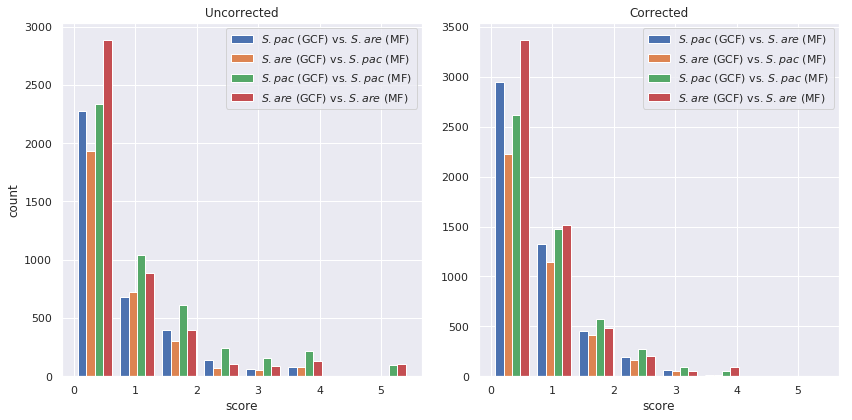

In [112]:

labels = [r"$\it{S.pac}$ (GCF) vs. $\it{S.are}$ (MF)", 
          r"$\it{S.are}$ (GCF) vs. $\it{S.pac}$ (MF)", 
          r"$\it{S.pac}$ (GCF) vs. $\it{S.pac}$ (MF)", 
          r"$\it{S.are}$ (GCF) vs. $\it{S.are}$ (MF)"]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

pa_nc = pac_vs_are_no_collapse
pp_nc = pac_vs_pac_no_collapse
aa_nc = are_vs_are_no_collapse
ap_nc = are_vs_pac_no_collapse

nc_mean = numpy.mean(pa_nc + pp_nc + aa_nc + ap_nc)
nc_std = numpy.std(pa_nc + pp_nc + aa_nc + ap_nc)

pa_nc = [(x - nc_mean)/nc_std for x in pa_nc]
pp_nc = [(x - nc_mean)/nc_std for x in pp_nc]
aa_nc = [(x - nc_mean)/nc_std for x in aa_nc]
ap_nc = [(x - nc_mean)/nc_std for x in ap_nc]

pa_fc = pac_vs_are_full_collapse
pp_fc = pac_vs_pac_full_collapse
aa_fc = are_vs_are_full_collapse
ap_fc = are_vs_pac_full_collapse

fc_mean = numpy.mean(pa_fc + pp_fc + aa_fc + ap_fc)
fc_std = numpy.std(pa_fc + pp_fc + aa_fc + ap_fc)

pa_fc = [(x - fc_mean)/fc_std for x in pa_fc]
pp_fc = [(x - fc_mean)/fc_std for x in pp_fc]
aa_fc = [(x - fc_mean)/fc_std for x in aa_fc]
ap_fc = [(x - fc_mean)/fc_std for x in ap_fc]


pa_nc = [x for x in pa_nc if x > 0]
pp_nc = [x for x in pp_nc if x > 0]
ap_nc = [x for x in ap_nc if x > 0]
aa_nc = [x for x in aa_nc if x > 0]

pa_fc = [x for x in pa_fc if x > 0]
pp_fc = [x for x in pp_fc if x > 0]
ap_fc = [x for x in ap_fc if x > 0]
aa_fc = [x for x in aa_fc if x > 0]


max_val = max(max(pa_nc), max(ap_nc), max(pp_nc), max(aa_nc))
min_val = min(min(pa_nc), min(ap_nc), min(pp_nc), min(aa_nc))

ax1.hist([
              pa_nc, 
              ap_nc, 
              pp_nc, 
              aa_nc], 
         label=labels,
         bins=8,
         range=[min_val, max_val]
)
ax1.set_title('Uncorrected')
ax1.set_xlabel('score')
ax1.set_ylabel('count')
ax1.legend()

ax2.hist([pa_fc,
          ap_fc,
          pp_fc,
          aa_fc],
         label=labels,
         bins=8,
         range=[min_val, max_val]
         )
ax2.set_title('Corrected')
ax2.legend(loc='upper right')
ax2.set_xlabel('score')

fig.tight_layout()
plt.savefig('fig_phylo_correction_standardised.pdf')

In [748]:
pac_vs_are_full_collapse_2 = sample_from_id_lists_corr(sal_pac, sal_are, samples=10000, collapse='all')
print('sampling 2 / 4')
pac_vs_pac_full_collapse_2 = sample_from_id_lists_corr(sal_pac, sal_pac, samples=10000, collapse='all')
print('sampling 3 / 4')
are_vs_are_full_collapse_2 = sample_from_id_lists_corr(sal_are, sal_are, samples=10000, collapse='all')
print('sampling 4 / 4')
are_vs_pac_full_collapse_2 = sample_from_id_lists_corr(sal_are, sal_pac, samples=10000, collapse='all')

perc = numpy.percentile(pac_vs_are_full_collapse_2 + 
                        pac_vs_pac_full_collapse_2 + 
                        are_vs_are_full_collapse_2 + 
                        are_vs_pac_full_collapse_2, 95)
mix_corr_1 = len([x for x in pac_vs_are_full_collapse_2 if x > perc]) / len(pac_vs_are_full_collapse_2)
mix_corr_2 = len([x for x in are_vs_pac_full_collapse_2 if x > perc]) / len(are_vs_pac_full_collapse_2)
hom_corr_1 = len([x for x in pac_vs_pac_full_collapse_2 if x > perc]) / len(pac_vs_pac_full_collapse_2)
hom_corr_2 = len([x for x in are_vs_are_full_collapse_2 if x > perc]) / len(are_vs_are_full_collapse_2)

print(mix_corr_1)
print(mix_corr_2)
print(hom_corr_1)
print(hom_corr_2)

106 -> 63 nodes
106 -> 63 nodes
106 -> 50 nodes
106 -> 82 nodes
106 -> 37 nodes
106 -> 33 nodes
106 -> 50 nodes
106 -> 48 nodes
106 -> 75 nodes
106 -> 22 nodes
106 -> 81 nodes
106 -> 37 nodes
106 -> 37 nodes
106 -> 42 nodes
106 -> 56 nodes
106 -> 73 nodes
106 -> 41 nodes
106 -> 47 nodes
106 -> 47 nodes
106 -> 62 nodes
106 -> 37 nodes
106 -> 43 nodes
106 -> 81 nodes
106 -> 77 nodes
106 -> 38 nodes
106 -> 18 nodes
106 -> 25 nodes
106 -> 46 nodes
106 -> 62 nodes
106 -> 81 nodes
106 -> 52 nodes
106 -> 54 nodes
106 -> 45 nodes
106 -> 31 nodes
106 -> 88 nodes
106 -> 57 nodes
106 -> 73 nodes
106 -> 50 nodes
106 -> 26 nodes
106 -> 48 nodes
106 -> 52 nodes
106 -> 40 nodes
106 -> 39 nodes
106 -> 71 nodes
106 -> 53 nodes
106 -> 40 nodes
106 -> 65 nodes
106 -> 56 nodes
106 -> 33 nodes
106 -> 42 nodes
106 -> 38 nodes
106 -> 27 nodes
106 -> 28 nodes
106 -> 42 nodes
106 -> 21 nodes
106 -> 36 nodes
106 -> 37 nodes
106 -> 51 nodes
106 -> 26 nodes
106 -> 53 nodes
106 -> 48 nodes
106 -> 82 nodes
106 -> 4

106 -> 50 nodes
106 -> 66 nodes
106 -> 27 nodes
106 -> 82 nodes
106 -> 45 nodes
106 -> 48 nodes
106 -> 26 nodes
106 -> 35 nodes
106 -> 20 nodes
106 -> 65 nodes
106 -> 41 nodes
106 -> 30 nodes
106 -> 42 nodes
106 -> 67 nodes
106 -> 49 nodes
106 -> 71 nodes
106 -> 52 nodes
106 -> 53 nodes
106 -> 42 nodes
106 -> 43 nodes
106 -> 37 nodes
106 -> 20 nodes
106 -> 32 nodes
106 -> 17 nodes
106 -> 28 nodes
106 -> 44 nodes
106 -> 49 nodes
106 -> 43 nodes
106 -> 38 nodes
106 -> 46 nodes
106 -> 56 nodes
106 -> 68 nodes
106 -> 30 nodes
106 -> 51 nodes
106 -> 77 nodes
106 -> 26 nodes
106 -> 16 nodes
106 -> 44 nodes
106 -> 36 nodes
106 -> 56 nodes
106 -> 77 nodes
106 -> 47 nodes
106 -> 55 nodes
106 -> 25 nodes
106 -> 43 nodes
106 -> 48 nodes
106 -> 22 nodes
106 -> 50 nodes
106 -> 36 nodes
106 -> 61 nodes
106 -> 65 nodes
106 -> 37 nodes
106 -> 23 nodes
106 -> 56 nodes
106 -> 50 nodes
106 -> 37 nodes
106 -> 51 nodes
106 -> 28 nodes
106 -> 33 nodes
106 -> 34 nodes
106 -> 34 nodes
106 -> 35 nodes
106 -> 2

106 -> 53 nodes
106 -> 78 nodes
106 -> 37 nodes
106 -> 89 nodes
106 -> 49 nodes
106 -> 44 nodes
106 -> 28 nodes
106 -> 47 nodes
106 -> 45 nodes
106 -> 61 nodes
106 -> 22 nodes
106 -> 32 nodes
106 -> 34 nodes
106 -> 59 nodes
106 -> 83 nodes
106 -> 41 nodes
106 -> 42 nodes
106 -> 65 nodes
106 -> 82 nodes
106 -> 43 nodes
106 -> 69 nodes
106 -> 39 nodes
106 -> 38 nodes
106 -> 31 nodes
106 -> 48 nodes
106 -> 21 nodes
106 -> 40 nodes
106 -> 26 nodes
106 -> 33 nodes
106 -> 25 nodes
106 -> 36 nodes
106 -> 39 nodes
106 -> 60 nodes
106 -> 16 nodes
106 -> 72 nodes
106 -> 16 nodes
106 -> 50 nodes
106 -> 23 nodes
106 -> 37 nodes
106 -> 64 nodes
106 -> 48 nodes
106 -> 37 nodes
106 -> 56 nodes
106 -> 15 nodes
106 -> 38 nodes
106 -> 86 nodes
106 -> 47 nodes
106 -> 39 nodes
106 -> 28 nodes
106 -> 47 nodes
106 -> 60 nodes
106 -> 15 nodes
106 -> 55 nodes
106 -> 53 nodes
106 -> 15 nodes
106 -> 74 nodes
106 -> 34 nodes
106 -> 56 nodes
106 -> 37 nodes
106 -> 32 nodes
106 -> 81 nodes
106 -> 80 nodes
106 -> 3

106 -> 35 nodes
106 -> 43 nodes
106 -> 42 nodes
106 -> 19 nodes
106 -> 54 nodes
106 -> 25 nodes
106 -> 25 nodes
106 -> 25 nodes
106 -> 41 nodes
106 -> 12 nodes
106 -> 28 nodes
106 -> 28 nodes
106 -> 68 nodes
106 -> 48 nodes
106 -> 50 nodes
106 -> 40 nodes
106 -> 22 nodes
106 -> 32 nodes
106 -> 30 nodes
106 -> 45 nodes
106 -> 78 nodes
106 -> 58 nodes
106 -> 25 nodes
106 -> 38 nodes
106 -> 19 nodes
106 -> 46 nodes
106 -> 50 nodes
106 -> 36 nodes
106 -> 50 nodes
106 -> 36 nodes
106 -> 51 nodes
106 -> 35 nodes
106 -> 30 nodes
106 -> 49 nodes
106 -> 80 nodes
106 -> 69 nodes
106 -> 57 nodes
106 -> 16 nodes
106 -> 74 nodes
106 -> 40 nodes
106 -> 35 nodes
106 -> 34 nodes
106 -> 38 nodes
106 -> 23 nodes
106 -> 37 nodes
106 -> 51 nodes
106 -> 50 nodes
106 -> 31 nodes
106 -> 76 nodes
106 -> 41 nodes
106 -> 43 nodes
106 -> 56 nodes
106 -> 33 nodes
106 -> 86 nodes
106 -> 64 nodes
106 -> 49 nodes
106 -> 38 nodes
106 -> 26 nodes
106 -> 74 nodes
106 -> 41 nodes
106 -> 61 nodes
106 -> 44 nodes
106 -> 3

106 -> 84 nodes
106 -> 24 nodes
106 -> 79 nodes
106 -> 45 nodes
106 -> 22 nodes
106 -> 17 nodes
106 -> 43 nodes
106 -> 36 nodes
106 -> 33 nodes
106 -> 68 nodes
106 -> 35 nodes
106 -> 21 nodes
106 -> 51 nodes
106 -> 46 nodes
106 -> 30 nodes
106 -> 32 nodes
106 -> 21 nodes
106 -> 56 nodes
106 -> 24 nodes
106 -> 61 nodes
106 -> 37 nodes
106 -> 23 nodes
106 -> 44 nodes
106 -> 47 nodes
106 -> 56 nodes
106 -> 57 nodes
106 -> 39 nodes
106 -> 42 nodes
106 -> 47 nodes
106 -> 35 nodes
106 -> 40 nodes
106 -> 82 nodes
106 -> 63 nodes
106 -> 50 nodes
106 -> 80 nodes
106 -> 41 nodes
106 -> 34 nodes
106 -> 43 nodes
106 -> 74 nodes
106 -> 47 nodes
106 -> 30 nodes
106 -> 19 nodes
106 -> 48 nodes
106 -> 49 nodes
106 -> 31 nodes
106 -> 39 nodes
106 -> 70 nodes
106 -> 36 nodes
106 -> 36 nodes
106 -> 76 nodes
106 -> 43 nodes
106 -> 36 nodes
106 -> 79 nodes
106 -> 59 nodes
106 -> 82 nodes
106 -> 46 nodes
106 -> 31 nodes
106 -> 42 nodes
106 -> 82 nodes
106 -> 32 nodes
106 -> 46 nodes
106 -> 33 nodes
106 -> 3

106 -> 20 nodes
106 -> 40 nodes
106 -> 37 nodes
106 -> 87 nodes
106 -> 48 nodes
106 -> 45 nodes
106 -> 35 nodes
106 -> 42 nodes
106 -> 34 nodes
106 -> 49 nodes
106 -> 79 nodes
106 -> 36 nodes
106 -> 21 nodes
106 -> 65 nodes
106 -> 45 nodes
106 -> 44 nodes
106 -> 50 nodes
106 -> 42 nodes
106 -> 39 nodes
106 -> 17 nodes
106 -> 48 nodes
106 -> 19 nodes
106 -> 83 nodes
106 -> 48 nodes
106 -> 34 nodes
106 -> 49 nodes
106 -> 59 nodes
106 -> 28 nodes
106 -> 17 nodes
106 -> 51 nodes
106 -> 49 nodes
106 -> 24 nodes
106 -> 78 nodes
106 -> 32 nodes
106 -> 32 nodes
106 -> 56 nodes
106 -> 40 nodes
106 -> 34 nodes
106 -> 48 nodes
106 -> 51 nodes
106 -> 81 nodes
106 -> 18 nodes
106 -> 22 nodes
106 -> 38 nodes
106 -> 56 nodes
106 -> 41 nodes
106 -> 43 nodes
106 -> 57 nodes
106 -> 65 nodes
106 -> 31 nodes
106 -> 48 nodes
106 -> 43 nodes
106 -> 23 nodes
106 -> 33 nodes
106 -> 47 nodes
106 -> 46 nodes
106 -> 48 nodes
106 -> 24 nodes
106 -> 38 nodes
106 -> 53 nodes
106 -> 50 nodes
106 -> 31 nodes
106 -> 4

106 -> 35 nodes
106 -> 36 nodes
106 -> 22 nodes
106 -> 30 nodes
106 -> 43 nodes
106 -> 29 nodes
106 -> 73 nodes
106 -> 49 nodes
106 -> 67 nodes
106 -> 42 nodes
106 -> 36 nodes
106 -> 17 nodes
106 -> 28 nodes
106 -> 35 nodes
106 -> 37 nodes
106 -> 50 nodes
106 -> 40 nodes
106 -> 40 nodes
106 -> 24 nodes
106 -> 42 nodes
106 -> 50 nodes
106 -> 72 nodes
106 -> 30 nodes
106 -> 68 nodes
106 -> 49 nodes
106 -> 32 nodes
106 -> 38 nodes
106 -> 47 nodes
106 -> 43 nodes
106 -> 28 nodes
106 -> 31 nodes
106 -> 36 nodes
106 -> 54 nodes
106 -> 33 nodes
106 -> 46 nodes
106 -> 54 nodes
106 -> 23 nodes
106 -> 45 nodes
106 -> 22 nodes
106 -> 34 nodes
106 -> 21 nodes
106 -> 52 nodes
106 -> 30 nodes
106 -> 71 nodes
106 -> 80 nodes
106 -> 37 nodes
106 -> 21 nodes
106 -> 38 nodes
106 -> 62 nodes
106 -> 41 nodes
106 -> 34 nodes
106 -> 31 nodes
106 -> 54 nodes
106 -> 78 nodes
106 -> 56 nodes
106 -> 44 nodes
106 -> 57 nodes
106 -> 40 nodes
106 -> 41 nodes
106 -> 64 nodes
106 -> 77 nodes
106 -> 45 nodes
106 -> 5

106 -> 78 nodes
106 -> 61 nodes
106 -> 51 nodes
106 -> 59 nodes
106 -> 20 nodes
106 -> 44 nodes
106 -> 32 nodes
106 -> 49 nodes
106 -> 37 nodes
106 -> 75 nodes
106 -> 61 nodes
106 -> 47 nodes
106 -> 30 nodes
106 -> 13 nodes
106 -> 48 nodes
106 -> 46 nodes
106 -> 39 nodes
106 -> 81 nodes
106 -> 53 nodes
106 -> 26 nodes
106 -> 32 nodes
106 -> 25 nodes
106 -> 65 nodes
106 -> 61 nodes
106 -> 50 nodes
106 -> 50 nodes
106 -> 71 nodes
106 -> 26 nodes
106 -> 45 nodes
106 -> 70 nodes
106 -> 52 nodes
106 -> 21 nodes
106 -> 41 nodes
106 -> 74 nodes
106 -> 40 nodes
106 -> 24 nodes
106 -> 19 nodes
106 -> 31 nodes
106 -> 54 nodes
106 -> 34 nodes
106 -> 44 nodes
106 -> 51 nodes
106 -> 62 nodes
106 -> 86 nodes
106 -> 26 nodes
106 -> 25 nodes
106 -> 53 nodes
106 -> 31 nodes
106 -> 37 nodes
106 -> 23 nodes
106 -> 50 nodes
106 -> 26 nodes
106 -> 18 nodes
106 -> 47 nodes
106 -> 41 nodes
106 -> 49 nodes
106 -> 41 nodes
106 -> 25 nodes
106 -> 33 nodes
106 -> 39 nodes
106 -> 76 nodes
106 -> 38 nodes
106 -> 5

106 -> 41 nodes
106 -> 57 nodes
106 -> 27 nodes
106 -> 37 nodes
106 -> 79 nodes
106 -> 64 nodes
106 -> 37 nodes
106 -> 35 nodes
106 -> 34 nodes
106 -> 27 nodes
106 -> 77 nodes
106 -> 56 nodes
106 -> 38 nodes
106 -> 53 nodes
106 -> 42 nodes
106 -> 76 nodes
106 -> 45 nodes
106 -> 64 nodes
106 -> 79 nodes
106 -> 39 nodes
106 -> 42 nodes
106 -> 23 nodes
106 -> 44 nodes
106 -> 54 nodes
106 -> 33 nodes
106 -> 83 nodes
106 -> 43 nodes
106 -> 44 nodes
106 -> 34 nodes
106 -> 64 nodes
106 -> 34 nodes
106 -> 86 nodes
106 -> 24 nodes
106 -> 41 nodes
106 -> 45 nodes
106 -> 59 nodes
106 -> 19 nodes
106 -> 44 nodes
106 -> 58 nodes
106 -> 24 nodes
106 -> 53 nodes
106 -> 18 nodes
106 -> 31 nodes
106 -> 35 nodes
106 -> 49 nodes
106 -> 56 nodes
106 -> 69 nodes
106 -> 29 nodes
106 -> 48 nodes
106 -> 76 nodes
106 -> 56 nodes
106 -> 40 nodes
106 -> 37 nodes
106 -> 75 nodes
106 -> 60 nodes
106 -> 22 nodes
106 -> 81 nodes
106 -> 27 nodes
106 -> 75 nodes
106 -> 56 nodes
106 -> 44 nodes
106 -> 39 nodes
106 -> 7

106 -> 59 nodes
106 -> 32 nodes
106 -> 48 nodes
106 -> 34 nodes
106 -> 30 nodes
106 -> 27 nodes
106 -> 48 nodes
106 -> 73 nodes
106 -> 69 nodes
106 -> 53 nodes
106 -> 37 nodes
106 -> 25 nodes
106 -> 67 nodes
106 -> 45 nodes
106 -> 33 nodes
106 -> 44 nodes
106 -> 80 nodes
106 -> 34 nodes
106 -> 53 nodes
106 -> 51 nodes
106 -> 49 nodes
106 -> 39 nodes
106 -> 34 nodes
106 -> 79 nodes
106 -> 57 nodes
106 -> 63 nodes
106 -> 41 nodes
106 -> 27 nodes
106 -> 50 nodes
106 -> 54 nodes
106 -> 34 nodes
106 -> 74 nodes
106 -> 47 nodes
106 -> 24 nodes
106 -> 32 nodes
106 -> 41 nodes
106 -> 30 nodes
106 -> 45 nodes
106 -> 76 nodes
106 -> 40 nodes
106 -> 17 nodes
106 -> 39 nodes
106 -> 54 nodes
106 -> 20 nodes
106 -> 80 nodes
106 -> 65 nodes
106 -> 40 nodes
106 -> 91 nodes
106 -> 39 nodes
106 -> 15 nodes
106 -> 55 nodes
106 -> 32 nodes
106 -> 79 nodes
106 -> 38 nodes
106 -> 45 nodes
106 -> 33 nodes
106 -> 39 nodes
106 -> 44 nodes
106 -> 33 nodes
106 -> 45 nodes
106 -> 54 nodes
106 -> 32 nodes
106 -> 2

106 -> 55 nodes
106 -> 70 nodes
106 -> 60 nodes
106 -> 43 nodes
106 -> 54 nodes
106 -> 28 nodes
106 -> 86 nodes
106 -> 32 nodes
106 -> 33 nodes
106 -> 84 nodes
106 -> 48 nodes
106 -> 86 nodes
106 -> 33 nodes
106 -> 44 nodes
106 -> 49 nodes
106 -> 40 nodes
106 -> 33 nodes
106 -> 27 nodes
106 -> 40 nodes
106 -> 30 nodes
106 -> 17 nodes
106 -> 60 nodes
106 -> 28 nodes
106 -> 54 nodes
106 -> 34 nodes
106 -> 41 nodes
106 -> 52 nodes
106 -> 42 nodes
106 -> 43 nodes
106 -> 27 nodes
106 -> 56 nodes
106 -> 31 nodes
106 -> 42 nodes
106 -> 53 nodes
106 -> 62 nodes
106 -> 26 nodes
106 -> 40 nodes
106 -> 45 nodes
106 -> 56 nodes
106 -> 47 nodes
106 -> 48 nodes
106 -> 47 nodes
106 -> 30 nodes
106 -> 80 nodes
106 -> 42 nodes
106 -> 24 nodes
106 -> 43 nodes
106 -> 34 nodes
106 -> 37 nodes
106 -> 38 nodes
106 -> 25 nodes
106 -> 75 nodes
106 -> 50 nodes
106 -> 67 nodes
106 -> 40 nodes
106 -> 68 nodes
106 -> 41 nodes
106 -> 48 nodes
106 -> 33 nodes
106 -> 62 nodes
106 -> 24 nodes
106 -> 80 nodes
106 -> 4

106 -> 44 nodes
106 -> 40 nodes
106 -> 18 nodes
106 -> 41 nodes
106 -> 77 nodes
106 -> 56 nodes
106 -> 69 nodes
106 -> 35 nodes
106 -> 87 nodes
106 -> 32 nodes
106 -> 13 nodes
106 -> 34 nodes
106 -> 57 nodes
106 -> 40 nodes
106 -> 30 nodes
106 -> 45 nodes
106 -> 55 nodes
106 -> 37 nodes
106 -> 45 nodes
106 -> 75 nodes
106 -> 21 nodes
106 -> 64 nodes
106 -> 57 nodes
106 -> 28 nodes
106 -> 56 nodes
106 -> 50 nodes
106 -> 84 nodes
106 -> 16 nodes
106 -> 25 nodes
106 -> 17 nodes
106 -> 56 nodes
106 -> 46 nodes
106 -> 77 nodes
106 -> 63 nodes
106 -> 79 nodes
106 -> 83 nodes
106 -> 47 nodes
106 -> 18 nodes
106 -> 35 nodes
106 -> 27 nodes
106 -> 39 nodes
106 -> 64 nodes
106 -> 32 nodes
106 -> 35 nodes
106 -> 36 nodes
106 -> 28 nodes
106 -> 40 nodes
106 -> 42 nodes
106 -> 53 nodes
106 -> 16 nodes
106 -> 36 nodes
106 -> 28 nodes
106 -> 33 nodes
106 -> 56 nodes
106 -> 67 nodes
106 -> 20 nodes
106 -> 50 nodes
106 -> 26 nodes
106 -> 57 nodes
106 -> 87 nodes
106 -> 32 nodes
106 -> 44 nodes
106 -> 3

106 -> 36 nodes
106 -> 48 nodes
106 -> 79 nodes
106 -> 84 nodes
106 -> 40 nodes
106 -> 77 nodes
106 -> 39 nodes
106 -> 48 nodes
106 -> 45 nodes
106 -> 47 nodes
106 -> 35 nodes
106 -> 39 nodes
106 -> 37 nodes
106 -> 41 nodes
106 -> 80 nodes
106 -> 38 nodes
106 -> 29 nodes
106 -> 55 nodes
106 -> 54 nodes
106 -> 54 nodes
106 -> 40 nodes
106 -> 78 nodes
106 -> 40 nodes
106 -> 48 nodes
106 -> 34 nodes
106 -> 55 nodes
106 -> 49 nodes
106 -> 36 nodes
106 -> 32 nodes
106 -> 23 nodes
106 -> 76 nodes
106 -> 23 nodes
106 -> 44 nodes
106 -> 41 nodes
106 -> 35 nodes
106 -> 84 nodes
106 -> 49 nodes
106 -> 39 nodes
106 -> 62 nodes
106 -> 23 nodes
106 -> 29 nodes
106 -> 36 nodes
106 -> 30 nodes
106 -> 22 nodes
106 -> 22 nodes
106 -> 55 nodes
106 -> 26 nodes
106 -> 76 nodes
106 -> 43 nodes
106 -> 85 nodes
106 -> 41 nodes
106 -> 69 nodes
106 -> 39 nodes
106 -> 47 nodes
106 -> 31 nodes
106 -> 53 nodes
106 -> 36 nodes
106 -> 49 nodes
106 -> 43 nodes
106 -> 38 nodes
106 -> 19 nodes
106 -> 63 nodes
106 -> 3

106 -> 17 nodes
106 -> 36 nodes
106 -> 23 nodes
106 -> 87 nodes
106 -> 73 nodes
106 -> 45 nodes
106 -> 41 nodes
106 -> 44 nodes
106 -> 39 nodes
106 -> 34 nodes
106 -> 31 nodes
106 -> 25 nodes
106 -> 32 nodes
106 -> 17 nodes
106 -> 43 nodes
106 -> 19 nodes
106 -> 50 nodes
106 -> 51 nodes
106 -> 39 nodes
106 -> 45 nodes
106 -> 50 nodes
106 -> 57 nodes
106 -> 43 nodes
106 -> 19 nodes
106 -> 39 nodes
106 -> 50 nodes
106 -> 26 nodes
106 -> 45 nodes
106 -> 80 nodes
106 -> 38 nodes
106 -> 41 nodes
106 -> 39 nodes
106 -> 67 nodes
106 -> 38 nodes
106 -> 38 nodes
106 -> 45 nodes
106 -> 41 nodes
106 -> 33 nodes
106 -> 47 nodes
106 -> 39 nodes
106 -> 44 nodes
106 -> 86 nodes
106 -> 34 nodes
106 -> 45 nodes
106 -> 30 nodes
106 -> 31 nodes
106 -> 32 nodes
106 -> 44 nodes
106 -> 45 nodes
106 -> 47 nodes
106 -> 42 nodes
106 -> 86 nodes
106 -> 33 nodes
106 -> 87 nodes
106 -> 17 nodes
106 -> 76 nodes
106 -> 64 nodes
106 -> 32 nodes
106 -> 20 nodes
106 -> 52 nodes
106 -> 53 nodes
106 -> 51 nodes
106 -> 3

106 -> 28 nodes
106 -> 36 nodes
106 -> 51 nodes
106 -> 43 nodes
106 -> 42 nodes
106 -> 39 nodes
106 -> 37 nodes
106 -> 74 nodes
106 -> 73 nodes
106 -> 45 nodes
106 -> 45 nodes
106 -> 52 nodes
106 -> 40 nodes
106 -> 69 nodes
106 -> 34 nodes
106 -> 32 nodes
106 -> 60 nodes
106 -> 36 nodes
106 -> 39 nodes
106 -> 21 nodes
106 -> 56 nodes
106 -> 26 nodes
106 -> 24 nodes
106 -> 42 nodes
106 -> 35 nodes
106 -> 47 nodes
106 -> 84 nodes
106 -> 50 nodes
106 -> 40 nodes
106 -> 30 nodes
106 -> 43 nodes
106 -> 44 nodes
106 -> 78 nodes
106 -> 38 nodes
106 -> 50 nodes
106 -> 61 nodes
106 -> 37 nodes
106 -> 30 nodes
106 -> 28 nodes
106 -> 46 nodes
106 -> 56 nodes
106 -> 61 nodes
106 -> 55 nodes
106 -> 43 nodes
106 -> 51 nodes
106 -> 71 nodes
106 -> 55 nodes
106 -> 39 nodes
106 -> 49 nodes
106 -> 59 nodes
106 -> 54 nodes
106 -> 19 nodes
106 -> 48 nodes
106 -> 34 nodes
106 -> 38 nodes
106 -> 88 nodes
106 -> 39 nodes
106 -> 82 nodes
106 -> 69 nodes
106 -> 45 nodes
106 -> 53 nodes
106 -> 18 nodes
106 -> 3

106 -> 23 nodes
106 -> 23 nodes
106 -> 17 nodes
106 -> 67 nodes
106 -> 49 nodes
106 -> 42 nodes
106 -> 33 nodes
106 -> 29 nodes
106 -> 33 nodes
106 -> 51 nodes
106 -> 57 nodes
106 -> 41 nodes
106 -> 18 nodes
106 -> 31 nodes
106 -> 33 nodes
106 -> 43 nodes
106 -> 53 nodes
106 -> 73 nodes
106 -> 49 nodes
106 -> 44 nodes
106 -> 48 nodes
106 -> 55 nodes
106 -> 33 nodes
106 -> 40 nodes
106 -> 47 nodes
106 -> 43 nodes
106 -> 17 nodes
106 -> 74 nodes
106 -> 30 nodes
106 -> 20 nodes
106 -> 52 nodes
106 -> 45 nodes
106 -> 52 nodes
106 -> 52 nodes
106 -> 19 nodes
106 -> 52 nodes
106 -> 43 nodes
106 -> 30 nodes
106 -> 52 nodes
106 -> 57 nodes
106 -> 56 nodes
106 -> 56 nodes
106 -> 56 nodes
106 -> 24 nodes
106 -> 19 nodes
106 -> 67 nodes
106 -> 36 nodes
106 -> 27 nodes
106 -> 43 nodes
106 -> 12 nodes
106 -> 34 nodes
106 -> 34 nodes
106 -> 79 nodes
106 -> 31 nodes
106 -> 42 nodes
106 -> 53 nodes
106 -> 43 nodes
106 -> 44 nodes
106 -> 28 nodes
106 -> 19 nodes
106 -> 39 nodes
106 -> 42 nodes
106 -> 3

106 -> 32 nodes
106 -> 81 nodes
106 -> 56 nodes
106 -> 39 nodes
106 -> 76 nodes
106 -> 41 nodes
106 -> 57 nodes
106 -> 47 nodes
106 -> 54 nodes
106 -> 50 nodes
106 -> 39 nodes
106 -> 11 nodes
106 -> 57 nodes
106 -> 66 nodes
106 -> 61 nodes
106 -> 39 nodes
106 -> 73 nodes
106 -> 68 nodes
106 -> 35 nodes
106 -> 52 nodes
106 -> 46 nodes
106 -> 45 nodes
106 -> 27 nodes
106 -> 50 nodes
106 -> 61 nodes
106 -> 52 nodes
106 -> 34 nodes
106 -> 49 nodes
106 -> 46 nodes
106 -> 59 nodes
106 -> 55 nodes
106 -> 24 nodes
106 -> 57 nodes
106 -> 26 nodes
106 -> 31 nodes
106 -> 22 nodes
106 -> 53 nodes
106 -> 29 nodes
106 -> 34 nodes
106 -> 39 nodes
106 -> 60 nodes
106 -> 28 nodes
106 -> 78 nodes
106 -> 62 nodes
106 -> 25 nodes
106 -> 34 nodes
106 -> 42 nodes
106 -> 73 nodes
106 -> 47 nodes
106 -> 22 nodes
106 -> 45 nodes
106 -> 37 nodes
106 -> 25 nodes
106 -> 37 nodes
106 -> 62 nodes
106 -> 57 nodes
106 -> 41 nodes
106 -> 49 nodes
106 -> 42 nodes
106 -> 34 nodes
106 -> 42 nodes
106 -> 27 nodes
106 -> 3

106 -> 41 nodes
106 -> 36 nodes
106 -> 63 nodes
106 -> 29 nodes
106 -> 36 nodes
106 -> 79 nodes
106 -> 35 nodes
106 -> 37 nodes
106 -> 44 nodes
106 -> 32 nodes
106 -> 38 nodes
106 -> 31 nodes
106 -> 66 nodes
106 -> 34 nodes
106 -> 47 nodes
106 -> 38 nodes
106 -> 74 nodes
106 -> 39 nodes
106 -> 35 nodes
106 -> 74 nodes
106 -> 80 nodes
106 -> 48 nodes
106 -> 40 nodes
106 -> 80 nodes
106 -> 58 nodes
106 -> 18 nodes
106 -> 39 nodes
106 -> 57 nodes
106 -> 55 nodes
106 -> 50 nodes
106 -> 38 nodes
106 -> 49 nodes
106 -> 70 nodes
106 -> 34 nodes
106 -> 23 nodes
106 -> 75 nodes
106 -> 69 nodes
106 -> 58 nodes
106 -> 27 nodes
106 -> 88 nodes
106 -> 46 nodes
106 -> 43 nodes
106 -> 32 nodes
106 -> 41 nodes
106 -> 33 nodes
106 -> 44 nodes
106 -> 39 nodes
106 -> 28 nodes
106 -> 24 nodes
106 -> 87 nodes
106 -> 39 nodes
106 -> 47 nodes
106 -> 86 nodes
106 -> 41 nodes
106 -> 45 nodes
106 -> 46 nodes
106 -> 44 nodes
106 -> 30 nodes
106 -> 43 nodes
106 -> 38 nodes
106 -> 48 nodes
106 -> 22 nodes
106 -> 3

106 -> 40 nodes
106 -> 21 nodes
106 -> 35 nodes
106 -> 35 nodes
106 -> 21 nodes
106 -> 47 nodes
106 -> 58 nodes
106 -> 19 nodes
106 -> 60 nodes
106 -> 63 nodes
106 -> 37 nodes
106 -> 16 nodes
106 -> 35 nodes
106 -> 30 nodes
106 -> 25 nodes
106 -> 21 nodes
106 -> 81 nodes
106 -> 25 nodes
106 -> 40 nodes
106 -> 81 nodes
106 -> 39 nodes
106 -> 47 nodes
106 -> 52 nodes
106 -> 76 nodes
106 -> 37 nodes
106 -> 51 nodes
106 -> 60 nodes
106 -> 34 nodes
106 -> 56 nodes
106 -> 38 nodes
106 -> 77 nodes
106 -> 42 nodes
106 -> 75 nodes
106 -> 33 nodes
106 -> 43 nodes
106 -> 53 nodes
106 -> 36 nodes
106 -> 34 nodes
106 -> 40 nodes
106 -> 45 nodes
106 -> 41 nodes
106 -> 54 nodes
106 -> 62 nodes
106 -> 50 nodes
106 -> 60 nodes
106 -> 52 nodes
106 -> 63 nodes
106 -> 43 nodes
106 -> 86 nodes
106 -> 59 nodes
106 -> 69 nodes
106 -> 80 nodes
106 -> 31 nodes
106 -> 16 nodes
106 -> 80 nodes
106 -> 45 nodes
106 -> 48 nodes
106 -> 50 nodes
106 -> 48 nodes
106 -> 47 nodes
106 -> 63 nodes
106 -> 72 nodes
106 -> 8

106 -> 56 nodes
106 -> 35 nodes
106 -> 70 nodes
106 -> 45 nodes
106 -> 40 nodes
106 -> 25 nodes
106 -> 72 nodes
106 -> 51 nodes
106 -> 23 nodes
106 -> 58 nodes
106 -> 48 nodes
106 -> 43 nodes
106 -> 37 nodes
106 -> 31 nodes
106 -> 23 nodes
106 -> 55 nodes
106 -> 44 nodes
106 -> 31 nodes
106 -> 49 nodes
106 -> 42 nodes
106 -> 31 nodes
106 -> 23 nodes
106 -> 81 nodes
106 -> 68 nodes
106 -> 27 nodes
106 -> 21 nodes
106 -> 62 nodes
106 -> 41 nodes
106 -> 37 nodes
106 -> 59 nodes
106 -> 23 nodes
106 -> 47 nodes
106 -> 27 nodes
106 -> 50 nodes
106 -> 86 nodes
106 -> 55 nodes
106 -> 31 nodes
106 -> 44 nodes
106 -> 40 nodes
106 -> 23 nodes
106 -> 36 nodes
106 -> 33 nodes
106 -> 61 nodes
106 -> 37 nodes
106 -> 38 nodes
106 -> 26 nodes
106 -> 31 nodes
106 -> 86 nodes
106 -> 42 nodes
106 -> 56 nodes
106 -> 68 nodes
106 -> 30 nodes
106 -> 61 nodes
106 -> 29 nodes
106 -> 47 nodes
106 -> 29 nodes
106 -> 42 nodes
106 -> 33 nodes
106 -> 49 nodes
106 -> 90 nodes
106 -> 79 nodes
106 -> 52 nodes
106 -> 4

106 -> 27 nodes
106 -> 17 nodes
106 -> 68 nodes
106 -> 32 nodes
106 -> 35 nodes
106 -> 35 nodes
106 -> 21 nodes
106 -> 43 nodes
106 -> 39 nodes
106 -> 51 nodes
106 -> 35 nodes
106 -> 86 nodes
106 -> 38 nodes
106 -> 18 nodes
106 -> 47 nodes
106 -> 24 nodes
106 -> 31 nodes
106 -> 65 nodes
106 -> 16 nodes
106 -> 23 nodes
106 -> 28 nodes
106 -> 52 nodes
106 -> 41 nodes
106 -> 28 nodes
106 -> 9 nodes
106 -> 44 nodes
106 -> 52 nodes
106 -> 32 nodes
106 -> 35 nodes
106 -> 44 nodes
106 -> 20 nodes
106 -> 18 nodes
106 -> 74 nodes
106 -> 61 nodes
106 -> 29 nodes
106 -> 42 nodes
106 -> 82 nodes
106 -> 44 nodes
106 -> 25 nodes
106 -> 48 nodes
106 -> 65 nodes
106 -> 48 nodes
106 -> 18 nodes
106 -> 75 nodes
106 -> 51 nodes
106 -> 31 nodes
106 -> 33 nodes
106 -> 29 nodes
106 -> 35 nodes
106 -> 22 nodes
106 -> 32 nodes
106 -> 78 nodes
106 -> 69 nodes
106 -> 65 nodes
106 -> 19 nodes
106 -> 86 nodes
106 -> 37 nodes
106 -> 34 nodes
106 -> 43 nodes
106 -> 19 nodes
106 -> 30 nodes
106 -> 20 nodes
106 -> 36

106 -> 49 nodes
106 -> 35 nodes
106 -> 7 nodes
106 -> 30 nodes
106 -> 79 nodes
106 -> 47 nodes
106 -> 53 nodes
106 -> 28 nodes
106 -> 36 nodes
106 -> 48 nodes
106 -> 33 nodes
106 -> 50 nodes
106 -> 51 nodes
106 -> 30 nodes
106 -> 54 nodes
106 -> 56 nodes
106 -> 64 nodes
106 -> 31 nodes
106 -> 47 nodes
106 -> 27 nodes
106 -> 27 nodes
106 -> 38 nodes
106 -> 38 nodes
106 -> 46 nodes
106 -> 19 nodes
106 -> 73 nodes
106 -> 59 nodes
106 -> 24 nodes
106 -> 38 nodes
106 -> 19 nodes
106 -> 67 nodes
106 -> 26 nodes
106 -> 11 nodes
106 -> 45 nodes
106 -> 15 nodes
106 -> 49 nodes
106 -> 14 nodes
106 -> 83 nodes
106 -> 28 nodes
106 -> 41 nodes
106 -> 21 nodes
106 -> 28 nodes
106 -> 44 nodes
106 -> 44 nodes
106 -> 83 nodes
106 -> 27 nodes
106 -> 19 nodes
106 -> 19 nodes
106 -> 68 nodes
106 -> 50 nodes
106 -> 45 nodes
106 -> 37 nodes
106 -> 40 nodes
106 -> 39 nodes
106 -> 36 nodes
106 -> 59 nodes
106 -> 44 nodes
106 -> 19 nodes
106 -> 28 nodes
106 -> 16 nodes
106 -> 30 nodes
106 -> 59 nodes
106 -> 18

106 -> 60 nodes
106 -> 26 nodes
106 -> 37 nodes
106 -> 57 nodes
106 -> 44 nodes
106 -> 34 nodes
106 -> 77 nodes
106 -> 73 nodes
106 -> 31 nodes
106 -> 39 nodes
106 -> 80 nodes
106 -> 35 nodes
106 -> 80 nodes
106 -> 40 nodes
106 -> 73 nodes
106 -> 35 nodes
106 -> 54 nodes
106 -> 19 nodes
106 -> 44 nodes
106 -> 29 nodes
106 -> 9 nodes
106 -> 46 nodes
106 -> 54 nodes
106 -> 81 nodes
106 -> 28 nodes
106 -> 68 nodes
106 -> 40 nodes
106 -> 28 nodes
106 -> 44 nodes
106 -> 77 nodes
106 -> 70 nodes
106 -> 10 nodes
106 -> 52 nodes
106 -> 22 nodes
106 -> 33 nodes
106 -> 83 nodes
106 -> 31 nodes
106 -> 14 nodes
106 -> 79 nodes
106 -> 9 nodes
106 -> 52 nodes
106 -> 53 nodes
106 -> 47 nodes
106 -> 77 nodes
106 -> 12 nodes
106 -> 12 nodes
106 -> 23 nodes
106 -> 29 nodes
106 -> 24 nodes
106 -> 21 nodes
106 -> 53 nodes
106 -> 24 nodes
106 -> 34 nodes
106 -> 86 nodes
106 -> 32 nodes
106 -> 48 nodes
106 -> 54 nodes
106 -> 37 nodes
106 -> 37 nodes
106 -> 8 nodes
106 -> 83 nodes
106 -> 19 nodes
106 -> 15 n

106 -> 84 nodes
106 -> 30 nodes
106 -> 5 nodes
106 -> 84 nodes
106 -> 19 nodes
106 -> 56 nodes
106 -> 39 nodes
106 -> 30 nodes
106 -> 37 nodes
106 -> 54 nodes
106 -> 66 nodes
106 -> 35 nodes
106 -> 65 nodes
106 -> 45 nodes
106 -> 19 nodes
106 -> 38 nodes
106 -> 31 nodes
106 -> 47 nodes
106 -> 22 nodes
106 -> 18 nodes
106 -> 44 nodes
106 -> 11 nodes
106 -> 86 nodes
106 -> 49 nodes
106 -> 46 nodes
106 -> 25 nodes
106 -> 29 nodes
106 -> 44 nodes
106 -> 28 nodes
106 -> 47 nodes
106 -> 46 nodes
106 -> 41 nodes
106 -> 49 nodes
106 -> 12 nodes
106 -> 38 nodes
106 -> 33 nodes
106 -> 53 nodes
106 -> 35 nodes
106 -> 39 nodes
106 -> 26 nodes
106 -> 44 nodes
106 -> 23 nodes
106 -> 53 nodes
106 -> 46 nodes
106 -> 52 nodes
106 -> 32 nodes
106 -> 56 nodes
106 -> 30 nodes
106 -> 18 nodes
106 -> 53 nodes
106 -> 44 nodes
106 -> 45 nodes
106 -> 55 nodes
106 -> 18 nodes
106 -> 37 nodes
106 -> 30 nodes
106 -> 30 nodes
106 -> 32 nodes
106 -> 80 nodes
106 -> 44 nodes
106 -> 58 nodes
106 -> 26 nodes
106 -> 57

106 -> 59 nodes
106 -> 12 nodes
106 -> 46 nodes
106 -> 38 nodes
106 -> 33 nodes
106 -> 58 nodes
106 -> 41 nodes
106 -> 82 nodes
106 -> 58 nodes
106 -> 15 nodes
106 -> 58 nodes
106 -> 27 nodes
106 -> 29 nodes
106 -> 63 nodes
106 -> 23 nodes
106 -> 34 nodes
106 -> 32 nodes
106 -> 44 nodes
106 -> 20 nodes
106 -> 48 nodes
106 -> 23 nodes
106 -> 38 nodes
106 -> 76 nodes
106 -> 10 nodes
106 -> 81 nodes
106 -> 16 nodes
106 -> 62 nodes
106 -> 20 nodes
106 -> 41 nodes
106 -> 41 nodes
106 -> 37 nodes
106 -> 31 nodes
106 -> 36 nodes
106 -> 32 nodes
106 -> 42 nodes
106 -> 12 nodes
106 -> 18 nodes
106 -> 34 nodes
106 -> 28 nodes
106 -> 32 nodes
106 -> 9 nodes
106 -> 32 nodes
106 -> 14 nodes
106 -> 21 nodes
106 -> 31 nodes
106 -> 59 nodes
106 -> 72 nodes
106 -> 64 nodes
106 -> 32 nodes
106 -> 67 nodes
106 -> 63 nodes
106 -> 19 nodes
106 -> 83 nodes
106 -> 38 nodes
106 -> 28 nodes
106 -> 29 nodes
106 -> 57 nodes
106 -> 51 nodes
106 -> 41 nodes
106 -> 50 nodes
106 -> 33 nodes
106 -> 36 nodes
106 -> 69

106 -> 51 nodes
106 -> 42 nodes
106 -> 47 nodes
106 -> 30 nodes
106 -> 34 nodes
106 -> 24 nodes
106 -> 48 nodes
106 -> 74 nodes
106 -> 35 nodes
106 -> 52 nodes
106 -> 42 nodes
106 -> 24 nodes
106 -> 35 nodes
106 -> 76 nodes
106 -> 19 nodes
106 -> 70 nodes
106 -> 36 nodes
106 -> 30 nodes
106 -> 31 nodes
106 -> 68 nodes
106 -> 58 nodes
106 -> 36 nodes
106 -> 73 nodes
106 -> 59 nodes
106 -> 28 nodes
106 -> 56 nodes
106 -> 77 nodes
106 -> 76 nodes
106 -> 32 nodes
106 -> 36 nodes
106 -> 31 nodes
106 -> 51 nodes
106 -> 45 nodes
106 -> 29 nodes
106 -> 29 nodes
106 -> 30 nodes
106 -> 45 nodes
106 -> 81 nodes
106 -> 50 nodes
106 -> 25 nodes
106 -> 42 nodes
106 -> 65 nodes
106 -> 22 nodes
106 -> 43 nodes
106 -> 23 nodes
106 -> 30 nodes
106 -> 56 nodes
106 -> 26 nodes
106 -> 69 nodes
106 -> 51 nodes
106 -> 70 nodes
106 -> 54 nodes
106 -> 40 nodes
106 -> 56 nodes
106 -> 52 nodes
106 -> 33 nodes
106 -> 78 nodes
106 -> 19 nodes
106 -> 49 nodes
106 -> 28 nodes
106 -> 41 nodes
106 -> 16 nodes
106 -> 3

106 -> 17 nodes
106 -> 41 nodes
106 -> 18 nodes
106 -> 16 nodes
106 -> 59 nodes
106 -> 14 nodes
106 -> 50 nodes
106 -> 52 nodes
106 -> 45 nodes
106 -> 26 nodes
106 -> 53 nodes
106 -> 28 nodes
106 -> 46 nodes
106 -> 28 nodes
106 -> 40 nodes
106 -> 25 nodes
106 -> 76 nodes
106 -> 83 nodes
106 -> 65 nodes
106 -> 33 nodes
106 -> 25 nodes
106 -> 28 nodes
106 -> 25 nodes
106 -> 38 nodes
106 -> 39 nodes
106 -> 86 nodes
106 -> 70 nodes
106 -> 82 nodes
106 -> 78 nodes
106 -> 11 nodes
106 -> 39 nodes
106 -> 27 nodes
106 -> 14 nodes
106 -> 71 nodes
106 -> 24 nodes
106 -> 43 nodes
106 -> 72 nodes
106 -> 60 nodes
106 -> 20 nodes
106 -> 35 nodes
106 -> 52 nodes
106 -> 31 nodes
106 -> 43 nodes
106 -> 48 nodes
106 -> 27 nodes
106 -> 18 nodes
106 -> 64 nodes
106 -> 32 nodes
106 -> 45 nodes
106 -> 25 nodes
106 -> 41 nodes
106 -> 41 nodes
106 -> 48 nodes
106 -> 37 nodes
106 -> 40 nodes
106 -> 24 nodes
106 -> 19 nodes
106 -> 56 nodes
106 -> 46 nodes
106 -> 27 nodes
106 -> 22 nodes
106 -> 49 nodes
106 -> 3

106 -> 30 nodes
106 -> 57 nodes
106 -> 22 nodes
106 -> 26 nodes
106 -> 61 nodes
106 -> 12 nodes
106 -> 9 nodes
106 -> 47 nodes
106 -> 50 nodes
106 -> 27 nodes
106 -> 39 nodes
106 -> 50 nodes
106 -> 20 nodes
106 -> 32 nodes
106 -> 53 nodes
106 -> 12 nodes
106 -> 55 nodes
106 -> 19 nodes
106 -> 73 nodes
106 -> 79 nodes
106 -> 29 nodes
106 -> 55 nodes
106 -> 49 nodes
106 -> 67 nodes
106 -> 68 nodes
106 -> 52 nodes
106 -> 35 nodes
106 -> 59 nodes
106 -> 42 nodes
106 -> 48 nodes
106 -> 48 nodes
106 -> 57 nodes
106 -> 48 nodes
106 -> 38 nodes
106 -> 20 nodes
106 -> 58 nodes
106 -> 88 nodes
106 -> 25 nodes
106 -> 37 nodes
106 -> 30 nodes
106 -> 25 nodes
106 -> 41 nodes
106 -> 35 nodes
106 -> 42 nodes
106 -> 46 nodes
106 -> 34 nodes
106 -> 26 nodes
106 -> 51 nodes
106 -> 54 nodes
106 -> 30 nodes
106 -> 49 nodes
106 -> 86 nodes
106 -> 21 nodes
106 -> 64 nodes
106 -> 31 nodes
106 -> 33 nodes
106 -> 31 nodes
106 -> 35 nodes
106 -> 33 nodes
106 -> 18 nodes
106 -> 17 nodes
106 -> 25 nodes
106 -> 42

106 -> 24 nodes
106 -> 17 nodes
106 -> 37 nodes
106 -> 60 nodes
106 -> 33 nodes
106 -> 20 nodes
106 -> 43 nodes
106 -> 24 nodes
106 -> 31 nodes
106 -> 32 nodes
106 -> 51 nodes
106 -> 54 nodes
106 -> 31 nodes
106 -> 49 nodes
106 -> 61 nodes
106 -> 29 nodes
106 -> 80 nodes
106 -> 58 nodes
106 -> 33 nodes
106 -> 57 nodes
106 -> 78 nodes
106 -> 37 nodes
106 -> 22 nodes
106 -> 78 nodes
106 -> 56 nodes
106 -> 72 nodes
106 -> 40 nodes
106 -> 45 nodes
106 -> 55 nodes
106 -> 46 nodes
106 -> 21 nodes
106 -> 40 nodes
106 -> 27 nodes
106 -> 46 nodes
106 -> 62 nodes
106 -> 27 nodes
106 -> 31 nodes
106 -> 75 nodes
106 -> 5 nodes
106 -> 7 nodes
106 -> 41 nodes
106 -> 37 nodes
106 -> 20 nodes
106 -> 49 nodes
106 -> 20 nodes
106 -> 53 nodes
106 -> 51 nodes
106 -> 17 nodes
106 -> 33 nodes
106 -> 40 nodes
106 -> 10 nodes
106 -> 89 nodes
106 -> 62 nodes
106 -> 33 nodes
106 -> 55 nodes
106 -> 43 nodes
106 -> 29 nodes
106 -> 30 nodes
106 -> 50 nodes
106 -> 36 nodes
106 -> 39 nodes
106 -> 40 nodes
106 -> 44 

106 -> 26 nodes
106 -> 69 nodes
106 -> 20 nodes
106 -> 27 nodes
106 -> 28 nodes
106 -> 86 nodes
106 -> 35 nodes
106 -> 10 nodes
106 -> 25 nodes
106 -> 10 nodes
106 -> 36 nodes
106 -> 38 nodes
106 -> 38 nodes
106 -> 57 nodes
106 -> 36 nodes
106 -> 35 nodes
106 -> 32 nodes
106 -> 55 nodes
106 -> 55 nodes
106 -> 25 nodes
106 -> 26 nodes
106 -> 22 nodes
106 -> 44 nodes
106 -> 78 nodes
106 -> 32 nodes
106 -> 27 nodes
106 -> 42 nodes
106 -> 22 nodes
106 -> 42 nodes
106 -> 29 nodes
106 -> 51 nodes
106 -> 45 nodes
106 -> 11 nodes
106 -> 36 nodes
106 -> 45 nodes
106 -> 42 nodes
106 -> 50 nodes
106 -> 22 nodes
106 -> 47 nodes
106 -> 55 nodes
106 -> 32 nodes
106 -> 33 nodes
106 -> 53 nodes
106 -> 33 nodes
106 -> 33 nodes
106 -> 39 nodes
106 -> 42 nodes
106 -> 32 nodes
106 -> 10 nodes
106 -> 34 nodes
106 -> 23 nodes
106 -> 25 nodes
106 -> 70 nodes
106 -> 59 nodes
106 -> 21 nodes
106 -> 53 nodes
106 -> 55 nodes
106 -> 35 nodes
106 -> 41 nodes
106 -> 29 nodes
106 -> 13 nodes
106 -> 74 nodes
106 -> 2

106 -> 22 nodes
106 -> 56 nodes
106 -> 40 nodes
106 -> 13 nodes
106 -> 36 nodes
106 -> 53 nodes
106 -> 82 nodes
106 -> 58 nodes
106 -> 56 nodes
106 -> 45 nodes
106 -> 40 nodes
106 -> 54 nodes
106 -> 37 nodes
106 -> 51 nodes
106 -> 29 nodes
106 -> 37 nodes
106 -> 50 nodes
106 -> 59 nodes
106 -> 20 nodes
106 -> 40 nodes
106 -> 29 nodes
106 -> 37 nodes
106 -> 55 nodes
106 -> 44 nodes
106 -> 9 nodes
106 -> 41 nodes
106 -> 61 nodes
106 -> 15 nodes
106 -> 27 nodes
106 -> 25 nodes
106 -> 37 nodes
106 -> 18 nodes
106 -> 50 nodes
106 -> 26 nodes
106 -> 32 nodes
106 -> 67 nodes
106 -> 34 nodes
106 -> 32 nodes
106 -> 35 nodes
106 -> 51 nodes
106 -> 40 nodes
106 -> 24 nodes
106 -> 53 nodes
106 -> 18 nodes
106 -> 32 nodes
106 -> 45 nodes
106 -> 55 nodes
106 -> 28 nodes
106 -> 51 nodes
106 -> 24 nodes
106 -> 39 nodes
106 -> 53 nodes
106 -> 29 nodes
106 -> 22 nodes
106 -> 13 nodes
106 -> 66 nodes
106 -> 30 nodes
106 -> 75 nodes
106 -> 46 nodes
106 -> 13 nodes
106 -> 44 nodes
106 -> 33 nodes
106 -> 31

106 -> 50 nodes
106 -> 25 nodes
106 -> 39 nodes
106 -> 47 nodes
106 -> 30 nodes
106 -> 76 nodes
106 -> 19 nodes
106 -> 28 nodes
106 -> 41 nodes
106 -> 7 nodes
106 -> 77 nodes
106 -> 56 nodes
106 -> 12 nodes
106 -> 72 nodes
106 -> 79 nodes
106 -> 48 nodes
106 -> 54 nodes
106 -> 37 nodes
106 -> 49 nodes
106 -> 76 nodes
106 -> 57 nodes
106 -> 53 nodes
106 -> 23 nodes
106 -> 39 nodes
106 -> 36 nodes
106 -> 37 nodes
106 -> 57 nodes
106 -> 54 nodes
106 -> 11 nodes
106 -> 61 nodes
106 -> 41 nodes
106 -> 41 nodes
106 -> 40 nodes
106 -> 57 nodes
106 -> 59 nodes
106 -> 56 nodes
106 -> 38 nodes
106 -> 48 nodes
106 -> 19 nodes
106 -> 66 nodes
106 -> 74 nodes
106 -> 72 nodes
106 -> 21 nodes
106 -> 30 nodes
106 -> 33 nodes
106 -> 28 nodes
106 -> 31 nodes
106 -> 22 nodes
106 -> 29 nodes
106 -> 23 nodes
106 -> 78 nodes
106 -> 44 nodes
106 -> 21 nodes
106 -> 74 nodes
106 -> 83 nodes
106 -> 19 nodes
106 -> 38 nodes
106 -> 31 nodes
106 -> 55 nodes
106 -> 35 nodes
106 -> 59 nodes
106 -> 24 nodes
106 -> 74

106 -> 41 nodes
106 -> 48 nodes
106 -> 37 nodes
106 -> 28 nodes
106 -> 29 nodes
106 -> 43 nodes
106 -> 53 nodes
106 -> 63 nodes
106 -> 36 nodes
106 -> 34 nodes
106 -> 9 nodes
106 -> 37 nodes
106 -> 47 nodes
106 -> 24 nodes
106 -> 26 nodes
106 -> 32 nodes
106 -> 26 nodes
106 -> 46 nodes
106 -> 27 nodes
106 -> 64 nodes
106 -> 84 nodes
106 -> 25 nodes
106 -> 12 nodes
106 -> 57 nodes
106 -> 39 nodes
106 -> 36 nodes
106 -> 37 nodes
106 -> 30 nodes
106 -> 54 nodes
106 -> 36 nodes
106 -> 58 nodes
106 -> 43 nodes
106 -> 18 nodes
106 -> 59 nodes
106 -> 84 nodes
106 -> 56 nodes
106 -> 21 nodes
106 -> 22 nodes
106 -> 22 nodes
106 -> 16 nodes
106 -> 65 nodes
106 -> 25 nodes
106 -> 28 nodes
106 -> 35 nodes
106 -> 42 nodes
106 -> 14 nodes
106 -> 49 nodes
106 -> 38 nodes
106 -> 75 nodes
106 -> 81 nodes
106 -> 43 nodes
106 -> 25 nodes
106 -> 27 nodes
106 -> 23 nodes
106 -> 21 nodes
106 -> 50 nodes
106 -> 65 nodes
106 -> 62 nodes
106 -> 14 nodes
106 -> 65 nodes
106 -> 43 nodes
106 -> 43 nodes
106 -> 36

106 -> 41 nodes
106 -> 42 nodes
106 -> 51 nodes
106 -> 40 nodes
106 -> 18 nodes
106 -> 62 nodes
106 -> 27 nodes
106 -> 25 nodes
106 -> 78 nodes
106 -> 47 nodes
106 -> 32 nodes
106 -> 35 nodes
106 -> 47 nodes
106 -> 12 nodes
106 -> 45 nodes
106 -> 36 nodes
106 -> 50 nodes
106 -> 28 nodes
106 -> 43 nodes
106 -> 57 nodes
106 -> 53 nodes
106 -> 60 nodes
106 -> 65 nodes
106 -> 29 nodes
106 -> 40 nodes
106 -> 32 nodes
106 -> 62 nodes
106 -> 12 nodes
106 -> 61 nodes
106 -> 60 nodes
106 -> 18 nodes
106 -> 39 nodes
106 -> 68 nodes
106 -> 42 nodes
106 -> 35 nodes
106 -> 40 nodes
106 -> 34 nodes
106 -> 37 nodes
106 -> 47 nodes
106 -> 16 nodes
106 -> 9 nodes
106 -> 23 nodes
106 -> 47 nodes
106 -> 71 nodes
106 -> 67 nodes
106 -> 39 nodes
106 -> 38 nodes
106 -> 75 nodes
106 -> 38 nodes
106 -> 80 nodes
106 -> 55 nodes
106 -> 67 nodes
106 -> 20 nodes
106 -> 32 nodes
106 -> 12 nodes
106 -> 69 nodes
106 -> 59 nodes
106 -> 79 nodes
106 -> 14 nodes
106 -> 16 nodes
106 -> 63 nodes
106 -> 28 nodes
106 -> 66

106 -> 46 nodes
106 -> 38 nodes
106 -> 9 nodes
106 -> 60 nodes
106 -> 27 nodes
106 -> 46 nodes
106 -> 50 nodes
106 -> 63 nodes
106 -> 61 nodes
106 -> 32 nodes
106 -> 76 nodes
106 -> 39 nodes
106 -> 32 nodes
106 -> 52 nodes
106 -> 24 nodes
106 -> 53 nodes
106 -> 42 nodes
106 -> 71 nodes
106 -> 8 nodes
106 -> 50 nodes
106 -> 34 nodes
106 -> 42 nodes
106 -> 24 nodes
106 -> 29 nodes
106 -> 80 nodes
106 -> 32 nodes
106 -> 30 nodes
106 -> 30 nodes
106 -> 61 nodes
106 -> 52 nodes
106 -> 21 nodes
106 -> 32 nodes
106 -> 31 nodes
106 -> 49 nodes
106 -> 37 nodes
106 -> 34 nodes
106 -> 10 nodes
106 -> 53 nodes
106 -> 45 nodes
106 -> 41 nodes
106 -> 57 nodes
106 -> 36 nodes
106 -> 42 nodes
106 -> 64 nodes
106 -> 59 nodes
106 -> 75 nodes
106 -> 47 nodes
106 -> 41 nodes
106 -> 33 nodes
106 -> 15 nodes
106 -> 48 nodes
106 -> 16 nodes
106 -> 7 nodes
106 -> 46 nodes
106 -> 22 nodes
106 -> 53 nodes
106 -> 45 nodes
106 -> 23 nodes
106 -> 57 nodes
106 -> 18 nodes
106 -> 42 nodes
106 -> 49 nodes
106 -> 22 n

106 -> 37 nodes
106 -> 77 nodes
106 -> 45 nodes
106 -> 16 nodes
106 -> 27 nodes
106 -> 24 nodes
106 -> 35 nodes
106 -> 49 nodes
106 -> 58 nodes
106 -> 37 nodes
106 -> 56 nodes
106 -> 31 nodes
106 -> 71 nodes
106 -> 69 nodes
106 -> 31 nodes
106 -> 51 nodes
106 -> 63 nodes
106 -> 53 nodes
106 -> 86 nodes
106 -> 51 nodes
106 -> 37 nodes
106 -> 16 nodes
106 -> 15 nodes
106 -> 49 nodes
106 -> 29 nodes
106 -> 33 nodes
106 -> 19 nodes
106 -> 46 nodes
106 -> 52 nodes
106 -> 65 nodes
106 -> 24 nodes
106 -> 9 nodes
106 -> 10 nodes
106 -> 46 nodes
106 -> 31 nodes
106 -> 60 nodes
106 -> 23 nodes
106 -> 15 nodes
106 -> 74 nodes
106 -> 21 nodes
106 -> 32 nodes
106 -> 54 nodes
106 -> 30 nodes
106 -> 12 nodes
106 -> 42 nodes
106 -> 55 nodes
106 -> 80 nodes
106 -> 55 nodes
106 -> 40 nodes
106 -> 25 nodes
106 -> 61 nodes
106 -> 45 nodes
106 -> 34 nodes
106 -> 45 nodes
106 -> 65 nodes
106 -> 19 nodes
106 -> 9 nodes
106 -> 59 nodes
106 -> 43 nodes
106 -> 10 nodes
106 -> 41 nodes
106 -> 24 nodes
106 -> 56 

106 -> 35 nodes
106 -> 39 nodes
106 -> 43 nodes
106 -> 35 nodes
106 -> 57 nodes
106 -> 79 nodes
106 -> 47 nodes
106 -> 42 nodes
106 -> 57 nodes
106 -> 27 nodes
106 -> 45 nodes
106 -> 30 nodes
106 -> 38 nodes
106 -> 21 nodes
106 -> 15 nodes
106 -> 56 nodes
106 -> 21 nodes
106 -> 33 nodes
106 -> 56 nodes
106 -> 40 nodes
106 -> 87 nodes
106 -> 43 nodes
106 -> 87 nodes
106 -> 36 nodes
106 -> 48 nodes
106 -> 34 nodes
106 -> 30 nodes
106 -> 89 nodes
106 -> 23 nodes
106 -> 40 nodes
106 -> 39 nodes
106 -> 23 nodes
106 -> 46 nodes
106 -> 36 nodes
106 -> 24 nodes
106 -> 25 nodes
106 -> 35 nodes
106 -> 37 nodes
106 -> 53 nodes
106 -> 39 nodes
106 -> 29 nodes
106 -> 38 nodes
106 -> 41 nodes
106 -> 39 nodes
106 -> 77 nodes
106 -> 35 nodes
106 -> 79 nodes
106 -> 64 nodes
106 -> 24 nodes
106 -> 11 nodes
106 -> 13 nodes
106 -> 12 nodes
106 -> 50 nodes
106 -> 65 nodes
106 -> 46 nodes
106 -> 58 nodes
106 -> 12 nodes
106 -> 49 nodes
106 -> 25 nodes
106 -> 42 nodes
106 -> 34 nodes
106 -> 10 nodes
106 -> 3

106 -> 30 nodes
106 -> 21 nodes
106 -> 53 nodes
106 -> 16 nodes
106 -> 39 nodes
106 -> 55 nodes
106 -> 84 nodes
106 -> 24 nodes
106 -> 53 nodes
106 -> 53 nodes
106 -> 50 nodes
106 -> 37 nodes
106 -> 47 nodes
106 -> 27 nodes
106 -> 60 nodes
106 -> 50 nodes
106 -> 67 nodes
106 -> 36 nodes
106 -> 48 nodes
106 -> 74 nodes
106 -> 58 nodes
106 -> 55 nodes
106 -> 18 nodes
106 -> 33 nodes
106 -> 64 nodes
106 -> 49 nodes
106 -> 18 nodes
106 -> 25 nodes
106 -> 84 nodes
106 -> 16 nodes
106 -> 36 nodes
106 -> 57 nodes
106 -> 34 nodes
106 -> 49 nodes
106 -> 78 nodes
106 -> 58 nodes
106 -> 48 nodes
106 -> 63 nodes
106 -> 49 nodes
106 -> 54 nodes
106 -> 23 nodes
106 -> 42 nodes
106 -> 17 nodes
106 -> 10 nodes
106 -> 24 nodes
106 -> 37 nodes
106 -> 26 nodes
106 -> 52 nodes
106 -> 21 nodes
106 -> 68 nodes
106 -> 16 nodes
106 -> 42 nodes
106 -> 39 nodes
106 -> 9 nodes
106 -> 37 nodes
106 -> 56 nodes
106 -> 81 nodes
106 -> 20 nodes
106 -> 79 nodes
106 -> 38 nodes
106 -> 40 nodes
106 -> 61 nodes
106 -> 22

106 -> 49 nodes
106 -> 43 nodes
106 -> 56 nodes
106 -> 71 nodes
106 -> 90 nodes
106 -> 47 nodes
106 -> 59 nodes
106 -> 59 nodes
106 -> 41 nodes
106 -> 42 nodes
106 -> 41 nodes
106 -> 32 nodes
106 -> 32 nodes
106 -> 63 nodes
106 -> 28 nodes
106 -> 44 nodes
106 -> 32 nodes
106 -> 13 nodes
106 -> 18 nodes
106 -> 43 nodes
106 -> 30 nodes
106 -> 37 nodes
106 -> 82 nodes
106 -> 41 nodes
106 -> 37 nodes
106 -> 36 nodes
106 -> 12 nodes
106 -> 37 nodes
106 -> 14 nodes
106 -> 78 nodes
106 -> 50 nodes
106 -> 26 nodes
106 -> 9 nodes
106 -> 21 nodes
106 -> 28 nodes
106 -> 52 nodes
106 -> 30 nodes
106 -> 16 nodes
106 -> 18 nodes
106 -> 52 nodes
106 -> 32 nodes
106 -> 34 nodes
106 -> 57 nodes
106 -> 57 nodes
106 -> 18 nodes
106 -> 78 nodes
106 -> 52 nodes
106 -> 32 nodes
106 -> 53 nodes
106 -> 34 nodes
106 -> 54 nodes
106 -> 27 nodes
106 -> 39 nodes
106 -> 51 nodes
106 -> 17 nodes
106 -> 44 nodes
106 -> 26 nodes
106 -> 37 nodes
106 -> 54 nodes
106 -> 21 nodes
106 -> 58 nodes
106 -> 45 nodes
106 -> 40

106 -> 68 nodes
106 -> 50 nodes
106 -> 56 nodes
106 -> 27 nodes
106 -> 33 nodes
106 -> 79 nodes
106 -> 35 nodes
106 -> 27 nodes
106 -> 38 nodes
106 -> 42 nodes
106 -> 45 nodes
106 -> 54 nodes
106 -> 37 nodes
106 -> 26 nodes
106 -> 15 nodes
106 -> 64 nodes
106 -> 46 nodes
106 -> 25 nodes
106 -> 37 nodes
106 -> 54 nodes
106 -> 39 nodes
106 -> 45 nodes
106 -> 62 nodes
106 -> 46 nodes
106 -> 57 nodes
106 -> 45 nodes
106 -> 21 nodes
106 -> 35 nodes
106 -> 25 nodes
106 -> 55 nodes
106 -> 47 nodes
106 -> 35 nodes
106 -> 48 nodes
106 -> 45 nodes
106 -> 47 nodes
106 -> 30 nodes
106 -> 39 nodes
106 -> 37 nodes
106 -> 14 nodes
106 -> 57 nodes
106 -> 38 nodes
106 -> 50 nodes
106 -> 44 nodes
106 -> 45 nodes
106 -> 35 nodes
106 -> 55 nodes
106 -> 39 nodes
106 -> 35 nodes
106 -> 28 nodes
106 -> 31 nodes
106 -> 19 nodes
106 -> 79 nodes
106 -> 16 nodes
106 -> 61 nodes
106 -> 34 nodes
106 -> 41 nodes
106 -> 25 nodes
106 -> 61 nodes
106 -> 46 nodes
106 -> 39 nodes
106 -> 42 nodes
106 -> 25 nodes
106 -> 2

106 -> 51 nodes
106 -> 62 nodes
106 -> 8 nodes
106 -> 45 nodes
106 -> 25 nodes
106 -> 18 nodes
106 -> 36 nodes
106 -> 39 nodes
106 -> 48 nodes
106 -> 48 nodes
106 -> 43 nodes
106 -> 17 nodes
106 -> 20 nodes
106 -> 38 nodes
106 -> 69 nodes
106 -> 77 nodes
106 -> 35 nodes
106 -> 47 nodes
106 -> 28 nodes
106 -> 51 nodes
106 -> 49 nodes
106 -> 53 nodes
106 -> 43 nodes
106 -> 47 nodes
106 -> 42 nodes
106 -> 53 nodes
106 -> 17 nodes
106 -> 38 nodes
106 -> 15 nodes
106 -> 21 nodes
106 -> 42 nodes
106 -> 56 nodes
106 -> 42 nodes
106 -> 39 nodes
106 -> 54 nodes
106 -> 41 nodes
106 -> 87 nodes
106 -> 42 nodes
106 -> 30 nodes
106 -> 45 nodes
106 -> 38 nodes
106 -> 39 nodes
106 -> 37 nodes
106 -> 24 nodes
106 -> 52 nodes
106 -> 14 nodes
106 -> 77 nodes
106 -> 51 nodes
106 -> 43 nodes
106 -> 70 nodes
106 -> 49 nodes
106 -> 56 nodes
106 -> 37 nodes
106 -> 24 nodes
106 -> 45 nodes
106 -> 34 nodes
106 -> 43 nodes
106 -> 48 nodes
106 -> 50 nodes
106 -> 47 nodes
106 -> 86 nodes
106 -> 46 nodes
106 -> 41

106 -> 17 nodes
106 -> 79 nodes
106 -> 49 nodes
106 -> 29 nodes
106 -> 49 nodes
106 -> 17 nodes
106 -> 24 nodes
106 -> 12 nodes
106 -> 21 nodes
106 -> 50 nodes
106 -> 63 nodes
106 -> 47 nodes
106 -> 54 nodes
106 -> 51 nodes
106 -> 14 nodes
106 -> 23 nodes
106 -> 15 nodes
106 -> 55 nodes
106 -> 50 nodes
106 -> 42 nodes
106 -> 24 nodes
106 -> 49 nodes
106 -> 30 nodes
106 -> 37 nodes
106 -> 49 nodes
106 -> 48 nodes
106 -> 27 nodes
106 -> 29 nodes
106 -> 43 nodes
106 -> 89 nodes
106 -> 41 nodes
106 -> 57 nodes
106 -> 78 nodes
106 -> 59 nodes
106 -> 27 nodes
106 -> 14 nodes
106 -> 22 nodes
106 -> 40 nodes
106 -> 42 nodes
106 -> 31 nodes
106 -> 35 nodes
106 -> 49 nodes
106 -> 30 nodes
106 -> 26 nodes
106 -> 69 nodes
106 -> 30 nodes
106 -> 42 nodes
106 -> 23 nodes
106 -> 36 nodes
106 -> 70 nodes
106 -> 44 nodes
106 -> 50 nodes
106 -> 19 nodes
106 -> 41 nodes
106 -> 46 nodes
106 -> 44 nodes
106 -> 58 nodes
106 -> 59 nodes
106 -> 38 nodes
106 -> 22 nodes
106 -> 45 nodes
106 -> 54 nodes
106 -> 2

106 -> 67 nodes
106 -> 37 nodes
106 -> 52 nodes
106 -> 23 nodes
106 -> 49 nodes
106 -> 27 nodes
106 -> 78 nodes
106 -> 45 nodes
106 -> 51 nodes
106 -> 64 nodes
106 -> 57 nodes
106 -> 40 nodes
106 -> 31 nodes
106 -> 34 nodes
106 -> 60 nodes
106 -> 50 nodes
106 -> 26 nodes
106 -> 56 nodes
106 -> 42 nodes
106 -> 57 nodes
106 -> 37 nodes
106 -> 34 nodes
106 -> 36 nodes
106 -> 38 nodes
106 -> 54 nodes
106 -> 45 nodes
106 -> 30 nodes
106 -> 19 nodes
106 -> 28 nodes
106 -> 34 nodes
106 -> 51 nodes
106 -> 27 nodes
106 -> 87 nodes
106 -> 68 nodes
106 -> 54 nodes
106 -> 40 nodes
106 -> 25 nodes
106 -> 41 nodes
106 -> 56 nodes
106 -> 19 nodes
106 -> 33 nodes
106 -> 29 nodes
106 -> 40 nodes
106 -> 49 nodes
106 -> 43 nodes
106 -> 44 nodes
106 -> 46 nodes
106 -> 44 nodes
106 -> 16 nodes
106 -> 13 nodes
106 -> 42 nodes
106 -> 6 nodes
106 -> 37 nodes
106 -> 50 nodes
106 -> 46 nodes
106 -> 30 nodes
106 -> 56 nodes
106 -> 41 nodes
106 -> 22 nodes
106 -> 54 nodes
106 -> 25 nodes
106 -> 61 nodes
106 -> 83

106 -> 23 nodes
106 -> 37 nodes
106 -> 23 nodes
106 -> 47 nodes
106 -> 23 nodes
106 -> 40 nodes
106 -> 41 nodes
106 -> 35 nodes
106 -> 28 nodes
106 -> 56 nodes
106 -> 47 nodes
106 -> 46 nodes
106 -> 45 nodes
106 -> 48 nodes
106 -> 35 nodes
106 -> 31 nodes
106 -> 28 nodes
106 -> 36 nodes
106 -> 13 nodes
106 -> 44 nodes
106 -> 37 nodes
106 -> 84 nodes
106 -> 36 nodes
106 -> 31 nodes
106 -> 41 nodes
106 -> 45 nodes
106 -> 35 nodes
106 -> 58 nodes
106 -> 55 nodes
106 -> 46 nodes
106 -> 20 nodes
106 -> 27 nodes
106 -> 28 nodes
106 -> 77 nodes
106 -> 18 nodes
106 -> 30 nodes
106 -> 81 nodes
106 -> 57 nodes
106 -> 41 nodes
106 -> 56 nodes
106 -> 40 nodes
106 -> 23 nodes
106 -> 38 nodes
106 -> 65 nodes
106 -> 42 nodes
106 -> 56 nodes
106 -> 17 nodes
106 -> 26 nodes
106 -> 31 nodes
106 -> 32 nodes
106 -> 40 nodes
106 -> 39 nodes
106 -> 48 nodes
106 -> 55 nodes
106 -> 27 nodes
106 -> 39 nodes
106 -> 52 nodes
106 -> 40 nodes
106 -> 48 nodes
106 -> 35 nodes
106 -> 42 nodes
106 -> 22 nodes
106 -> 4

106 -> 37 nodes
106 -> 55 nodes
106 -> 62 nodes
106 -> 57 nodes
106 -> 29 nodes
106 -> 49 nodes
106 -> 34 nodes
106 -> 28 nodes
106 -> 26 nodes
106 -> 48 nodes
106 -> 72 nodes
106 -> 32 nodes
106 -> 55 nodes
106 -> 21 nodes
106 -> 44 nodes
106 -> 36 nodes
106 -> 34 nodes
106 -> 25 nodes
106 -> 33 nodes
106 -> 57 nodes
106 -> 37 nodes
106 -> 37 nodes
106 -> 44 nodes
106 -> 68 nodes
106 -> 25 nodes
106 -> 27 nodes
106 -> 40 nodes
106 -> 26 nodes
106 -> 54 nodes
106 -> 43 nodes
106 -> 31 nodes
106 -> 48 nodes
106 -> 15 nodes
106 -> 27 nodes
106 -> 16 nodes
106 -> 40 nodes
106 -> 55 nodes
106 -> 50 nodes
106 -> 68 nodes
106 -> 56 nodes
106 -> 47 nodes
106 -> 23 nodes
106 -> 24 nodes
106 -> 43 nodes
106 -> 31 nodes
106 -> 22 nodes
106 -> 21 nodes
106 -> 33 nodes
106 -> 74 nodes
106 -> 59 nodes
106 -> 46 nodes
106 -> 27 nodes
106 -> 47 nodes
106 -> 70 nodes
106 -> 40 nodes
106 -> 45 nodes
106 -> 36 nodes
106 -> 45 nodes
106 -> 36 nodes
106 -> 61 nodes
106 -> 41 nodes
106 -> 47 nodes
106 -> 5

106 -> 33 nodes
106 -> 52 nodes
106 -> 50 nodes
106 -> 46 nodes
106 -> 33 nodes
106 -> 58 nodes
106 -> 53 nodes
106 -> 78 nodes
106 -> 12 nodes
106 -> 45 nodes
106 -> 79 nodes
106 -> 55 nodes
106 -> 47 nodes
106 -> 26 nodes
106 -> 75 nodes
106 -> 18 nodes
106 -> 30 nodes
106 -> 45 nodes
106 -> 72 nodes
106 -> 50 nodes
106 -> 77 nodes
106 -> 46 nodes
106 -> 56 nodes
106 -> 80 nodes
106 -> 47 nodes
106 -> 47 nodes
106 -> 54 nodes
106 -> 58 nodes
106 -> 45 nodes
106 -> 42 nodes
106 -> 39 nodes
106 -> 43 nodes
106 -> 22 nodes
106 -> 31 nodes
106 -> 39 nodes
106 -> 66 nodes
106 -> 15 nodes
106 -> 46 nodes
106 -> 47 nodes
106 -> 9 nodes
106 -> 15 nodes
106 -> 56 nodes
106 -> 31 nodes
106 -> 54 nodes
106 -> 59 nodes
106 -> 89 nodes
106 -> 28 nodes
106 -> 42 nodes
106 -> 25 nodes
106 -> 26 nodes
106 -> 35 nodes
106 -> 43 nodes
106 -> 20 nodes
106 -> 61 nodes
106 -> 45 nodes
106 -> 38 nodes
106 -> 32 nodes
106 -> 82 nodes
106 -> 54 nodes
106 -> 42 nodes
106 -> 36 nodes
106 -> 37 nodes
106 -> 40

106 -> 47 nodes
106 -> 37 nodes
106 -> 21 nodes
106 -> 43 nodes
106 -> 65 nodes
106 -> 48 nodes
106 -> 50 nodes
106 -> 50 nodes
106 -> 45 nodes
106 -> 33 nodes
106 -> 64 nodes
106 -> 52 nodes
106 -> 37 nodes
106 -> 14 nodes
106 -> 49 nodes
106 -> 48 nodes
106 -> 33 nodes
106 -> 60 nodes
106 -> 38 nodes
106 -> 67 nodes
106 -> 50 nodes
106 -> 45 nodes
106 -> 36 nodes
106 -> 20 nodes
106 -> 44 nodes
106 -> 15 nodes
106 -> 49 nodes
106 -> 51 nodes
106 -> 36 nodes
106 -> 55 nodes
106 -> 38 nodes
106 -> 64 nodes
106 -> 27 nodes
106 -> 24 nodes
106 -> 78 nodes
106 -> 27 nodes
106 -> 79 nodes
106 -> 27 nodes
106 -> 43 nodes
106 -> 47 nodes
106 -> 62 nodes
106 -> 38 nodes
106 -> 15 nodes
106 -> 51 nodes
106 -> 26 nodes
106 -> 31 nodes
106 -> 53 nodes
106 -> 34 nodes
106 -> 59 nodes
106 -> 23 nodes
106 -> 20 nodes
106 -> 86 nodes
106 -> 38 nodes
106 -> 58 nodes
106 -> 37 nodes
106 -> 41 nodes
106 -> 59 nodes
106 -> 23 nodes
106 -> 47 nodes
106 -> 65 nodes
106 -> 83 nodes
106 -> 54 nodes
106 -> 4

106 -> 63 nodes
106 -> 51 nodes
106 -> 31 nodes
106 -> 78 nodes
106 -> 44 nodes
106 -> 46 nodes
106 -> 74 nodes
106 -> 31 nodes
106 -> 37 nodes
106 -> 30 nodes
106 -> 32 nodes
106 -> 78 nodes
106 -> 12 nodes
106 -> 75 nodes
106 -> 47 nodes
106 -> 20 nodes
106 -> 17 nodes
106 -> 44 nodes
106 -> 39 nodes
106 -> 37 nodes
106 -> 16 nodes
106 -> 21 nodes
106 -> 27 nodes
106 -> 27 nodes
106 -> 50 nodes
106 -> 26 nodes
106 -> 16 nodes
106 -> 13 nodes
106 -> 47 nodes
106 -> 52 nodes
106 -> 29 nodes
106 -> 21 nodes
106 -> 56 nodes
106 -> 26 nodes
106 -> 53 nodes
106 -> 41 nodes
106 -> 31 nodes
106 -> 86 nodes
106 -> 58 nodes
106 -> 82 nodes
106 -> 43 nodes
106 -> 40 nodes
106 -> 30 nodes
106 -> 37 nodes
106 -> 16 nodes
106 -> 43 nodes
106 -> 49 nodes
106 -> 28 nodes
106 -> 19 nodes
106 -> 27 nodes
106 -> 45 nodes
106 -> 32 nodes
106 -> 47 nodes
106 -> 20 nodes
106 -> 30 nodes
106 -> 47 nodes
106 -> 46 nodes
106 -> 30 nodes
106 -> 46 nodes
106 -> 42 nodes
106 -> 15 nodes
106 -> 17 nodes
106 -> 1

106 -> 30 nodes
106 -> 37 nodes
106 -> 40 nodes
106 -> 65 nodes
106 -> 39 nodes
106 -> 27 nodes
106 -> 14 nodes
106 -> 22 nodes
106 -> 58 nodes
106 -> 37 nodes
106 -> 28 nodes
106 -> 57 nodes
106 -> 12 nodes
106 -> 39 nodes
106 -> 52 nodes
106 -> 47 nodes
106 -> 34 nodes
106 -> 44 nodes
106 -> 39 nodes
106 -> 55 nodes
106 -> 48 nodes
106 -> 34 nodes
106 -> 28 nodes
106 -> 58 nodes
106 -> 74 nodes
106 -> 64 nodes
106 -> 34 nodes
106 -> 49 nodes
106 -> 16 nodes
106 -> 63 nodes
106 -> 36 nodes
106 -> 49 nodes
106 -> 10 nodes
106 -> 45 nodes
106 -> 57 nodes
106 -> 25 nodes
106 -> 46 nodes
106 -> 39 nodes
106 -> 31 nodes
106 -> 33 nodes
106 -> 41 nodes
106 -> 44 nodes
106 -> 55 nodes
106 -> 42 nodes
106 -> 54 nodes
106 -> 80 nodes
106 -> 68 nodes
106 -> 47 nodes
106 -> 31 nodes
106 -> 27 nodes
106 -> 14 nodes
106 -> 12 nodes
106 -> 25 nodes
106 -> 16 nodes
106 -> 38 nodes
106 -> 35 nodes
106 -> 37 nodes
106 -> 22 nodes
106 -> 83 nodes
106 -> 82 nodes
106 -> 35 nodes
106 -> 16 nodes
106 -> 1

106 -> 43 nodes
106 -> 46 nodes
106 -> 34 nodes
106 -> 43 nodes
106 -> 31 nodes
106 -> 41 nodes
106 -> 46 nodes
106 -> 50 nodes
106 -> 16 nodes
106 -> 20 nodes
106 -> 22 nodes
106 -> 46 nodes
106 -> 16 nodes
106 -> 9 nodes
106 -> 21 nodes
106 -> 77 nodes
106 -> 43 nodes
106 -> 48 nodes
106 -> 43 nodes
106 -> 59 nodes
106 -> 75 nodes
106 -> 51 nodes
106 -> 64 nodes
106 -> 78 nodes
106 -> 17 nodes
106 -> 34 nodes
106 -> 45 nodes
106 -> 41 nodes
106 -> 15 nodes
106 -> 30 nodes
106 -> 38 nodes
106 -> 35 nodes
106 -> 48 nodes
106 -> 32 nodes
106 -> 42 nodes
106 -> 79 nodes
106 -> 36 nodes
106 -> 22 nodes
106 -> 61 nodes
106 -> 78 nodes
106 -> 28 nodes
106 -> 43 nodes
106 -> 37 nodes
106 -> 60 nodes
106 -> 21 nodes
106 -> 84 nodes
106 -> 65 nodes
106 -> 28 nodes
106 -> 73 nodes
106 -> 41 nodes
106 -> 45 nodes
106 -> 84 nodes
106 -> 26 nodes
106 -> 52 nodes
106 -> 22 nodes
106 -> 43 nodes
106 -> 37 nodes
106 -> 13 nodes
106 -> 47 nodes
106 -> 13 nodes
106 -> 22 nodes
106 -> 47 nodes
106 -> 8 

106 -> 71 nodes
106 -> 35 nodes
106 -> 20 nodes
106 -> 41 nodes
106 -> 55 nodes
106 -> 64 nodes
106 -> 44 nodes
106 -> 72 nodes
106 -> 42 nodes
106 -> 12 nodes
106 -> 30 nodes
106 -> 24 nodes
106 -> 25 nodes
106 -> 33 nodes
106 -> 37 nodes
106 -> 46 nodes
106 -> 33 nodes
106 -> 13 nodes
106 -> 46 nodes
106 -> 37 nodes
106 -> 23 nodes
106 -> 17 nodes
106 -> 55 nodes
106 -> 37 nodes
106 -> 25 nodes
106 -> 59 nodes
106 -> 22 nodes
106 -> 44 nodes
106 -> 41 nodes
106 -> 28 nodes
106 -> 41 nodes
106 -> 37 nodes
106 -> 43 nodes
106 -> 38 nodes
106 -> 45 nodes
106 -> 35 nodes
106 -> 11 nodes
106 -> 64 nodes
106 -> 33 nodes
106 -> 57 nodes
106 -> 39 nodes
106 -> 35 nodes
106 -> 32 nodes
106 -> 66 nodes
106 -> 54 nodes
106 -> 55 nodes
106 -> 55 nodes
106 -> 67 nodes
106 -> 43 nodes
106 -> 33 nodes
106 -> 31 nodes
106 -> 46 nodes
106 -> 50 nodes
106 -> 26 nodes
106 -> 46 nodes
106 -> 58 nodes
106 -> 57 nodes
106 -> 26 nodes
106 -> 36 nodes
106 -> 55 nodes
106 -> 23 nodes
106 -> 27 nodes
106 -> 5

106 -> 59 nodes
106 -> 40 nodes
106 -> 15 nodes
106 -> 44 nodes
106 -> 18 nodes
106 -> 32 nodes
106 -> 43 nodes
106 -> 52 nodes
106 -> 44 nodes
106 -> 54 nodes
106 -> 48 nodes
106 -> 36 nodes
106 -> 31 nodes
106 -> 56 nodes
106 -> 37 nodes
106 -> 85 nodes
106 -> 84 nodes
106 -> 44 nodes
106 -> 60 nodes
106 -> 57 nodes
106 -> 31 nodes
106 -> 55 nodes
106 -> 23 nodes
106 -> 28 nodes
106 -> 38 nodes
106 -> 29 nodes
106 -> 43 nodes
106 -> 25 nodes
106 -> 45 nodes
106 -> 42 nodes
106 -> 38 nodes
106 -> 68 nodes
106 -> 29 nodes
106 -> 12 nodes
106 -> 43 nodes
106 -> 83 nodes
106 -> 30 nodes
106 -> 40 nodes
106 -> 43 nodes
106 -> 57 nodes
106 -> 74 nodes
106 -> 48 nodes
106 -> 18 nodes
106 -> 38 nodes
106 -> 40 nodes
106 -> 54 nodes
106 -> 46 nodes
106 -> 32 nodes
106 -> 49 nodes
106 -> 53 nodes
106 -> 56 nodes
106 -> 35 nodes
106 -> 28 nodes
106 -> 30 nodes
106 -> 60 nodes
106 -> 21 nodes
106 -> 36 nodes
106 -> 24 nodes
106 -> 88 nodes
106 -> 56 nodes
106 -> 43 nodes
106 -> 46 nodes
106 -> 1

106 -> 48 nodes
106 -> 24 nodes
106 -> 44 nodes
106 -> 50 nodes
106 -> 13 nodes
106 -> 51 nodes
106 -> 45 nodes
106 -> 44 nodes
106 -> 19 nodes
106 -> 42 nodes
106 -> 22 nodes
106 -> 43 nodes
106 -> 45 nodes
106 -> 46 nodes
106 -> 52 nodes
106 -> 64 nodes
106 -> 41 nodes
106 -> 20 nodes
106 -> 38 nodes
106 -> 18 nodes
106 -> 39 nodes
106 -> 41 nodes
106 -> 50 nodes
106 -> 55 nodes
106 -> 80 nodes
106 -> 85 nodes
106 -> 27 nodes
106 -> 54 nodes
106 -> 11 nodes
106 -> 55 nodes
106 -> 69 nodes
106 -> 39 nodes
106 -> 52 nodes
106 -> 54 nodes
106 -> 22 nodes
106 -> 28 nodes
106 -> 34 nodes
106 -> 35 nodes
106 -> 46 nodes
106 -> 31 nodes
106 -> 20 nodes
106 -> 75 nodes
106 -> 34 nodes
106 -> 24 nodes
106 -> 72 nodes
106 -> 23 nodes
106 -> 49 nodes
106 -> 41 nodes
106 -> 40 nodes
106 -> 33 nodes
106 -> 35 nodes
106 -> 15 nodes
106 -> 32 nodes
106 -> 11 nodes
106 -> 79 nodes
106 -> 54 nodes
106 -> 75 nodes
106 -> 62 nodes
106 -> 83 nodes
106 -> 33 nodes
106 -> 39 nodes
106 -> 39 nodes
106 -> 1

106 -> 17 nodes
106 -> 43 nodes
106 -> 19 nodes
106 -> 38 nodes
106 -> 43 nodes
106 -> 55 nodes
106 -> 29 nodes
106 -> 38 nodes
106 -> 59 nodes
106 -> 24 nodes
106 -> 23 nodes
106 -> 16 nodes
106 -> 22 nodes
106 -> 56 nodes
106 -> 16 nodes
106 -> 43 nodes
106 -> 35 nodes
106 -> 42 nodes
106 -> 26 nodes
106 -> 21 nodes
106 -> 38 nodes
106 -> 42 nodes
106 -> 55 nodes
106 -> 15 nodes
106 -> 39 nodes
106 -> 30 nodes
106 -> 91 nodes
106 -> 72 nodes
106 -> 73 nodes
106 -> 40 nodes
106 -> 20 nodes
106 -> 20 nodes
106 -> 85 nodes
106 -> 40 nodes
106 -> 36 nodes
106 -> 21 nodes
106 -> 15 nodes
106 -> 22 nodes
106 -> 35 nodes
106 -> 24 nodes
106 -> 16 nodes
106 -> 40 nodes
106 -> 16 nodes
106 -> 45 nodes
106 -> 36 nodes
106 -> 27 nodes
106 -> 23 nodes
106 -> 52 nodes
106 -> 17 nodes
106 -> 46 nodes
106 -> 14 nodes
106 -> 45 nodes
106 -> 43 nodes
106 -> 55 nodes
106 -> 37 nodes
106 -> 32 nodes
106 -> 18 nodes
106 -> 9 nodes
106 -> 44 nodes
106 -> 32 nodes
106 -> 74 nodes
106 -> 19 nodes
106 -> 35

106 -> 61 nodes
106 -> 57 nodes
106 -> 85 nodes
106 -> 43 nodes
106 -> 15 nodes
106 -> 49 nodes
106 -> 38 nodes
106 -> 39 nodes
106 -> 49 nodes
106 -> 46 nodes
106 -> 34 nodes
106 -> 79 nodes
106 -> 68 nodes
106 -> 84 nodes
106 -> 22 nodes
106 -> 52 nodes
106 -> 49 nodes
106 -> 35 nodes
106 -> 28 nodes
106 -> 43 nodes
106 -> 44 nodes
106 -> 35 nodes
106 -> 56 nodes
106 -> 39 nodes
106 -> 50 nodes
106 -> 51 nodes
106 -> 28 nodes
106 -> 44 nodes
106 -> 36 nodes
106 -> 42 nodes
106 -> 46 nodes
106 -> 50 nodes
106 -> 43 nodes
106 -> 54 nodes
106 -> 42 nodes
106 -> 77 nodes
106 -> 29 nodes
106 -> 77 nodes
106 -> 50 nodes
106 -> 36 nodes
106 -> 24 nodes
106 -> 72 nodes
106 -> 38 nodes
106 -> 26 nodes
106 -> 44 nodes
106 -> 49 nodes
106 -> 23 nodes
106 -> 24 nodes
106 -> 36 nodes
106 -> 57 nodes
106 -> 32 nodes
106 -> 40 nodes
106 -> 19 nodes
106 -> 39 nodes
106 -> 25 nodes
106 -> 18 nodes
106 -> 55 nodes
106 -> 19 nodes
106 -> 27 nodes
106 -> 21 nodes
106 -> 59 nodes
106 -> 31 nodes
106 -> 4

106 -> 49 nodes
106 -> 14 nodes
106 -> 46 nodes
106 -> 57 nodes
106 -> 31 nodes
106 -> 79 nodes
106 -> 57 nodes
106 -> 38 nodes
106 -> 31 nodes
106 -> 48 nodes
106 -> 45 nodes
106 -> 86 nodes
106 -> 50 nodes
106 -> 47 nodes
106 -> 38 nodes
106 -> 27 nodes
106 -> 40 nodes
106 -> 83 nodes
106 -> 54 nodes
106 -> 45 nodes
106 -> 78 nodes
106 -> 37 nodes
106 -> 31 nodes
106 -> 21 nodes
106 -> 53 nodes
106 -> 42 nodes
106 -> 19 nodes
106 -> 16 nodes
106 -> 31 nodes
106 -> 18 nodes
106 -> 17 nodes
106 -> 30 nodes
106 -> 45 nodes
106 -> 68 nodes
106 -> 42 nodes
106 -> 26 nodes
106 -> 84 nodes
106 -> 36 nodes
106 -> 17 nodes
106 -> 45 nodes
106 -> 17 nodes
106 -> 40 nodes
106 -> 32 nodes
106 -> 45 nodes
106 -> 74 nodes
106 -> 44 nodes
106 -> 45 nodes
106 -> 18 nodes
106 -> 26 nodes
106 -> 56 nodes
106 -> 54 nodes
106 -> 19 nodes
106 -> 23 nodes
106 -> 43 nodes
106 -> 64 nodes
106 -> 71 nodes
106 -> 36 nodes
106 -> 38 nodes
106 -> 21 nodes
106 -> 16 nodes
106 -> 56 nodes
106 -> 27 nodes
106 -> 2

106 -> 37 nodes
106 -> 17 nodes
106 -> 42 nodes
106 -> 27 nodes
106 -> 46 nodes
106 -> 83 nodes
106 -> 59 nodes
106 -> 46 nodes
106 -> 53 nodes
106 -> 39 nodes
106 -> 40 nodes
106 -> 56 nodes
106 -> 36 nodes
106 -> 43 nodes
106 -> 26 nodes
106 -> 22 nodes
106 -> 26 nodes
106 -> 50 nodes
106 -> 39 nodes
106 -> 31 nodes
106 -> 44 nodes
106 -> 44 nodes
106 -> 21 nodes
106 -> 48 nodes
106 -> 43 nodes
106 -> 57 nodes
106 -> 25 nodes
106 -> 41 nodes
106 -> 30 nodes
106 -> 34 nodes
106 -> 28 nodes
106 -> 73 nodes
106 -> 46 nodes
106 -> 68 nodes
106 -> 42 nodes
106 -> 24 nodes
106 -> 20 nodes
106 -> 11 nodes
106 -> 44 nodes
106 -> 36 nodes
106 -> 80 nodes
106 -> 44 nodes
106 -> 57 nodes
106 -> 34 nodes
106 -> 25 nodes
106 -> 15 nodes
106 -> 26 nodes
106 -> 54 nodes
106 -> 37 nodes
106 -> 50 nodes
106 -> 44 nodes
106 -> 34 nodes
106 -> 62 nodes
106 -> 80 nodes
106 -> 34 nodes
106 -> 44 nodes
106 -> 27 nodes
106 -> 49 nodes
106 -> 15 nodes
106 -> 41 nodes
106 -> 28 nodes
106 -> 38 nodes
106 -> 4

106 -> 15 nodes
106 -> 70 nodes
106 -> 24 nodes
106 -> 62 nodes
106 -> 81 nodes
106 -> 8 nodes
106 -> 46 nodes
106 -> 40 nodes
106 -> 14 nodes
106 -> 30 nodes
106 -> 40 nodes
106 -> 83 nodes
106 -> 27 nodes
106 -> 25 nodes
106 -> 43 nodes
106 -> 41 nodes
106 -> 40 nodes
106 -> 43 nodes
106 -> 48 nodes
106 -> 50 nodes
106 -> 37 nodes
106 -> 48 nodes
106 -> 31 nodes
106 -> 51 nodes
106 -> 72 nodes
106 -> 38 nodes
106 -> 22 nodes
106 -> 54 nodes
106 -> 44 nodes
106 -> 33 nodes
106 -> 34 nodes
106 -> 30 nodes
106 -> 33 nodes
106 -> 39 nodes
106 -> 50 nodes
106 -> 33 nodes
106 -> 55 nodes
106 -> 48 nodes
106 -> 11 nodes
106 -> 18 nodes
106 -> 53 nodes
106 -> 26 nodes
106 -> 44 nodes
106 -> 44 nodes
106 -> 33 nodes
106 -> 71 nodes
106 -> 44 nodes
106 -> 33 nodes
106 -> 29 nodes
106 -> 45 nodes
106 -> 43 nodes
106 -> 9 nodes
106 -> 25 nodes
106 -> 40 nodes
106 -> 25 nodes
106 -> 55 nodes
106 -> 40 nodes
106 -> 62 nodes
106 -> 48 nodes
106 -> 24 nodes
106 -> 49 nodes
106 -> 25 nodes
106 -> 37 

106 -> 58 nodes
106 -> 22 nodes
106 -> 26 nodes
106 -> 30 nodes
106 -> 45 nodes
106 -> 81 nodes
106 -> 33 nodes
106 -> 17 nodes
106 -> 30 nodes
106 -> 20 nodes
106 -> 19 nodes
106 -> 46 nodes
106 -> 36 nodes
106 -> 25 nodes
106 -> 17 nodes
106 -> 36 nodes
106 -> 43 nodes
106 -> 54 nodes
106 -> 50 nodes
106 -> 25 nodes
106 -> 53 nodes
106 -> 13 nodes
106 -> 13 nodes
106 -> 48 nodes
106 -> 35 nodes
106 -> 25 nodes
106 -> 24 nodes
106 -> 48 nodes
106 -> 31 nodes
106 -> 42 nodes
106 -> 38 nodes
106 -> 55 nodes
106 -> 35 nodes
106 -> 62 nodes
106 -> 14 nodes
106 -> 47 nodes
106 -> 21 nodes
106 -> 35 nodes
106 -> 43 nodes
106 -> 40 nodes
106 -> 22 nodes
106 -> 44 nodes
106 -> 30 nodes
106 -> 34 nodes
106 -> 54 nodes
106 -> 26 nodes
106 -> 45 nodes
106 -> 38 nodes
106 -> 35 nodes
106 -> 60 nodes
106 -> 50 nodes
106 -> 59 nodes
106 -> 46 nodes
106 -> 46 nodes
106 -> 60 nodes
106 -> 16 nodes
106 -> 54 nodes
106 -> 15 nodes
106 -> 28 nodes
106 -> 46 nodes
106 -> 16 nodes
106 -> 45 nodes
106 -> 7

106 -> 38 nodes
106 -> 79 nodes
106 -> 37 nodes
106 -> 30 nodes
106 -> 44 nodes
106 -> 35 nodes
106 -> 61 nodes
106 -> 86 nodes
106 -> 54 nodes
106 -> 47 nodes
106 -> 39 nodes
106 -> 38 nodes
106 -> 36 nodes
106 -> 50 nodes
106 -> 80 nodes
106 -> 51 nodes
106 -> 49 nodes
106 -> 42 nodes
106 -> 53 nodes
106 -> 66 nodes
106 -> 61 nodes
106 -> 39 nodes
106 -> 38 nodes
106 -> 34 nodes
106 -> 55 nodes
106 -> 41 nodes
106 -> 81 nodes
106 -> 52 nodes
106 -> 47 nodes
106 -> 50 nodes
106 -> 65 nodes
106 -> 44 nodes
106 -> 57 nodes
106 -> 49 nodes
106 -> 57 nodes
106 -> 85 nodes
106 -> 50 nodes
106 -> 33 nodes
106 -> 68 nodes
106 -> 38 nodes
106 -> 61 nodes
106 -> 25 nodes
106 -> 63 nodes
106 -> 31 nodes
106 -> 75 nodes
106 -> 27 nodes
106 -> 34 nodes
106 -> 35 nodes
106 -> 43 nodes
106 -> 30 nodes
106 -> 43 nodes
106 -> 47 nodes
106 -> 56 nodes
106 -> 34 nodes
106 -> 73 nodes
106 -> 46 nodes
106 -> 54 nodes
106 -> 36 nodes
106 -> 35 nodes
106 -> 26 nodes
106 -> 84 nodes
106 -> 57 nodes
106 -> 5

106 -> 63 nodes
106 -> 81 nodes
106 -> 40 nodes
106 -> 44 nodes
106 -> 20 nodes
106 -> 29 nodes
106 -> 36 nodes
106 -> 53 nodes
106 -> 81 nodes
106 -> 48 nodes
106 -> 56 nodes
106 -> 64 nodes
106 -> 69 nodes
106 -> 53 nodes
106 -> 63 nodes
106 -> 47 nodes
106 -> 38 nodes
106 -> 32 nodes
106 -> 32 nodes
106 -> 42 nodes
106 -> 22 nodes
106 -> 65 nodes
106 -> 76 nodes
106 -> 20 nodes
106 -> 58 nodes
106 -> 29 nodes
106 -> 29 nodes
106 -> 57 nodes
106 -> 56 nodes
106 -> 79 nodes
106 -> 65 nodes
106 -> 57 nodes
106 -> 56 nodes
106 -> 78 nodes
106 -> 54 nodes
106 -> 56 nodes
106 -> 39 nodes
106 -> 56 nodes
106 -> 75 nodes
106 -> 49 nodes
106 -> 52 nodes
106 -> 81 nodes
106 -> 75 nodes
106 -> 35 nodes
106 -> 83 nodes
106 -> 56 nodes
106 -> 59 nodes
106 -> 51 nodes
106 -> 33 nodes
106 -> 68 nodes
106 -> 33 nodes
106 -> 68 nodes
106 -> 48 nodes
106 -> 60 nodes
106 -> 28 nodes
106 -> 34 nodes
106 -> 37 nodes
106 -> 62 nodes
106 -> 49 nodes
106 -> 48 nodes
106 -> 59 nodes
106 -> 87 nodes
106 -> 4

106 -> 34 nodes
106 -> 46 nodes
106 -> 36 nodes
106 -> 55 nodes
106 -> 58 nodes
106 -> 26 nodes
106 -> 61 nodes
106 -> 52 nodes
106 -> 29 nodes
106 -> 54 nodes
106 -> 28 nodes
106 -> 67 nodes
106 -> 51 nodes
106 -> 53 nodes
106 -> 83 nodes
106 -> 29 nodes
106 -> 35 nodes
106 -> 89 nodes
106 -> 25 nodes
106 -> 43 nodes
106 -> 30 nodes
106 -> 54 nodes
106 -> 36 nodes
106 -> 35 nodes
106 -> 76 nodes
106 -> 64 nodes
106 -> 25 nodes
106 -> 20 nodes
106 -> 38 nodes
106 -> 47 nodes
106 -> 56 nodes
106 -> 45 nodes
106 -> 52 nodes
106 -> 26 nodes
106 -> 53 nodes
106 -> 62 nodes
106 -> 53 nodes
106 -> 25 nodes
106 -> 31 nodes
106 -> 47 nodes
106 -> 55 nodes
106 -> 43 nodes
106 -> 72 nodes
106 -> 32 nodes
106 -> 18 nodes
106 -> 54 nodes
106 -> 57 nodes
106 -> 41 nodes
106 -> 26 nodes
106 -> 89 nodes
106 -> 55 nodes
106 -> 58 nodes
106 -> 40 nodes
106 -> 42 nodes
106 -> 45 nodes
106 -> 63 nodes
106 -> 43 nodes
106 -> 55 nodes
106 -> 19 nodes
106 -> 44 nodes
106 -> 61 nodes
106 -> 46 nodes
106 -> 8

106 -> 75 nodes
106 -> 61 nodes
106 -> 45 nodes
106 -> 48 nodes
106 -> 38 nodes
106 -> 41 nodes
106 -> 30 nodes
106 -> 46 nodes
106 -> 35 nodes
106 -> 52 nodes
106 -> 35 nodes
106 -> 55 nodes
106 -> 26 nodes
106 -> 58 nodes
106 -> 28 nodes
106 -> 54 nodes
106 -> 36 nodes
106 -> 19 nodes
106 -> 80 nodes
106 -> 25 nodes
106 -> 36 nodes
106 -> 80 nodes
106 -> 41 nodes
106 -> 59 nodes
106 -> 21 nodes
106 -> 77 nodes
106 -> 78 nodes
106 -> 41 nodes
106 -> 43 nodes
106 -> 29 nodes
106 -> 52 nodes
106 -> 39 nodes
106 -> 53 nodes
106 -> 52 nodes
106 -> 38 nodes
106 -> 57 nodes
106 -> 32 nodes
106 -> 27 nodes
106 -> 35 nodes
106 -> 67 nodes
106 -> 36 nodes
106 -> 67 nodes
106 -> 47 nodes
106 -> 43 nodes
106 -> 16 nodes
106 -> 51 nodes
106 -> 48 nodes
106 -> 70 nodes
106 -> 40 nodes
106 -> 46 nodes
106 -> 57 nodes
106 -> 50 nodes
106 -> 57 nodes
106 -> 33 nodes
106 -> 30 nodes
106 -> 29 nodes
106 -> 33 nodes
106 -> 49 nodes
106 -> 43 nodes
106 -> 42 nodes
106 -> 80 nodes
106 -> 53 nodes
106 -> 6

106 -> 43 nodes
106 -> 62 nodes
106 -> 36 nodes
106 -> 37 nodes
106 -> 45 nodes
106 -> 48 nodes
106 -> 23 nodes
106 -> 36 nodes
106 -> 54 nodes
106 -> 33 nodes
106 -> 34 nodes
106 -> 52 nodes
106 -> 49 nodes
106 -> 27 nodes
106 -> 52 nodes
106 -> 53 nodes
106 -> 38 nodes
106 -> 54 nodes
106 -> 70 nodes
106 -> 37 nodes
106 -> 52 nodes
106 -> 64 nodes
106 -> 22 nodes
106 -> 27 nodes
106 -> 48 nodes
106 -> 60 nodes
106 -> 78 nodes
106 -> 53 nodes
106 -> 51 nodes
106 -> 31 nodes
106 -> 38 nodes
106 -> 40 nodes
106 -> 49 nodes
106 -> 65 nodes
106 -> 38 nodes
106 -> 39 nodes
106 -> 39 nodes
106 -> 47 nodes
106 -> 35 nodes
106 -> 65 nodes
106 -> 24 nodes
106 -> 51 nodes
106 -> 28 nodes
106 -> 57 nodes
106 -> 31 nodes
106 -> 57 nodes
106 -> 57 nodes
106 -> 43 nodes
106 -> 61 nodes
106 -> 58 nodes
106 -> 72 nodes
106 -> 38 nodes
106 -> 45 nodes
106 -> 62 nodes
106 -> 76 nodes
106 -> 47 nodes
106 -> 26 nodes
106 -> 51 nodes
106 -> 37 nodes
106 -> 32 nodes
106 -> 38 nodes
106 -> 52 nodes
106 -> 4

106 -> 40 nodes
106 -> 48 nodes
106 -> 55 nodes
106 -> 75 nodes
106 -> 79 nodes
106 -> 66 nodes
106 -> 39 nodes
106 -> 57 nodes
106 -> 65 nodes
106 -> 32 nodes
106 -> 42 nodes
106 -> 35 nodes
106 -> 34 nodes
106 -> 58 nodes
106 -> 52 nodes
106 -> 79 nodes
106 -> 28 nodes
106 -> 46 nodes
106 -> 33 nodes
106 -> 41 nodes
106 -> 10 nodes
106 -> 32 nodes
106 -> 41 nodes
106 -> 67 nodes
106 -> 35 nodes
106 -> 40 nodes
106 -> 74 nodes
106 -> 54 nodes
106 -> 47 nodes
106 -> 36 nodes
106 -> 37 nodes
106 -> 57 nodes
106 -> 52 nodes
106 -> 68 nodes
106 -> 51 nodes
106 -> 50 nodes
106 -> 75 nodes
106 -> 71 nodes
106 -> 69 nodes
106 -> 51 nodes
106 -> 79 nodes
106 -> 38 nodes
106 -> 34 nodes
106 -> 17 nodes
106 -> 35 nodes
106 -> 61 nodes
106 -> 53 nodes
106 -> 51 nodes
106 -> 28 nodes
106 -> 43 nodes
106 -> 43 nodes
106 -> 42 nodes
106 -> 30 nodes
106 -> 19 nodes
106 -> 63 nodes
106 -> 42 nodes
106 -> 55 nodes
106 -> 50 nodes
106 -> 26 nodes
106 -> 36 nodes
106 -> 18 nodes
106 -> 34 nodes
106 -> 4

106 -> 33 nodes
106 -> 60 nodes
106 -> 65 nodes
106 -> 50 nodes
106 -> 84 nodes
106 -> 51 nodes
106 -> 59 nodes
106 -> 59 nodes
106 -> 57 nodes
106 -> 45 nodes
106 -> 70 nodes
106 -> 49 nodes
106 -> 45 nodes
106 -> 17 nodes
106 -> 36 nodes
106 -> 37 nodes
106 -> 16 nodes
106 -> 34 nodes
106 -> 56 nodes
106 -> 40 nodes
106 -> 47 nodes
106 -> 51 nodes
106 -> 60 nodes
106 -> 52 nodes
106 -> 47 nodes
106 -> 64 nodes
106 -> 40 nodes
106 -> 61 nodes
106 -> 78 nodes
106 -> 50 nodes
106 -> 40 nodes
106 -> 45 nodes
106 -> 49 nodes
106 -> 32 nodes
106 -> 59 nodes
106 -> 54 nodes
106 -> 35 nodes
106 -> 36 nodes
106 -> 39 nodes
106 -> 26 nodes
106 -> 19 nodes
106 -> 21 nodes
106 -> 35 nodes
106 -> 54 nodes
106 -> 58 nodes
106 -> 45 nodes
106 -> 53 nodes
106 -> 77 nodes
106 -> 58 nodes
106 -> 57 nodes
106 -> 34 nodes
106 -> 55 nodes
106 -> 56 nodes
106 -> 59 nodes
106 -> 32 nodes
106 -> 85 nodes
106 -> 58 nodes
106 -> 49 nodes
106 -> 55 nodes
106 -> 30 nodes
106 -> 53 nodes
106 -> 50 nodes
106 -> 2

106 -> 59 nodes
106 -> 40 nodes
106 -> 59 nodes
106 -> 70 nodes
106 -> 63 nodes
106 -> 39 nodes
106 -> 57 nodes
106 -> 80 nodes
106 -> 76 nodes
106 -> 41 nodes
106 -> 63 nodes
106 -> 39 nodes
106 -> 41 nodes
106 -> 26 nodes
106 -> 70 nodes
106 -> 55 nodes
106 -> 30 nodes
106 -> 54 nodes
106 -> 64 nodes
106 -> 24 nodes
106 -> 44 nodes
106 -> 60 nodes
106 -> 47 nodes
106 -> 73 nodes
106 -> 69 nodes
106 -> 19 nodes
106 -> 28 nodes
106 -> 31 nodes
106 -> 31 nodes
106 -> 44 nodes
106 -> 43 nodes
106 -> 57 nodes
106 -> 19 nodes
106 -> 54 nodes
106 -> 52 nodes
106 -> 20 nodes
106 -> 51 nodes
106 -> 60 nodes
106 -> 26 nodes
106 -> 62 nodes
106 -> 49 nodes
106 -> 39 nodes
106 -> 57 nodes
106 -> 88 nodes
106 -> 86 nodes
106 -> 72 nodes
106 -> 37 nodes
106 -> 50 nodes
106 -> 51 nodes
106 -> 50 nodes
106 -> 84 nodes
106 -> 27 nodes
106 -> 39 nodes
106 -> 44 nodes
106 -> 44 nodes
106 -> 79 nodes
106 -> 82 nodes
106 -> 41 nodes
106 -> 63 nodes
106 -> 48 nodes
106 -> 63 nodes
106 -> 45 nodes
106 -> 5

106 -> 81 nodes
106 -> 33 nodes
106 -> 22 nodes
106 -> 47 nodes
106 -> 34 nodes
106 -> 50 nodes
106 -> 44 nodes
106 -> 36 nodes
106 -> 52 nodes
106 -> 38 nodes
106 -> 54 nodes
106 -> 34 nodes
106 -> 81 nodes
106 -> 38 nodes
106 -> 13 nodes
106 -> 89 nodes
106 -> 50 nodes
106 -> 64 nodes
106 -> 37 nodes
106 -> 50 nodes
106 -> 46 nodes
106 -> 50 nodes
106 -> 79 nodes
106 -> 72 nodes
106 -> 81 nodes
106 -> 53 nodes
106 -> 56 nodes
106 -> 83 nodes
106 -> 68 nodes
106 -> 42 nodes
106 -> 31 nodes
106 -> 35 nodes
106 -> 82 nodes
106 -> 26 nodes
106 -> 45 nodes
106 -> 55 nodes
106 -> 20 nodes
106 -> 39 nodes
106 -> 62 nodes
106 -> 76 nodes
106 -> 43 nodes
106 -> 39 nodes
106 -> 37 nodes
106 -> 77 nodes
106 -> 65 nodes
106 -> 70 nodes
106 -> 54 nodes
106 -> 33 nodes
106 -> 54 nodes
106 -> 42 nodes
106 -> 60 nodes
106 -> 81 nodes
106 -> 33 nodes
106 -> 36 nodes
106 -> 48 nodes
106 -> 49 nodes
106 -> 45 nodes
106 -> 72 nodes
106 -> 46 nodes
106 -> 75 nodes
106 -> 33 nodes
106 -> 26 nodes
106 -> 7

106 -> 20 nodes
106 -> 44 nodes
106 -> 30 nodes
106 -> 35 nodes
106 -> 91 nodes
106 -> 36 nodes
106 -> 19 nodes
106 -> 52 nodes
106 -> 31 nodes
106 -> 79 nodes
106 -> 53 nodes
106 -> 61 nodes
106 -> 41 nodes
106 -> 57 nodes
106 -> 75 nodes
106 -> 39 nodes
106 -> 49 nodes
106 -> 48 nodes
106 -> 56 nodes
106 -> 72 nodes
106 -> 41 nodes
106 -> 63 nodes
106 -> 51 nodes
106 -> 75 nodes
106 -> 64 nodes
106 -> 31 nodes
106 -> 53 nodes
106 -> 18 nodes
106 -> 36 nodes
106 -> 34 nodes
106 -> 65 nodes
106 -> 29 nodes
106 -> 69 nodes
106 -> 58 nodes
106 -> 55 nodes
106 -> 55 nodes
106 -> 25 nodes
106 -> 29 nodes
106 -> 54 nodes
106 -> 40 nodes
106 -> 26 nodes
106 -> 50 nodes
106 -> 23 nodes
106 -> 40 nodes
106 -> 55 nodes
106 -> 50 nodes
106 -> 60 nodes
106 -> 51 nodes
106 -> 29 nodes
106 -> 39 nodes
106 -> 23 nodes
106 -> 31 nodes
106 -> 50 nodes
106 -> 50 nodes
106 -> 49 nodes
106 -> 35 nodes
106 -> 24 nodes
106 -> 52 nodes
106 -> 61 nodes
106 -> 40 nodes
106 -> 48 nodes
106 -> 29 nodes
106 -> 7

106 -> 64 nodes
106 -> 33 nodes
106 -> 58 nodes
106 -> 46 nodes
106 -> 37 nodes
106 -> 45 nodes
106 -> 27 nodes
106 -> 32 nodes
106 -> 64 nodes
106 -> 31 nodes
106 -> 32 nodes
106 -> 36 nodes
106 -> 67 nodes
106 -> 42 nodes
106 -> 34 nodes
106 -> 17 nodes
106 -> 68 nodes
106 -> 22 nodes
106 -> 58 nodes
106 -> 53 nodes
106 -> 53 nodes
106 -> 37 nodes
106 -> 27 nodes
106 -> 18 nodes
106 -> 64 nodes
106 -> 38 nodes
106 -> 39 nodes
106 -> 45 nodes
106 -> 53 nodes
106 -> 40 nodes
106 -> 65 nodes
106 -> 48 nodes
106 -> 84 nodes
106 -> 81 nodes
106 -> 43 nodes
106 -> 33 nodes
106 -> 43 nodes
106 -> 42 nodes
106 -> 61 nodes
106 -> 26 nodes
106 -> 80 nodes
106 -> 57 nodes
106 -> 30 nodes
106 -> 43 nodes
106 -> 28 nodes
106 -> 80 nodes
106 -> 72 nodes
106 -> 84 nodes
106 -> 61 nodes
106 -> 31 nodes
106 -> 55 nodes
106 -> 22 nodes
106 -> 78 nodes
106 -> 51 nodes
106 -> 27 nodes
106 -> 51 nodes
106 -> 26 nodes
106 -> 32 nodes
106 -> 63 nodes
106 -> 36 nodes
106 -> 65 nodes
106 -> 47 nodes
106 -> 4

106 -> 63 nodes
106 -> 55 nodes
106 -> 86 nodes
106 -> 16 nodes
106 -> 56 nodes
106 -> 50 nodes
106 -> 30 nodes
106 -> 51 nodes
106 -> 60 nodes
106 -> 38 nodes
106 -> 89 nodes
106 -> 25 nodes
106 -> 59 nodes
106 -> 49 nodes
106 -> 20 nodes
106 -> 47 nodes
106 -> 44 nodes
106 -> 88 nodes
106 -> 33 nodes
106 -> 60 nodes
106 -> 45 nodes
106 -> 72 nodes
106 -> 30 nodes
106 -> 78 nodes
106 -> 45 nodes
106 -> 71 nodes
106 -> 19 nodes
106 -> 84 nodes
106 -> 47 nodes
106 -> 41 nodes
106 -> 43 nodes
106 -> 27 nodes
106 -> 70 nodes
106 -> 75 nodes
106 -> 33 nodes
106 -> 62 nodes
106 -> 64 nodes
106 -> 29 nodes
106 -> 67 nodes
106 -> 74 nodes
106 -> 63 nodes
106 -> 55 nodes
106 -> 27 nodes
106 -> 44 nodes
106 -> 58 nodes
106 -> 35 nodes
106 -> 35 nodes
106 -> 65 nodes
106 -> 47 nodes
106 -> 43 nodes
106 -> 32 nodes
106 -> 73 nodes
106 -> 63 nodes
106 -> 36 nodes
106 -> 25 nodes
106 -> 89 nodes
106 -> 53 nodes
106 -> 31 nodes
106 -> 68 nodes
106 -> 34 nodes
106 -> 31 nodes
106 -> 70 nodes
106 -> 4

106 -> 62 nodes
106 -> 63 nodes
106 -> 58 nodes
106 -> 26 nodes
106 -> 69 nodes
106 -> 81 nodes
106 -> 34 nodes
106 -> 37 nodes
106 -> 9 nodes
106 -> 63 nodes
106 -> 40 nodes
106 -> 42 nodes
106 -> 80 nodes
106 -> 44 nodes
106 -> 55 nodes
106 -> 28 nodes
106 -> 57 nodes
106 -> 49 nodes
106 -> 58 nodes
106 -> 45 nodes
106 -> 22 nodes
106 -> 65 nodes
106 -> 35 nodes
106 -> 45 nodes
106 -> 88 nodes
106 -> 58 nodes
106 -> 81 nodes
106 -> 55 nodes
106 -> 61 nodes
106 -> 39 nodes
106 -> 63 nodes
106 -> 38 nodes
106 -> 57 nodes
106 -> 29 nodes
106 -> 50 nodes
106 -> 77 nodes
106 -> 51 nodes
106 -> 63 nodes
106 -> 48 nodes
106 -> 65 nodes
106 -> 80 nodes
106 -> 83 nodes
106 -> 42 nodes
106 -> 27 nodes
106 -> 26 nodes
106 -> 29 nodes
106 -> 28 nodes
106 -> 42 nodes
106 -> 59 nodes
106 -> 85 nodes
106 -> 70 nodes
106 -> 32 nodes
106 -> 54 nodes
106 -> 27 nodes
106 -> 46 nodes
106 -> 43 nodes
106 -> 29 nodes
106 -> 43 nodes
106 -> 29 nodes
106 -> 40 nodes
106 -> 78 nodes
106 -> 30 nodes
106 -> 29

106 -> 71 nodes
106 -> 27 nodes
106 -> 30 nodes
106 -> 74 nodes
106 -> 51 nodes
106 -> 18 nodes
106 -> 54 nodes
106 -> 17 nodes
106 -> 85 nodes
106 -> 24 nodes
106 -> 43 nodes
106 -> 39 nodes
106 -> 46 nodes
106 -> 30 nodes
106 -> 53 nodes
106 -> 42 nodes
106 -> 55 nodes
106 -> 67 nodes
106 -> 56 nodes
106 -> 40 nodes
106 -> 17 nodes
106 -> 23 nodes
106 -> 48 nodes
106 -> 42 nodes
106 -> 30 nodes
106 -> 28 nodes
106 -> 78 nodes
106 -> 76 nodes
106 -> 38 nodes
106 -> 79 nodes
106 -> 35 nodes
106 -> 58 nodes
106 -> 58 nodes
106 -> 37 nodes
106 -> 35 nodes
106 -> 28 nodes
106 -> 50 nodes
106 -> 60 nodes
106 -> 57 nodes
106 -> 32 nodes
106 -> 58 nodes
106 -> 31 nodes
106 -> 36 nodes
106 -> 38 nodes
106 -> 41 nodes
106 -> 65 nodes
106 -> 69 nodes
106 -> 62 nodes
106 -> 52 nodes
106 -> 68 nodes
106 -> 42 nodes
106 -> 35 nodes
106 -> 31 nodes
106 -> 35 nodes
106 -> 33 nodes
106 -> 51 nodes
106 -> 24 nodes
106 -> 25 nodes
106 -> 59 nodes
106 -> 49 nodes
106 -> 78 nodes
106 -> 26 nodes
106 -> 2

106 -> 28 nodes
106 -> 44 nodes
106 -> 77 nodes
106 -> 44 nodes
106 -> 56 nodes
106 -> 19 nodes
106 -> 41 nodes
106 -> 29 nodes
106 -> 29 nodes
106 -> 30 nodes
106 -> 44 nodes
106 -> 56 nodes
106 -> 40 nodes
106 -> 44 nodes
106 -> 76 nodes
106 -> 23 nodes
106 -> 27 nodes
106 -> 48 nodes
106 -> 38 nodes
106 -> 86 nodes
106 -> 48 nodes
106 -> 62 nodes
106 -> 29 nodes
106 -> 28 nodes
106 -> 58 nodes
106 -> 50 nodes
106 -> 67 nodes
106 -> 46 nodes
106 -> 34 nodes
106 -> 57 nodes
106 -> 59 nodes
106 -> 35 nodes
106 -> 51 nodes
106 -> 41 nodes
106 -> 35 nodes
106 -> 48 nodes
106 -> 51 nodes
106 -> 43 nodes
106 -> 50 nodes
106 -> 63 nodes
106 -> 38 nodes
106 -> 25 nodes
106 -> 55 nodes
106 -> 64 nodes
106 -> 20 nodes
106 -> 69 nodes
106 -> 50 nodes
106 -> 40 nodes
106 -> 47 nodes
106 -> 48 nodes
106 -> 41 nodes
106 -> 61 nodes
106 -> 35 nodes
106 -> 82 nodes
106 -> 25 nodes
106 -> 42 nodes
106 -> 50 nodes
106 -> 12 nodes
106 -> 65 nodes
106 -> 23 nodes
106 -> 38 nodes
106 -> 29 nodes
106 -> 4

106 -> 42 nodes
106 -> 36 nodes
106 -> 62 nodes
106 -> 42 nodes
106 -> 88 nodes
106 -> 25 nodes
106 -> 46 nodes
106 -> 50 nodes
106 -> 79 nodes
106 -> 26 nodes
106 -> 55 nodes
106 -> 32 nodes
106 -> 52 nodes
106 -> 51 nodes
106 -> 33 nodes
106 -> 50 nodes
106 -> 47 nodes
106 -> 24 nodes
106 -> 41 nodes
106 -> 36 nodes
106 -> 57 nodes
106 -> 48 nodes
106 -> 77 nodes
106 -> 46 nodes
106 -> 40 nodes
106 -> 27 nodes
106 -> 42 nodes
106 -> 42 nodes
106 -> 30 nodes
106 -> 37 nodes
106 -> 51 nodes
106 -> 37 nodes
106 -> 63 nodes
106 -> 75 nodes
106 -> 69 nodes
106 -> 60 nodes
106 -> 36 nodes
106 -> 26 nodes
106 -> 31 nodes
106 -> 19 nodes
106 -> 28 nodes
106 -> 22 nodes
106 -> 42 nodes
106 -> 72 nodes
106 -> 15 nodes
106 -> 77 nodes
106 -> 81 nodes
106 -> 56 nodes
106 -> 62 nodes
106 -> 19 nodes
106 -> 42 nodes
106 -> 39 nodes
106 -> 59 nodes
106 -> 67 nodes
106 -> 43 nodes
106 -> 50 nodes
106 -> 35 nodes
106 -> 27 nodes
106 -> 32 nodes
106 -> 78 nodes
106 -> 40 nodes
106 -> 77 nodes
106 -> 4

106 -> 41 nodes
106 -> 87 nodes
106 -> 46 nodes
106 -> 36 nodes
106 -> 25 nodes
106 -> 28 nodes
106 -> 38 nodes
106 -> 40 nodes
106 -> 47 nodes
106 -> 34 nodes
106 -> 40 nodes
106 -> 30 nodes
106 -> 49 nodes
106 -> 56 nodes
106 -> 63 nodes
106 -> 49 nodes
106 -> 50 nodes
106 -> 61 nodes
106 -> 45 nodes
106 -> 75 nodes
106 -> 82 nodes
106 -> 27 nodes
106 -> 37 nodes
106 -> 55 nodes
106 -> 80 nodes
106 -> 34 nodes
106 -> 29 nodes
106 -> 28 nodes
106 -> 43 nodes
106 -> 34 nodes
106 -> 37 nodes
106 -> 61 nodes
106 -> 25 nodes
106 -> 31 nodes
106 -> 52 nodes
106 -> 51 nodes
106 -> 25 nodes
106 -> 53 nodes
106 -> 57 nodes
106 -> 40 nodes
106 -> 65 nodes
106 -> 52 nodes
106 -> 20 nodes
106 -> 63 nodes
106 -> 81 nodes
106 -> 85 nodes
106 -> 41 nodes
106 -> 29 nodes
106 -> 22 nodes
106 -> 31 nodes
106 -> 81 nodes
106 -> 45 nodes
106 -> 35 nodes
106 -> 72 nodes
106 -> 45 nodes
106 -> 60 nodes
106 -> 34 nodes
106 -> 24 nodes
106 -> 51 nodes
106 -> 38 nodes
106 -> 36 nodes
106 -> 48 nodes
106 -> 4

106 -> 75 nodes
106 -> 48 nodes
106 -> 37 nodes
106 -> 39 nodes
106 -> 52 nodes
106 -> 44 nodes
106 -> 30 nodes
106 -> 78 nodes
106 -> 26 nodes
106 -> 33 nodes
106 -> 38 nodes
106 -> 13 nodes
106 -> 64 nodes
106 -> 49 nodes
106 -> 35 nodes
106 -> 54 nodes
106 -> 50 nodes
106 -> 20 nodes
106 -> 77 nodes
106 -> 58 nodes
106 -> 27 nodes
106 -> 31 nodes
106 -> 26 nodes
106 -> 55 nodes
106 -> 79 nodes
106 -> 46 nodes
106 -> 35 nodes
106 -> 33 nodes
106 -> 38 nodes
106 -> 39 nodes
106 -> 46 nodes
106 -> 30 nodes
106 -> 68 nodes
106 -> 24 nodes
106 -> 57 nodes
106 -> 32 nodes
106 -> 20 nodes
106 -> 29 nodes
106 -> 37 nodes
106 -> 39 nodes
106 -> 22 nodes
106 -> 20 nodes
106 -> 75 nodes
106 -> 50 nodes
106 -> 80 nodes
106 -> 49 nodes
106 -> 18 nodes
106 -> 23 nodes
106 -> 36 nodes
106 -> 42 nodes
106 -> 63 nodes
106 -> 45 nodes
106 -> 73 nodes
106 -> 50 nodes
106 -> 28 nodes
106 -> 37 nodes
106 -> 53 nodes
106 -> 62 nodes
106 -> 62 nodes
106 -> 34 nodes
106 -> 42 nodes
106 -> 27 nodes
106 -> 7

106 -> 59 nodes
106 -> 60 nodes
106 -> 47 nodes
106 -> 34 nodes
106 -> 72 nodes
106 -> 32 nodes
106 -> 46 nodes
106 -> 76 nodes
106 -> 29 nodes
106 -> 44 nodes
106 -> 44 nodes
106 -> 25 nodes
106 -> 53 nodes
106 -> 61 nodes
106 -> 45 nodes
106 -> 44 nodes
106 -> 29 nodes
106 -> 38 nodes
106 -> 53 nodes
106 -> 34 nodes
106 -> 46 nodes
106 -> 51 nodes
106 -> 75 nodes
106 -> 57 nodes
106 -> 46 nodes
106 -> 34 nodes
106 -> 47 nodes
106 -> 21 nodes
106 -> 80 nodes
106 -> 76 nodes
106 -> 26 nodes
106 -> 89 nodes
106 -> 30 nodes
106 -> 60 nodes
106 -> 65 nodes
106 -> 85 nodes
106 -> 43 nodes
106 -> 46 nodes
106 -> 50 nodes
106 -> 48 nodes
106 -> 34 nodes
106 -> 37 nodes
106 -> 54 nodes
106 -> 82 nodes
106 -> 20 nodes
106 -> 74 nodes
106 -> 46 nodes
106 -> 75 nodes
106 -> 56 nodes
106 -> 33 nodes
106 -> 63 nodes
106 -> 28 nodes
106 -> 60 nodes
106 -> 37 nodes
106 -> 69 nodes
106 -> 38 nodes
106 -> 51 nodes
106 -> 35 nodes
106 -> 78 nodes
106 -> 73 nodes
106 -> 24 nodes
106 -> 38 nodes
106 -> 4

In [749]:
print('sampling 1 / 4')
pac_vs_are_part_collapse_2 = sample_from_id_lists_corr(sal_pac, sal_are, samples=10000, collapse='consensus')
print('sampling 2 / 4')
pac_vs_pac_part_collapse_2 = sample_from_id_lists_corr(sal_pac, sal_pac, samples=10000, collapse='consensus')
print('sampling 3 / 4')
are_vs_are_part_collapse_2 = sample_from_id_lists_corr(sal_are, sal_are, samples=10000, collapse='consensus')
print('sampling 4 / 4')
are_vs_pac_part_collapse_2 = sample_from_id_lists_corr(sal_are, sal_pac, samples=10000, collapse='consensus')

perc = numpy.percentile(pac_vs_are_part_collapse_2 +
                        pac_vs_pac_part_collapse_2 +
                        are_vs_are_part_collapse_2 +
                        are_vs_pac_part_collapse_2, 95)
mix_corr_1 = len([x for x in pac_vs_are_part_collapse_2 if x > perc]) / len(pac_vs_are_part_collapse_2)
mix_corr_2 = len([x for x in are_vs_pac_part_collapse_2 if x > perc]) / len(are_vs_pac_part_collapse_2)
hom_corr_1 = len([x for x in pac_vs_pac_part_collapse_2 if x > perc]) / len(pac_vs_pac_part_collapse_2)
hom_corr_2 = len([x for x in are_vs_are_part_collapse_2 if x > perc]) / len(are_vs_are_part_collapse_2)

print(mix_corr_1)
print(mix_corr_2)
print(hom_corr_1)
print(hom_corr_2)

sampling 1 / 4
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 98 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes


106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 99 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 103 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 98 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 93 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 94 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 96 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 100 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 97 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 98 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 99 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 94 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 96 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 97 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 100 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 97 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 99 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 95 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 97 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 93 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 97 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 97 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 99 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes


106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 99 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 100 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 92 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 100 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 104 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 97 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 95 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 96 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 102 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 101 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 97 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 103 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 105 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 104 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 97 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 node

In [750]:
print('sampling 1 / 4')
pac_vs_are_no_collapse_2 = sample_from_id_lists_corr(sal_pac, sal_are, samples=10000, collapse=False)
print('sampling 2 / 4')
pac_vs_pac_no_collapse_2 = sample_from_id_lists_corr(sal_pac, sal_pac, samples=10000, collapse=False)
print('sampling 3 / 4')
are_vs_are_no_collapse_2 = sample_from_id_lists_corr(sal_are, sal_are, samples=10000, collapse=False)
print('sampling 4 / 4')
are_vs_pac_no_collapse_2 = sample_from_id_lists_corr(sal_are, sal_pac, samples=10000, collapse=False)

perc = numpy.percentile(pac_vs_are_no_collapse_2 +
                        pac_vs_pac_no_collapse_2 +
                        are_vs_are_no_collapse_2 +
                        are_vs_pac_no_collapse_2, 95)
mix_corr_1 = len([x for x in pac_vs_are_no_collapse_2 if x > perc]) / len(pac_vs_are_no_collapse_2)
mix_corr_2 = len([x for x in are_vs_pac_no_collapse_2 if x > perc]) / len(are_vs_pac_no_collapse_2)
hom_corr_1 = len([x for x in pac_vs_pac_no_collapse_2 if x > perc]) / len(pac_vs_pac_no_collapse_2)
hom_corr_2 = len([x for x in are_vs_are_no_collapse_2 if x > perc]) / len(are_vs_are_no_collapse_2)

print(mix_corr_1)
print(mix_corr_2)
print(hom_corr_1)
print(hom_corr_2)

sampling 1 / 4
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nodes
106 -> 106 nod

In [765]:
def test(tree, num_samples=10000):
    strains = [x.name for x in tree.get_terminals()]
    
    scores = []
    for i in range(num_samples):
        gcf_strain = numpy.random.choice(strains)
        mf_strain = numpy.random.choice(strains)

        phylo_dist = len(tree.trace(gcf_strain, mf_strain))
        
        gcf_strain_object = npl.strains.lookup(gcf_strain)
        mf_strain_object = npl.strains.lookup(mf_strain)
        
        potential_gcfs = [x for x in npl.gcfs if gcf_strain_object in x.strains]
        potential_mfs = [x for x in npl.molfams if mf_strain_object in x.strains]
        
        max_corr_score = -10000
        max_phylo_score = -10000
        for gcf in potential_gcfs:
            for mf in potential_mfs:
                corr_score = calculate_correlation(tree, mf, gcf, collapse=False)
                phylo_score = calculate_correlation(tree, mf, gcf, collapse='all')
                max_corr_score = max(max_corr_score, corr_score)
                max_phylo_score = max(max_phylo_score, phylo_score)

        print(phylo_dist, max_corr_score, max_phylo_score)
        scores.append((phylo_dist, max_corr_score, max_phylo_score))
        
    return scores

In [766]:
score_comparison = test(salinispora_tree, num_samples=100)

106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106

106 -> 58 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 23 

106 -> 79 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 79 

106 -> 45 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 55 

106 -> 36 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 75 

106 -> 30 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 56 

106 -> 67 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 53 

106 -> 88 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 45 

106 -> 79 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 67 

106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 88 

106 -> 38 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 79 

106 -> 63 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 30 

106 -> 56 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 39 

106 -> 64 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 60 

106 -> 50 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 61 

106 -> 65 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 34 

106 -> 80 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 62 

106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 

106 -> 87 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 42 

106 -> 63 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 89 

106 -> 28 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 20 

106 -> 51 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 38 

106 -> 75 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 83 

106 -> 54 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 59 

106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 73 

106 -> 89 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 56 

106 -> 75 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 39 

106 -> 49 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 85 

106 -> 71 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 

106 -> 68 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 52 

106 -> 72 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 64 

106 -> 16 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 34 

106 -> 83 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 21 

106 -> 53 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 43 

106 -> 24 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 21 

106 -> 86 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 82 

106 -> 68 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 42 

106 -> 66 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 54 

106 -> 29 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 56 

106 -> 40 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 41 

106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 80 

106 -> 38 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 28 

106 -> 46 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 63 

106 -> 23 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 85 

106 -> 72 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 38 

106 -> 32 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 39 

106 -> 27 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 26 

106 -> 48 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 

106 -> 38 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 68 

106 -> 68 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 63 

106 -> 47 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 23 

106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 50 

106 -> 85 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 42 

106 -> 41 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 44 

106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 67 

106 -> 23 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 20 

106 -> 79 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 55 

106 -> 63 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 83 

106 -> 29 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 37 

106 -> 76 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 38 

106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 52 

106 -> 73 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 30 

106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 52 

106 -> 63 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 80 

106 -> 65 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 20 

106 -> 76 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 27 

106 -> 84 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 26 

106 -> 69 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 36 

106 -> 58 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 45 

106 -> 48 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 47 

106 -> 45 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 24 

106 -> 26 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 23 

106 -> 57 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 64 

106 -> 42 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 

106 -> 39 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 45 

106 -> 42 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 93 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 

106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 74 

106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 76 

106 -> 53 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 

106 -> 81 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 69 

106 -> 28 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 86 

106 -> 60 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 32 

106 -> 52 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 77 

106 -> 83 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 42 

106 -> 50 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 46 

106 -> 57 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 52 

106 -> 47 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 59 

106 -> 41 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 47 

106 -> 81 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 37 nodes
18 6.196928513607214 2.6806140824746145
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106

106 -> 56 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 58 

106 -> 68 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 63 

106 -> 57 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 32 

106 -> 29 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 72 

106 -> 87 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 23 

106 -> 77 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 72 

106 -> 55 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 20 

106 -> 57 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 63 

106 -> 32 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 26 

106 -> 88 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 

106 -> 49 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 

106 -> 46 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 51 

106 -> 64 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 65 

106 -> 48 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 28 

106 -> 26 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 34 

106 -> 64 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 52 

106 -> 90 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 37 

106 -> 31 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 31 

106 -> 88 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 54 

106 -> 24 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 78 

106 -> 11 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 28 

106 -> 30 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 75 

106 -> 29 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 66 

106 -> 23 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 61 

106 -> 31 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 33 

106 -> 14 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 82 

106 -> 33 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 45 

106 -> 59 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 79 

106 -> 35 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 15 

106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 

106 -> 38 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 57 

106 -> 33 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 26 

106 -> 74 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 40 

106 -> 28 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 31 

106 -> 31 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 50 

106 -> 31 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 72 

106 -> 27 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 36 

106 -> 51 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 

106 -> 54 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 

106 -> 28 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 30 

106 -> 37 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 40 

106 -> 29 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 49 

106 -> 34 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 67 

106 -> 36 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 25 

106 -> 68 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 45 

106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 

106 -> 70 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 

106 -> 79 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 41 

106 -> 62 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 72 

106 -> 78 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 51 

106 -> 73 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 54 

106 -> 76 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 20 

106 -> 81 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 35 nodes
14 7.466496050976954 3.6764413376722787
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106

106 -> 72 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 21 

106 -> 50 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 57 

106 -> 14 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 

106 -> 56 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 46 nodes
6 5.343939773956799 2.110302078410793
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -

106 -> 31 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 26 

106 -> 67 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 20 

106 -> 85 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 24 

106 -> 63 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 

106 -> 13 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 83 

106 -> 42 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 25 

106 -> 61 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 22 

106 -> 77 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 87 

106 -> 65 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 80 

106 -> 30 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 52 

106 -> 52 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 49 

106 -> 28 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 37 

106 -> 42 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 70 

106 -> 79 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 34 

106 -> 79 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 86 

106 -> 43 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 58 

106 -> 84 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 56 

106 -> 59 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 33 

106 -> 42 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 86 

106 -> 66 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 63 

106 -> 71 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 33 

106 -> 68 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 66 

106 -> 61 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 39 

106 -> 64 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 44 

106 -> 37 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 61 

106 -> 46 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 61 

106 -> 65 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 78 

106 -> 81 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 44 

106 -> 68 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 81 

106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 44 

106 -> 29 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 33 

106 -> 83 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 40 

106 -> 87 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 36 

106 -> 67 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 42 

106 -> 17 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 40 

106 -> 15 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 35 

106 -> 22 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 55 

106 -> 43 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 35 

106 -> 68 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 

106 -> 16 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 

106 -> 44 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 32 

106 -> 51 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 35 

106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 

106 -> 45 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 75 

106 -> 46 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 45 nodes
15 7.466496050976954 3.6764413376722787
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106

106 -> 53 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 52 

106 -> 55 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 83 

106 -> 78 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 33 

106 -> 35 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 80 

106 -> 87 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 

106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 52 

106 -> 57 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 85 

106 -> 81 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 76 

106 -> 75 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 64 

106 -> 67 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 48 

106 -> 50 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 

106 -> 34 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 80 

106 -> 14 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 14 

106 -> 84 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 

106 -> 16 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 26 

106 -> 63 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 57 

106 -> 13 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 13 

106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 86 

106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 30 

106 -> 32 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 25 

106 -> 80 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 57 

106 -> 64 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 77 

106 -> 72 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 54 

106 -> 76 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 21 

106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 45 

106 -> 15 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 

106 -> 51 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 96 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 68 

106 -> 24 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 

106 -> 84 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 69 

106 -> 50 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 67 

106 -> 58 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 52 

106 -> 23 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 89 

106 -> 32 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 32 

106 -> 44 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 45 

106 -> 55 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 38 

106 -> 78 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 21 

106 -> 81 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 62 

106 -> 48 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 10 

106 -> 18 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 31 

106 -> 63 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 60 

106 -> 57 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 20 

106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 46 

106 -> 34 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 30 

106 -> 48 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 83 

106 -> 50 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 38 

106 -> 76 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 31 

106 -> 59 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 36 

106 -> 69 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 36 

106 -> 57 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 61 

106 -> 26 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 85 

106 -> 74 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 71 

106 -> 46 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 81 

106 -> 55 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 57 

106 -> 65 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 42 

106 -> 82 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 39 

106 -> 66 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 49 

106 -> 62 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 79 

106 -> 47 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 57 

106 -> 40 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 74 

106 -> 40 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 54 

106 -> 73 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 

106 -> 25 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 75 

106 -> 83 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 16 

106 -> 35 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 35 

106 -> 59 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 54 

106 -> 19 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 42 

106 -> 40 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 47 

106 -> 63 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 42 

106 -> 39 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 61 

106 -> 60 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 35 nodes
13 5.409729350906138 2.6806140824746145
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106

106 -> 79 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 35 

106 -> 68 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 78 

106 -> 29 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 56 

106 -> 76 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 35 

106 -> 86 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 57 

106 -> 27 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 78 

106 -> 43 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 47 

106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 32 

106 -> 67 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 31 

106 -> 45 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 76 

106 -> 38 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 82 

106 -> 60 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 63 

106 -> 25 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 

106 -> 68 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 35 

106 -> 65 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 47 

106 -> 69 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 85 

106 -> 47 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 17 

106 -> 44 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 41 

106 -> 55 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 54 

106 -> 73 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 86 

106 -> 51 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 32 

106 -> 41 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 60 

106 -> 58 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 46 

106 -> 31 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 22 

106 -> 61 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 70 

106 -> 84 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 23 

106 -> 82 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 55 

106 -> 69 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 80 

106 -> 78 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 

106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 20 

106 -> 18 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 52 

106 -> 56 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 24 

106 -> 25 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 50 

106 -> 63 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 43 

106 -> 37 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 63 

106 -> 68 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 28 

106 -> 45 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 44 

106 -> 22 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 45 

106 -> 28 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 28 

106 -> 45 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 42 

106 -> 23 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 19 

106 -> 63 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 67 

106 -> 86 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 27 

106 -> 84 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 25 

106 -> 49 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 76 

106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 43 

106 -> 62 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 84 

106 -> 28 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 55 

106 -> 83 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 56 

106 -> 49 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 61 

106 -> 62 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 41 

106 -> 59 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 41 

106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 87 

106 -> 30 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 34 

106 -> 90 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 56 

106 -> 47 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 93 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 86 

106 -> 57 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 

106 -> 61 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 36 

106 -> 78 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 67 

106 -> 42 nodes
23 2.370297804905603 2.110302078410793
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 

106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 10 

106 -> 27 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 77 

106 -> 36 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 65 

106 -> 84 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 74 

106 -> 19 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 14 

106 -> 44 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 64 

106 -> 73 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 

106 -> 74 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 71 

106 -> 37 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 32 

106 -> 54 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 20 

106 -> 64 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 63 

106 -> 75 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 58 

106 -> 43 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 63 

106 -> 83 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 27 

106 -> 53 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 42 

106 -> 37 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 62 

106 -> 36 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 42 nodes
15 5.409729350906138 2.6806140824746145
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106

106 -> 54 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 49 

106 -> 45 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 47 

106 -> 64 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 32 

106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 

106 -> 79 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 52 

106 -> 48 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 41 

106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 76 

106 -> 61 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 

106 -> 77 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 

106 -> 42 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 20 

106 -> 16 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 

106 -> 27 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 64 

106 -> 28 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 25 

106 -> 85 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 61 

106 -> 49 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 62 

106 -> 20 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 19 

106 -> 25 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 79 

106 -> 53 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 55 

106 -> 57 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 50 

106 -> 48 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 

106 -> 23 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 70 

106 -> 84 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 65 

106 -> 85 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 48 

106 -> 70 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 38 

106 -> 35 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 21 

106 -> 45 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 52 

106 -> 30 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 30 

106 -> 35 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 59 

106 -> 55 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 36 

106 -> 34 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 41 

106 -> 43 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 

106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 35 

106 -> 47 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 83 

106 -> 53 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 74 

106 -> 87 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 33 

106 -> 61 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 80 

106 -> 80 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 62 

106 -> 54 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 38 

106 -> 64 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 72 

106 -> 81 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 74 

106 -> 76 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 73 

106 -> 57 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 36 

106 -> 47 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 43 

106 -> 81 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 41 

106 -> 54 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 55 

106 -> 34 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 27 

106 -> 38 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 83 

106 -> 54 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 30 

106 -> 48 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 34 

106 -> 47 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 58 

106 -> 47 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 39 

106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 62 

106 -> 56 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 23 

106 -> 58 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 31 

106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 85 

106 -> 43 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 82 nodes
13 5.8389049100919115 2.962089262663851
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106

106 -> 23 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 21 

106 -> 77 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 27 

106 -> 21 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 68 

106 -> 30 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 87 

106 -> 68 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 86 

106 -> 86 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 34 

106 -> 86 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 17 

106 -> 57 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 74 

106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 44 

106 -> 63 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 28 nodes
7 4.082482904638697 2.2730302828309563
106 -> 106 nodes
106 

106 -> 81 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 

106 -> 43 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 

106 -> 37 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 58 

106 -> 30 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 79 

106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 37 

106 -> 75 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 52 

106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 

106 -> 63 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 37 

106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 43 

106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 45 

106 -> 45 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 

106 -> 35 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 59 

106 -> 72 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 46 

106 -> 25 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 

106 -> 80 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 62 

106 -> 40 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 40 

106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 

106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 41 

106 -> 27 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 27 

106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 78 

106 -> 32 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 39 

106 -> 38 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 46 

106 -> 30 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 54 

106 -> 82 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 42 

106 -> 45 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 

106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 34 

106 -> 70 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 42 

106 -> 55 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 76 

106 -> 48 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 40 

106 -> 43 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 83 

106 -> 75 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 51 

106 -> 58 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 

106 -> 78 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 62 

106 -> 51 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 

106 -> 41 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 89 

106 -> 22 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 80 

106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 59 

106 -> 50 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 45 

106 -> 41 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 41 

106 -> 65 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 51 

106 -> 29 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 39 

106 -> 67 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 74 

106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 70 

106 -> 77 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 64 

106 -> 76 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 

106 -> 72 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
29 7.211102550928129 3.6742346141747655
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106

106 -> 29 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 30 

106 -> 22 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 15 

106 -> 17 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 17 

106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 30 

106 -> 59 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 26 

106 -> 25 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 

106 -> 74 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 51 

106 -> 69 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 33 

106 -> 45 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 93 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 48 

106 -> 27 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 25 

106 -> 73 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 75 

106 -> 37 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 44 

106 -> 75 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 80 

106 -> 51 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 56 

106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 46 

106 -> 30 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 30 

106 -> 39 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 42 

106 -> 47 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 

106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 37 

106 -> 68 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 

106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 

106 -> 56 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 60 

106 -> 47 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 

106 -> 67 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 33 

106 -> 40 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 

106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 52 

106 -> 73 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 40 

106 -> 49 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 

106 -> 87 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 30 

106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 

106 -> 29 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 93 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 49 

106 -> 23 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 16 

106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 35 

106 -> 57 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 26 

106 -> 21 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 14 

106 -> 55 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 45 

106 -> 39 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 

106 -> 44 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 64 

106 -> 43 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 36 

106 -> 26 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 59 

106 -> 19 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 57 

106 -> 24 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 59 

106 -> 32 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 60 

106 -> 17 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 55 

106 -> 18 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 56 

106 -> 30 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 63 

106 -> 54 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 74 

106 -> 37 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 62 

106 -> 79 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 72 

106 -> 43 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 70 

106 -> 66 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 49 

106 -> 78 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 64 

106 -> 28 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 48 

106 -> 71 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 64 

106 -> 44 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 32 

106 -> 68 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 81 

106 -> 48 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 52 

106 -> 65 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 42 

106 -> 32 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 19 

106 -> 76 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 

106 -> 53 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 55 

106 -> 77 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 76 

106 -> 71 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 65 

106 -> 72 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 68 

106 -> 72 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 67 

106 -> 71 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 69 

106 -> 75 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 77 

106 -> 83 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 70 

106 -> 74 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 69 

106 -> 75 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 69 

106 -> 81 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 81 

106 -> 65 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 56 

106 -> 32 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 37 

106 -> 86 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 64 

106 -> 34 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 66 

106 -> 79 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 76 

106 -> 67 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 70 

106 -> 76 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 47 

106 -> 67 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 62 

106 -> 56 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 35 

106 -> 41 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 

106 -> 39 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 36 

106 -> 35 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 42 

106 -> 90 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 32 

106 -> 66 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 75 

106 -> 57 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 72 

106 -> 27 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 76 

106 -> 40 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 40 

106 -> 53 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 45 

106 -> 53 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 41 

106 -> 68 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 40 

106 -> 68 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 31 

106 -> 67 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 84 

106 -> 78 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 80 

106 -> 44 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 82 

106 -> 45 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 39 

106 -> 83 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 43 

106 -> 47 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 

106 -> 64 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 43 

106 -> 80 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 73 

106 -> 28 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 20 

106 -> 82 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 

106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 22 

106 -> 26 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 22 

106 -> 22 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 35 

106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 64 

106 -> 44 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 51 

106 -> 81 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 

106 -> 39 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 22 

106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 

106 -> 40 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 51 

106 -> 64 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 61 

106 -> 30 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 75 

106 -> 48 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 64 

106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 66 

106 -> 45 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 80 

106 -> 31 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 73 

106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 34 

106 -> 29 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 

106 -> 68 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 48 

106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 

106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 37 

106 -> 39 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 86 

106 -> 24 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 45 

106 -> 56 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 53 

106 -> 32 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 

106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 42 

106 -> 45 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 37 

106 -> 56 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 81 

106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 29 

106 -> 45 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 49 

106 -> 58 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 77 

106 -> 77 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 

106 -> 16 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 88 

106 -> 89 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 41 

106 -> 48 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 53 

106 -> 62 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 30 

106 -> 39 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 71 

106 -> 19 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 61 

106 -> 27 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 27 

106 -> 79 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 52 

106 -> 85 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 37 

106 -> 43 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 80 

106 -> 22 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 84 

106 -> 58 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 30 

106 -> 88 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 42 

106 -> 76 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 61 

106 -> 50 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 50 

106 -> 84 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 

106 -> 48 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 33 

106 -> 17 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 51 

106 -> 23 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 39 

106 -> 49 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 62 

106 -> 19 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 71 

106 -> 77 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 30 

106 -> 67 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 89 

106 -> 76 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 27 

106 -> 43 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 41 

106 -> 79 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 65 

106 -> 83 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 78 

106 -> 20 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 83 

106 -> 30 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 87 

106 -> 75 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 22 

106 -> 88 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 52 

106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 79 

106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 49 

106 -> 20 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 

106 -> 34 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 54 

106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 39 

106 -> 78 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 76 

106 -> 31 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 30 

106 -> 49 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 

106 -> 55 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 44 

106 -> 28 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 80 

106 -> 53 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 64 

106 -> 41 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 84 

106 -> 25 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 86 

106 -> 73 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 46 

106 -> 28 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 49 

106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 83 

106 -> 53 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 44 

106 -> 39 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 36 

106 -> 64 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 84 

106 -> 64 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 74 

106 -> 69 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 83 

106 -> 86 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 27 

106 -> 81 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 22 

106 -> 60 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 49 

106 -> 81 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 93 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 69 

106 -> 82 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 46 

106 -> 88 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 33 

106 -> 67 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 85 

106 -> 35 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 20 

106 -> 44 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 76 

106 -> 64 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 42 

106 -> 47 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 27 

106 -> 40 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 89 

106 -> 80 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 54 

106 -> 68 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 28 

106 -> 83 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 56 

106 -> 47 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 33 

106 -> 87 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 82 

106 -> 55 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 51 

106 -> 61 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 50 

106 -> 48 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 48 

106 -> 34 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 26 nodes
20 6.196928513607214 2.5931947653250065
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106

106 -> 69 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 56 

106 -> 77 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 56 

106 -> 83 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 38 

106 -> 53 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 88 

106 -> 70 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 

106 -> 27 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 28 

106 -> 42 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 58 

106 -> 53 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 63 

106 -> 48 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 74 

106 -> 47 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 50 

106 -> 56 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 33 

106 -> 51 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 84 

106 -> 14 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 77 

106 -> 69 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 93 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 39 

106 -> 49 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 77 

106 -> 88 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 28 

106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 25 

106 -> 71 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 41 

106 -> 31 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 77 

106 -> 62 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 28 

106 -> 43 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 28 

106 -> 47 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 87 

106 -> 79 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 33 

106 -> 41 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 28 

106 -> 61 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 38 

106 -> 55 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 34 

106 -> 81 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 21 

106 -> 14 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 39 

106 -> 28 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 

106 -> 40 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 11 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 58 

106 -> 72 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 12 

106 -> 66 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 79 

106 -> 47 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 38 

106 -> 76 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 25 

106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 82 

106 -> 85 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 66 

106 -> 68 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 63 

106 -> 76 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 46 

106 -> 29 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 

106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 72 

106 -> 62 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 33 

106 -> 79 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 89 

106 -> 80 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 38 

106 -> 42 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 47 

106 -> 35 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 34 

106 -> 50 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 65 

106 -> 56 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 39 

106 -> 51 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 93 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 78 

106 -> 56 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 47 

106 -> 28 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 

106 -> 56 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 36 

106 -> 73 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 55 

106 -> 69 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 43 

106 -> 77 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 78 

106 -> 45 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 82 

106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 43 

106 -> 82 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 55 

106 -> 57 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 65 

106 -> 49 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 57 

106 -> 51 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 77 

106 -> 80 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 

106 -> 85 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 71 

106 -> 68 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 8 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 8 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 8 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 8 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 8 nodes
106 -> 106 nodes
106 -> 8 nodes
106 -> 106 nodes
106 -> 8 nodes
106 -> 106 nodes
106 -> 8 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 8 nodes
106 -> 106 nodes
106 -> 8 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 8 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 8 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 50 nodes
106 ->

106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 70 

106 -> 21 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 76 

106 -> 27 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 85 

106 -> 48 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 77 

106 -> 78 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 

106 -> 45 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 57 

106 -> 80 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 68 

106 -> 55 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 82 

106 -> 81 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 42 

106 -> 74 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 49 

106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 58 

106 -> 14 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 15 

106 -> 69 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 63 

106 -> 68 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 40 

106 -> 55 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 

106 -> 19 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 80 

106 -> 60 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 64 

106 -> 60 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 85 

106 -> 85 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 61 

106 -> 26 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 77 

106 -> 36 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 44 

106 -> 63 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 

106 -> 44 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 61 

106 -> 74 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 24 

106 -> 41 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 

106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 51 

106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 59 

106 -> 87 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 

106 -> 14 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 34 

106 -> 73 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 28 

106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 82 

106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 67 

106 -> 26 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 28 

106 -> 91 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 

106 -> 53 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 48 

106 -> 27 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 18 

106 -> 83 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 35 

106 -> 10 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 34 

106 -> 29 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 89 

106 -> 40 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 42 

106 -> 37 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 

106 -> 73 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 20 

106 -> 36 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 32 

106 -> 56 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 51 

106 -> 21 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 55 

106 -> 49 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 23 

106 -> 85 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 61 

106 -> 31 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 32 

106 -> 38 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 36 

106 -> 70 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 

106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 58 

106 -> 32 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 29 

106 -> 47 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 82 

106 -> 82 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 51 

106 -> 56 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 28 

106 -> 61 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 67 

106 -> 73 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 32 

106 -> 67 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 33 

106 -> 22 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 76 

106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 40 

106 -> 79 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 61 nodes
21 6.196928513607214 2.5931947653250065
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106

106 -> 60 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 78 

106 -> 15 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 64 

106 -> 60 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 34 

106 -> 38 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 49 

106 -> 82 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 60 

106 -> 32 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 71 

106 -> 84 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 95 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 86 

106 -> 29 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 10 nodes
106 -> 106 nodes
106 -> 8 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 86 n

106 -> 91 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 93 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 75 

106 -> 47 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 68 

106 -> 33 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 33 

106 -> 45 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 37 

106 -> 52 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 79 

106 -> 47 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 88 

106 -> 77 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 

106 -> 58 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 

106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 50 

106 -> 26 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 32 

106 -> 55 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 41 

106 -> 60 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 62 

106 -> 70 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 74 

106 -> 39 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 19 nodes
8 7.466496050976954 3.6608345225794356
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 

106 -> 56 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 27 

106 -> 56 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 81 

106 -> 85 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 41 

106 -> 56 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 29 

106 -> 43 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 51 

106 -> 47 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 43 

106 -> 57 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 63 

106 -> 39 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 69 

106 -> 15 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 51 

106 -> 70 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 

106 -> 54 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 96 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 61 

106 -> 47 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 37 

106 -> 19 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 68 

106 -> 43 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 55 

106 -> 61 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 47 

106 -> 66 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 95 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 70 

106 -> 47 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 94 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 56 

106 -> 84 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 93 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 81 

106 -> 54 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 32 

106 -> 77 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 65 

106 -> 48 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 73 

106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 46 

106 -> 33 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 50 

106 -> 48 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 69 

106 -> 69 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 

106 -> 22 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 32 

106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 96 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 71 

106 -> 27 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 15 

106 -> 48 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 43 

106 -> 55 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 

106 -> 33 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 49 

106 -> 60 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 38 

106 -> 70 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 92 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 39 

106 -> 71 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 59 

106 -> 61 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 82 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



106 -> 48 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 49 

106 -> 54 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 90 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 45 

106 -> 59 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 17 

106 -> 64 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 26 

106 -> 48 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 71 

106 -> 17 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 78 

106 -> 13 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 12 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 13 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 71 

106 -> 84 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 15 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 47 

106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 81 

106 -> 58 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 21 

106 -> 82 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 65 

106 -> 26 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 28 

106 -> 78 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 96 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 86 

106 -> 29 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 80 

106 -> 83 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 78 

106 -> 82 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 41 

106 -> 85 nodes
106 -> 106 nodes
106 -> 91 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 93 nodes
106 -> 106 nodes
106 -> 51 

106 -> 32 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 70 

106 -> 37 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 37 

106 -> 64 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 27 nodes
16 5.8389049100919115 2.962089262663851
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106

106 -> 34 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 80 

106 -> 62 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 50 

106 -> 35 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 70 

106 -> 45 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 42 

106 -> 42 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 82 

106 -> 73 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 85 

106 -> 62 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 31 

106 -> 31 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 31 

106 -> 70 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 

106 -> 45 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 32 

106 -> 39 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 67 

106 -> 53 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 28 

106 -> 64 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 39 

106 -> 36 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 78 

106 -> 82 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 35 

106 -> 71 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 

106 -> 31 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 36 

106 -> 37 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 83 

106 -> 56 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 39 

106 -> 35 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 54 

106 -> 78 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 78 

106 -> 61 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 58 

106 -> 53 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 

106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 80 

106 -> 54 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 71 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 63 

106 -> 49 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 81 

106 -> 61 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 60 

106 -> 31 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 22 

106 -> 61 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 

106 -> 53 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 39 

106 -> 46 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 86 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 46 

106 -> 72 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 52 

106 -> 54 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 33 

106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 36 

106 -> 28 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 53 

106 -> 52 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 40 

106 -> 68 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 87 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 25 

106 -> 76 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 59 

106 -> 45 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 69 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 89 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 74 

106 -> 64 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 88 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 48 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 34 

106 -> 51 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 32 

106 -> 20 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 23 

106 -> 60 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 19 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 79 

106 -> 35 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 79 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 67 

106 -> 22 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 32 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 28 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 24 nodes
106 -> 106 nodes
106 -> 31 

106 -> 29 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 14 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 27 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 18 nodes
106 -> 106 nodes
106 -> 63 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 16 nodes
106 -> 106 nodes
106 -> 17 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 52 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 62 nodes
106 -> 106 nodes
106 -> 14 

106 -> 45 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 58 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 40 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 77 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 59 nodes
106 -> 106 nodes
106 -> 43 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 37 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 74 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 83 nodes
106 -> 106 nodes
106 -> 36 

106 -> 25 nodes
106 -> 106 nodes
106 -> 22 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 35 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 45 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 67 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 50 nodes
106 -> 106 nodes
106 -> 20 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 34 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 26 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 25 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 23 

106 -> 55 nodes
106 -> 106 nodes
106 -> 36 nodes
106 -> 106 nodes
106 -> 64 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 82 nodes
106 -> 106 nodes
106 -> 73 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 80 nodes
106 -> 106 nodes
106 -> 29 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 76 nodes
106 -> 106 nodes
106 -> 75 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 57 nodes
106 -> 106 nodes
106 -> 53 nodes
106 -> 106 nodes
106 -> 65 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 66 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 70 nodes
106 -> 106 nodes
106 -> 30 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 31 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 56 nodes
106 -> 106 nodes
106 -> 38 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 66 

106 -> 43 nodes
106 -> 106 nodes
106 -> 54 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 47 nodes
106 -> 106 nodes
106 -> 46 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 55 nodes
106 -> 106 nodes
106 -> 42 nodes
106 -> 106 nodes
106 -> 49 nodes
106 -> 106 nodes
106 -> 41 nodes
106 -> 106 nodes
106 -> 85 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 44 nodes
106 -> 106 nodes
106 -> 39 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 60 nodes
106 -> 106 nodes
106 -> 72 nodes
106 -> 106 nodes
106 -> 84 nodes
106 -> 106 nodes
106 -> 21 nodes
106 -> 106 nodes
106 -> 51 nodes
106 -> 106 nodes
106 -> 33 nodes
106 -> 106 nodes
106 -> 61 nodes
106 -> 106 nodes
106 -> 23 nodes
106 -> 106 nodes
106 -> 81 nodes
106 -> 106 nodes
106 -> 68 nodes
106 -> 106 nodes
106 -> 78 nodes
106 -> 106 nodes
106 -> 77 

In [767]:
len(score_comparison)

100

In [779]:
with open('phylo_score_comparison_nov2020.bin', 'wb') as f:
    import pickle
    data = [
        score_comparison,
        pac_vs_pac_full_collapse,
        pac_vs_pac_part_collapse,
        pac_vs_pac_no_collapse,
        pac_vs_pac_full_collapse_2,
        pac_vs_pac_part_collapse_2,
        pac_vs_pac_no_collapse_2,
        pac_vs_are_full_collapse,
        pac_vs_are_part_collapse,
        pac_vs_are_no_collapse,
        pac_vs_are_full_collapse_2,
        pac_vs_are_part_collapse_2,
        pac_vs_are_no_collapse_2,
        are_vs_pac_full_collapse,
        are_vs_pac_part_collapse,
        are_vs_pac_no_collapse,
        are_vs_pac_full_collapse_2,
        are_vs_pac_part_collapse_2,
        are_vs_pac_no_collapse_2,
        are_vs_are_full_collapse,
        are_vs_are_part_collapse,
        are_vs_are_no_collapse,
        are_vs_are_full_collapse_2,
        are_vs_are_part_collapse_2,
        are_vs_are_no_collapse_2,
    ]
    pickle.dump(score_comparison, f)

In [1]:
# fail - I pickled just this one thing!
import pickle
with open('phylo_score_comparison_nov2020.bin', 'rb') as f:
    score_comparison = pickle.load(f)


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import numpy

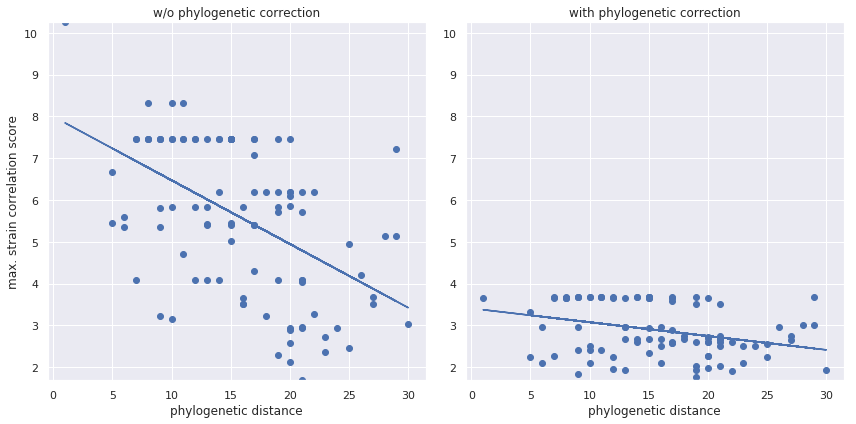

In [6]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

scale_max = max([x[1:2] for x in score_comparison])[0]
scale_min = min([x[1:2] for x in score_comparison])[0]

ax1.set_title('w/o phylogenetic correction')
ax1.set_ylabel('max. strain correlation score')
ax1.set_xlabel('phylogenetic distance')
ax1.set_ylim(scale_min, scale_max)
ax1.scatter([x[0] for x in score_comparison], [x[1] for x in score_comparison])

x = [x[0] for x in score_comparison]
y = [x[1] for x in score_comparison]
z = numpy.polyfit(x, y, 1)
p = numpy.poly1d(z)
ax1.plot(x, p(x))

ax2.set_title('with phylogenetic correction')
ax2.set_xlabel('phylogenetic distance')
ax2.set_ylim(scale_min, scale_max)
ax2.scatter([x[0] for x in score_comparison], [x[2] for x in score_comparison])

x = [x[0] for x in score_comparison]
y = [x[2] for x in score_comparison]
z = numpy.polyfit(x, y, 1)
p = numpy.poly1d(z)
ax2.plot(x, p(x))


plt.tight_layout()

plt.savefig('fig_phylo_score_correlation.pdf')

In [772]:
import scipy.stats

In [834]:
print(scipy.stats.spearmanr([x[0] for x in score_comparison], [x[1] for x in score_comparison]))
print(scipy.stats.spearmanr([x[0] for x in score_comparison], [x[2] for x in score_comparison]))

SpearmanrResult(correlation=-0.5121804222637653, pvalue=5.1239733562065784e-08)
SpearmanrResult(correlation=-0.3147386098818322, pvalue=0.0014262821954294912)


In [833]:
print(scipy.stats.pearsonr([x[0] for x in score_comparison], [x[1] for x in score_comparison]))
print(scipy.stats.pearsonr([x[0] for x in score_comparison], [x[2] for x in score_comparison]))

(-0.5052590654954373, 8.266072990037046e-08)
(-0.31016542835538985, 0.0016866469342730747)


In [819]:
salinispora_tree_copy = copy.deepcopy(salinispora_tree)
tree_colors = {}
for n in salinispora_tree_copy.get_terminals():
    if n.name in sal_pac:
        tree_colors[n.name] = 'b'
    elif n.name in sal_are:
        tree_colors[n.name] = 'r'


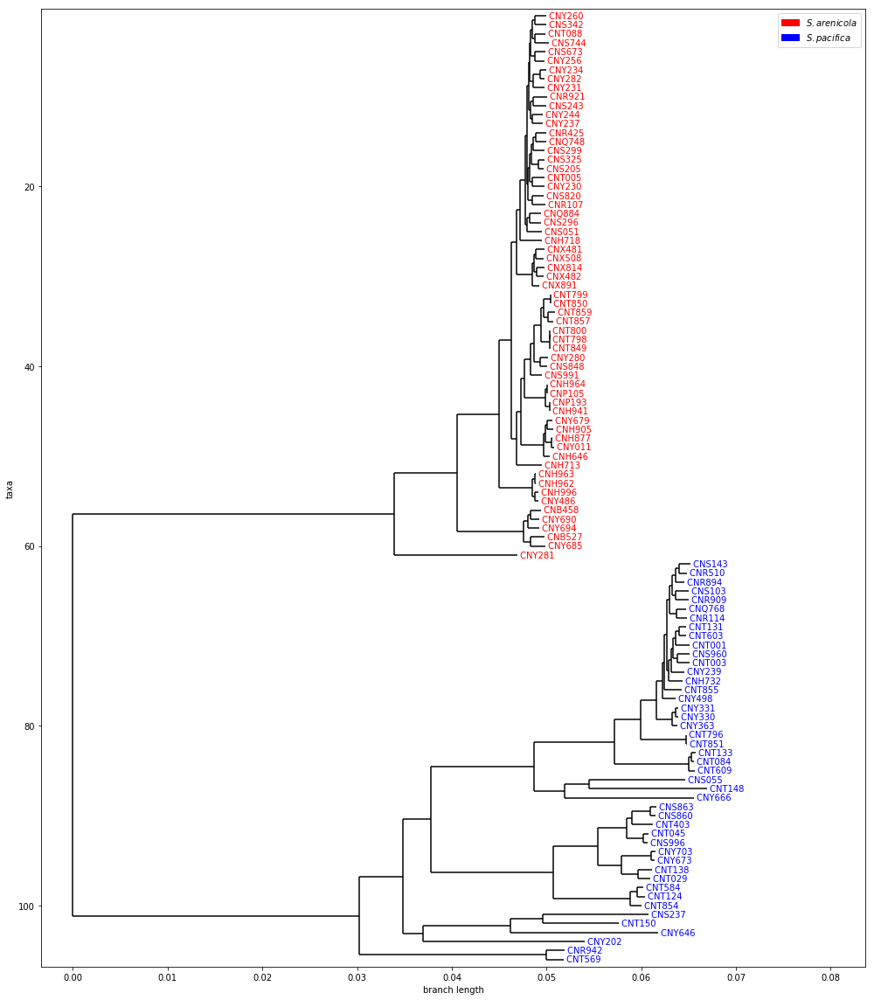

In [857]:
import matplotlib.patches as mpatches
red_patch = mpatches.Patch(color='red', label='$S. arenicola$')
blue_patch = mpatches.Patch(color='blue', label='$S. pacifica$')

f = plt.figure(figsize=(14, 16))
ax = plt.gca()
ax.legend(handles=[red_patch, blue_patch])
Phylo.draw(salinispora_tree_copy, show_confidence=False, axes=ax, label_colors=tree_colors, do_show=False)

plt.tight_layout()

plt.savefig('phylo_tree.pdf')

In [862]:
import io

In [895]:
demo_tree_full = Phylo.read(io.StringIO("((A, B), ((C, D), (E, (F, G))))"), "newick")
demo_tree_collapsed = Phylo.read(io.StringIO("($\gamma$, ((C, D), $\delta$))"), "newick")
colors = {
    'A': 'b',
    'B': 'b',
    'C': 'b',
    'D': 'r',
    'E': 'r',
    'F': 'r',
    'G': 'r',
    '$\gamma$': 'b',
    '$\delta$': 'r'
}

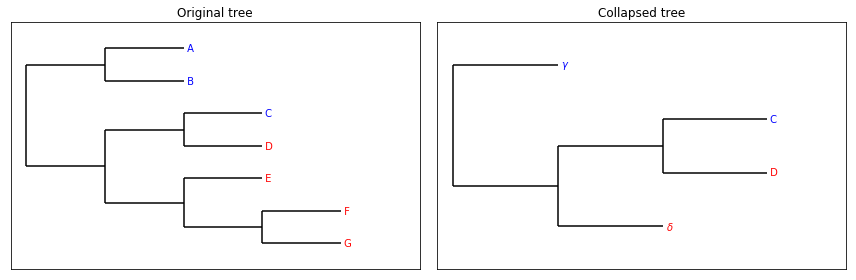

In [906]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
Phylo.draw(demo_tree_full, label_colors=colors, axes=ax1, do_show=False)
Phylo.draw(demo_tree_collapsed, label_colors=colors, axes=ax2, do_show=False)

ax1.set_title('Original tree')
ax2.set_title('Collapsed tree')

ax1.set_xticks([])
ax2.set_xticks([])
ax1.set_yticks([])
ax2.set_yticks([])
ax1.set_xlabel('')
ax1.set_ylabel('')
ax2.set_xlabel('')
ax2.set_ylabel('')

plt.tight_layout()

plt.savefig('fig_collapsing_tree.pdf')


In [ ]:
#### junk

In [908]:
mf_size = 2
gcf_size = 2
overlap = 2
population_size = 8

w_neither, w_gcf_only, w_mf_only, w_both = scoring.misc.METCALF_WEIGHTS

raw_score = scoring.misc.metcalf_count(mf_size, 
                                       gcf_size, 
                                       overlap, 
                                       population_size, 
                                       w_both, 
                                       w_mf_only, 
                                       w_gcf_only, 
                                       w_neither)

score_exp, score_var = scoring.misc.metcalf_expected_count(mf_size, 
                                                           gcf_size, 
                                                           overlap, 
                                                           population_size, 
                                                           w_both, 
                                                           w_mf_only, 
                                                           w_gcf_only, 
                                                           w_neither)

print(raw_score)
print(score_exp)
print(score_var)
print( (raw_score - score_exp) / numpy.sqrt(score_var) )

26
-5.499999999999999
141.74999999999994
2.645751311064591


In [694]:
mf_size = 2
gcf_size = 2
overlap = 0
population_size = 4

w_neither, w_gcf_only, w_mf_only, w_both = scoring.misc.METCALF_WEIGHTS

raw_score = scoring.misc.metcalf_count(mf_size, 
                                       gcf_size, 
                                       overlap, 
                                       population_size, 
                                       w_both, 
                                       w_mf_only, 
                                       w_gcf_only, 
                                       w_neither)

score_exp, score_var = scoring.misc.metcalf_expected_count(mf_size, 
                                                           gcf_size, 
                                                           overlap, 
                                                           population_size, 
                                                           w_both, 
                                                           w_mf_only, 
                                                           w_gcf_only, 
                                                           w_neither)

print( (raw_score - score_exp) / numpy.sqrt(score_var) )

-1.732050807568877


In [1011]:
def get_parent(tree, child_clade):
    try:
        return PARENT_CACHE[child_clade]
    except KeyError:
        node_path = tree.get_path(child_clade)
        PARENT_CACHE[child_clade] = node_path[-2]        
        return PARENT_CACHE[child_clade]


In [1008]:
def calculate_correlation(orig_tree, mf, gcf, collapse='all'):
    # Copy the tree
    tree = copy.deepcopy(orig_tree)  # Does this work??
    leaves = tree.get_terminals()
    
    # Set the leaf nodes to indicate mf/gcf presence (node.data['status'])
    leaves = set_leaf_properties(leaves, mf, gcf)
    
    # Collapse nodes with identical status
    if collapse:
        tree = collapse_tree_(tree, collapse)

    leaf_nodes = tree.get_terminals()
    
    #print('{} -> {} nodes'.format(len(leaves), len(leaf_nodes)))
    
    # Standardised correlation score
    population_size = len(leaf_nodes)
    mf_size = len([x for x in leaf_nodes if x.properties[0] is True])
    gcf_size = len([x for x in leaf_nodes if x.properties[1] is True])
    overlap = len([x for x in leaf_nodes if x.properties == (True, True)])
        
    # Score weights
    w_neither, w_gcf_only, w_mf_only, w_both = scoring.misc.METCALF_WEIGHTS
    
    raw_score = scoring.misc.metcalf_count(mf_size, 
                                           gcf_size, 
                                           overlap, 
                                           population_size, 
                                           w_both, 
                                           w_mf_only, 
                                           w_gcf_only, 
                                           w_neither)
    
    score_exp, score_var = scoring.misc.metcalf_expected_count(mf_size, 
                                                               gcf_size, 
                                                               overlap, 
                                                               population_size, 
                                                               w_both, 
                                                               w_mf_only, 
                                                               w_gcf_only, 
                                                               w_neither)
    
    return (raw_score - score_exp) / numpy.sqrt(score_var)

In [1009]:
def calc_all_pairs(tree, gcfs, mfs):
    score_collection = {}
    count = 0
    for gcf in gcfs:
        count += 1
        subcount = 0
        for mf in mfs:
            subcount += 1

            if subcount % 100 == 0:
                print("{}/{}, {}/{}".format(count, len(gcfs), subcount, len(mfs)))

            gcf_strain_list = str(list(gcf.strains))
            mf_strain_list = str(list(mf.strains))
            
            #print(gcf_strain_list)
            #print(mf_strain_list)
            
            if (mf_strain_list, gcf_strain_list) not in score_collection:
                phylo_score = calculate_correlation(tree, mf, gcf, collapse='all')
                score_collection[(mf_strain_list, gcf_strain_list)] = phylo_score
                
    return score_collection


In [ ]:
PARENT_CACHE = {}
res2 = calc_all_pairs(salinispora_tree, npl.gcfs, npl.molfams)

1/454, 100/3094
1/454, 200/3094
1/454, 300/3094
1/454, 400/3094
1/454, 500/3094
1/454, 600/3094
1/454, 700/3094
1/454, 800/3094
1/454, 900/3094
1/454, 1000/3094
1/454, 1100/3094
1/454, 1200/3094
1/454, 1300/3094
1/454, 1400/3094
1/454, 1500/3094
1/454, 1600/3094
1/454, 1700/3094
1/454, 1800/3094
1/454, 1900/3094
1/454, 2000/3094
1/454, 2100/3094
1/454, 2200/3094
1/454, 2300/3094
1/454, 2400/3094
1/454, 2500/3094
1/454, 2600/3094
1/454, 2700/3094
1/454, 2800/3094
1/454, 2900/3094
1/454, 3000/3094
2/454, 100/3094
2/454, 200/3094
2/454, 300/3094
2/454, 400/3094
2/454, 500/3094
2/454, 600/3094
2/454, 700/3094
2/454, 800/3094
2/454, 900/3094
2/454, 1000/3094
2/454, 1100/3094
2/454, 1200/3094
2/454, 1300/3094
2/454, 1400/3094
2/454, 1500/3094
2/454, 1600/3094
2/454, 1700/3094
2/454, 1800/3094
2/454, 1900/3094
2/454, 2000/3094
2/454, 2100/3094
2/454, 2200/3094
2/454, 2300/3094
2/454, 2400/3094
2/454, 2500/3094
2/454, 2600/3094
2/454, 2700/3094
2/454, 2800/3094
2/454, 2900/3094
2/454, 3000/309

18/454, 100/3094
18/454, 200/3094
18/454, 300/3094
18/454, 400/3094
18/454, 500/3094
18/454, 600/3094
18/454, 700/3094
18/454, 800/3094
18/454, 900/3094
18/454, 1000/3094
18/454, 1100/3094
18/454, 1200/3094
18/454, 1300/3094
18/454, 1400/3094
18/454, 1500/3094
18/454, 1600/3094
18/454, 1700/3094
18/454, 1800/3094
18/454, 1900/3094
18/454, 2000/3094
18/454, 2100/3094
18/454, 2200/3094
18/454, 2300/3094
18/454, 2400/3094
18/454, 2500/3094
18/454, 2600/3094
18/454, 2700/3094
18/454, 2800/3094
18/454, 2900/3094
18/454, 3000/3094
19/454, 100/3094
19/454, 200/3094
19/454, 300/3094
19/454, 400/3094
19/454, 500/3094
19/454, 600/3094
19/454, 700/3094
19/454, 800/3094
19/454, 900/3094
19/454, 1000/3094
19/454, 1100/3094
19/454, 1200/3094
19/454, 1300/3094
19/454, 1400/3094
19/454, 1500/3094
19/454, 1600/3094
19/454, 1700/3094
19/454, 1800/3094
19/454, 1900/3094
19/454, 2000/3094
19/454, 2100/3094
19/454, 2200/3094
19/454, 2300/3094
19/454, 2400/3094
19/454, 2500/3094
19/454, 2600/3094
19/454, 27

33/454, 1500/3094
33/454, 1600/3094
33/454, 1700/3094
33/454, 1800/3094
33/454, 1900/3094
33/454, 2000/3094
33/454, 2100/3094
33/454, 2200/3094
33/454, 2300/3094
33/454, 2400/3094
33/454, 2500/3094
33/454, 2600/3094
33/454, 2700/3094
33/454, 2800/3094
33/454, 2900/3094
33/454, 3000/3094
34/454, 100/3094
34/454, 200/3094
34/454, 300/3094
34/454, 400/3094
34/454, 500/3094
34/454, 600/3094
34/454, 700/3094
34/454, 800/3094
34/454, 900/3094
34/454, 1000/3094
34/454, 1100/3094
34/454, 1200/3094
34/454, 1300/3094
34/454, 1400/3094
34/454, 1500/3094
34/454, 1600/3094
34/454, 1700/3094
34/454, 1800/3094
34/454, 1900/3094
34/454, 2000/3094
34/454, 2100/3094
34/454, 2200/3094
34/454, 2300/3094
34/454, 2400/3094
34/454, 2500/3094
34/454, 2600/3094
34/454, 2700/3094
34/454, 2800/3094
34/454, 2900/3094
34/454, 3000/3094
35/454, 100/3094
35/454, 200/3094
35/454, 300/3094
35/454, 400/3094
35/454, 500/3094
35/454, 600/3094
35/454, 700/3094
35/454, 800/3094
35/454, 900/3094
35/454, 1000/3094
35/454, 11

49/454, 100/3094
49/454, 200/3094
49/454, 300/3094
49/454, 400/3094
49/454, 500/3094
49/454, 600/3094
49/454, 700/3094
49/454, 800/3094
49/454, 900/3094
49/454, 1000/3094
49/454, 1100/3094
49/454, 1200/3094
49/454, 1300/3094
49/454, 1400/3094
49/454, 1500/3094
49/454, 1600/3094
49/454, 1700/3094
49/454, 1800/3094
49/454, 1900/3094
49/454, 2000/3094
49/454, 2100/3094
49/454, 2200/3094
49/454, 2300/3094
49/454, 2400/3094
49/454, 2500/3094
49/454, 2600/3094
49/454, 2700/3094
49/454, 2800/3094
49/454, 2900/3094
49/454, 3000/3094
50/454, 100/3094
50/454, 200/3094
50/454, 300/3094
50/454, 400/3094
50/454, 500/3094
50/454, 600/3094
50/454, 700/3094
50/454, 800/3094
50/454, 900/3094
50/454, 1000/3094
50/454, 1100/3094
50/454, 1200/3094
50/454, 1300/3094
50/454, 1400/3094
50/454, 1500/3094
50/454, 1600/3094
50/454, 1700/3094
50/454, 1800/3094
50/454, 1900/3094
50/454, 2000/3094
50/454, 2100/3094
50/454, 2200/3094
50/454, 2300/3094
50/454, 2400/3094
50/454, 2500/3094
50/454, 2600/3094
50/454, 27

71/454, 100/3094
71/454, 200/3094
71/454, 300/3094
71/454, 400/3094
71/454, 500/3094
71/454, 600/3094
71/454, 700/3094
71/454, 800/3094
71/454, 900/3094
71/454, 1000/3094
71/454, 1100/3094
71/454, 1200/3094
71/454, 1300/3094
71/454, 1400/3094
71/454, 1500/3094
71/454, 1600/3094
71/454, 1700/3094
71/454, 1800/3094
71/454, 1900/3094
71/454, 2000/3094
71/454, 2100/3094
71/454, 2200/3094
71/454, 2300/3094
71/454, 2400/3094
71/454, 2500/3094
71/454, 2600/3094
71/454, 2700/3094
71/454, 2800/3094
71/454, 2900/3094
71/454, 3000/3094
72/454, 100/3094
72/454, 200/3094
72/454, 300/3094
72/454, 400/3094
72/454, 500/3094
72/454, 600/3094
72/454, 700/3094
72/454, 800/3094
72/454, 900/3094
72/454, 1000/3094
72/454, 1100/3094
72/454, 1200/3094
72/454, 1300/3094
72/454, 1400/3094
72/454, 1500/3094
72/454, 1600/3094
72/454, 1700/3094
72/454, 1800/3094
72/454, 1900/3094
72/454, 2000/3094
72/454, 2100/3094
72/454, 2200/3094
72/454, 2300/3094
72/454, 2400/3094
72/454, 2500/3094
72/454, 2600/3094
72/454, 27

87/454, 100/3094
87/454, 200/3094
87/454, 300/3094
87/454, 400/3094
87/454, 500/3094
87/454, 600/3094
87/454, 700/3094
87/454, 800/3094
87/454, 900/3094
87/454, 1000/3094
87/454, 1100/3094
87/454, 1200/3094
87/454, 1300/3094
87/454, 1400/3094
87/454, 1500/3094
87/454, 1600/3094
87/454, 1700/3094
87/454, 1800/3094
87/454, 1900/3094
87/454, 2000/3094
87/454, 2100/3094
87/454, 2200/3094
87/454, 2300/3094
87/454, 2400/3094
87/454, 2500/3094
87/454, 2600/3094
87/454, 2700/3094
87/454, 2800/3094
87/454, 2900/3094
87/454, 3000/3094
88/454, 100/3094
88/454, 200/3094
88/454, 300/3094
88/454, 400/3094
88/454, 500/3094
88/454, 600/3094
88/454, 700/3094
88/454, 800/3094
88/454, 900/3094
88/454, 1000/3094
88/454, 1100/3094
88/454, 1200/3094
88/454, 1300/3094
88/454, 1400/3094
88/454, 1500/3094
88/454, 1600/3094
88/454, 1700/3094
88/454, 1800/3094
88/454, 1900/3094
88/454, 2000/3094
88/454, 2100/3094
88/454, 2200/3094
88/454, 2300/3094
88/454, 2400/3094
88/454, 2500/3094
88/454, 2600/3094
88/454, 27

102/454, 1100/3094
102/454, 1200/3094
102/454, 1300/3094
102/454, 1400/3094
102/454, 1500/3094
102/454, 1600/3094
102/454, 1700/3094
102/454, 1800/3094
102/454, 1900/3094
102/454, 2000/3094
102/454, 2100/3094
102/454, 2200/3094
102/454, 2300/3094
102/454, 2400/3094
102/454, 2500/3094
102/454, 2600/3094
102/454, 2700/3094
102/454, 2800/3094
102/454, 2900/3094
102/454, 3000/3094
103/454, 100/3094
103/454, 200/3094
103/454, 300/3094
103/454, 400/3094
103/454, 500/3094
103/454, 600/3094
103/454, 700/3094
103/454, 800/3094
103/454, 900/3094
103/454, 1000/3094
103/454, 1100/3094
103/454, 1200/3094
103/454, 1300/3094
103/454, 1400/3094
103/454, 1500/3094
103/454, 1600/3094
103/454, 1700/3094
103/454, 1800/3094
103/454, 1900/3094
103/454, 2000/3094
103/454, 2100/3094
103/454, 2200/3094
103/454, 2300/3094
103/454, 2400/3094
103/454, 2500/3094
103/454, 2600/3094
103/454, 2700/3094
103/454, 2800/3094
103/454, 2900/3094
103/454, 3000/3094
104/454, 100/3094
104/454, 200/3094
104/454, 300/3094
104/4

In [971]:
res = calc_all_pairs(salinispora_tree, npl.gcfs, npl.molfams)

1/454, 100/3094
1/454, 200/3094
1/454, 300/3094
1/454, 400/3094
1/454, 500/3094
1/454, 600/3094
1/454, 700/3094
1/454, 800/3094
1/454, 900/3094
1/454, 1000/3094
1/454, 1100/3094
1/454, 1200/3094
1/454, 1300/3094
1/454, 1400/3094
1/454, 1500/3094
1/454, 1600/3094
1/454, 1700/3094
1/454, 1800/3094
1/454, 1900/3094
1/454, 2000/3094
1/454, 2100/3094
1/454, 2200/3094
1/454, 2300/3094
1/454, 2400/3094
1/454, 2500/3094
1/454, 2600/3094
1/454, 2700/3094
1/454, 2800/3094
1/454, 2900/3094
1/454, 3000/3094
2/454, 100/3094
2/454, 200/3094
2/454, 300/3094
2/454, 400/3094
2/454, 500/3094
2/454, 600/3094
2/454, 700/3094
2/454, 800/3094
2/454, 900/3094
2/454, 1000/3094
2/454, 1100/3094
2/454, 1200/3094
2/454, 1300/3094
2/454, 1400/3094
2/454, 1500/3094
2/454, 1600/3094
2/454, 1700/3094
2/454, 1800/3094
2/454, 1900/3094
2/454, 2000/3094
2/454, 2100/3094
2/454, 2200/3094
2/454, 2300/3094
2/454, 2400/3094
2/454, 2500/3094
2/454, 2600/3094
2/454, 2700/3094
2/454, 2800/3094
2/454, 2900/3094
2/454, 3000/309

18/454, 100/3094
18/454, 200/3094
18/454, 300/3094
18/454, 400/3094
18/454, 500/3094
18/454, 600/3094
18/454, 700/3094
18/454, 800/3094
18/454, 900/3094
18/454, 1000/3094
18/454, 1100/3094
18/454, 1200/3094
18/454, 1300/3094
18/454, 1400/3094
18/454, 1500/3094
18/454, 1600/3094
18/454, 1700/3094
18/454, 1800/3094
18/454, 1900/3094
18/454, 2000/3094
18/454, 2100/3094
18/454, 2200/3094
18/454, 2300/3094
18/454, 2400/3094
18/454, 2500/3094
18/454, 2600/3094
18/454, 2700/3094
18/454, 2800/3094
18/454, 2900/3094
18/454, 3000/3094
19/454, 100/3094
19/454, 200/3094
19/454, 300/3094
19/454, 400/3094
19/454, 500/3094
19/454, 600/3094
19/454, 700/3094
19/454, 800/3094
19/454, 900/3094
19/454, 1000/3094
19/454, 1100/3094
19/454, 1200/3094
19/454, 1300/3094
19/454, 1400/3094
19/454, 1500/3094
19/454, 1600/3094
19/454, 1700/3094
19/454, 1800/3094
19/454, 1900/3094
19/454, 2000/3094
19/454, 2100/3094
19/454, 2200/3094
19/454, 2300/3094
19/454, 2400/3094
19/454, 2500/3094
19/454, 2600/3094
19/454, 27

33/454, 1500/3094
33/454, 1600/3094
33/454, 1700/3094
33/454, 1800/3094
33/454, 1900/3094
33/454, 2000/3094
33/454, 2100/3094
33/454, 2200/3094
33/454, 2300/3094
33/454, 2400/3094
33/454, 2500/3094
33/454, 2600/3094
33/454, 2700/3094
33/454, 2800/3094
33/454, 2900/3094
33/454, 3000/3094
34/454, 100/3094
34/454, 200/3094
34/454, 300/3094
34/454, 400/3094
34/454, 500/3094
34/454, 600/3094
34/454, 700/3094
34/454, 800/3094
34/454, 900/3094
34/454, 1000/3094
34/454, 1100/3094
34/454, 1200/3094
34/454, 1300/3094
34/454, 1400/3094
34/454, 1500/3094
34/454, 1600/3094
34/454, 1700/3094
34/454, 1800/3094
34/454, 1900/3094
34/454, 2000/3094
34/454, 2100/3094
34/454, 2200/3094
34/454, 2300/3094
34/454, 2400/3094
34/454, 2500/3094
34/454, 2600/3094
34/454, 2700/3094
34/454, 2800/3094
34/454, 2900/3094
34/454, 3000/3094
35/454, 100/3094
35/454, 200/3094
35/454, 300/3094
35/454, 400/3094
35/454, 500/3094
35/454, 600/3094
35/454, 700/3094
35/454, 800/3094
35/454, 900/3094
35/454, 1000/3094
35/454, 11

49/454, 100/3094
49/454, 200/3094
49/454, 300/3094
49/454, 400/3094
49/454, 500/3094
49/454, 600/3094
49/454, 700/3094
49/454, 800/3094
49/454, 900/3094
49/454, 1000/3094
49/454, 1100/3094
49/454, 1200/3094
49/454, 1300/3094
49/454, 1400/3094
49/454, 1500/3094
49/454, 1600/3094
49/454, 1700/3094
49/454, 1800/3094
49/454, 1900/3094
49/454, 2000/3094
49/454, 2100/3094
49/454, 2200/3094
49/454, 2300/3094
49/454, 2400/3094
49/454, 2500/3094
49/454, 2600/3094
49/454, 2700/3094
49/454, 2800/3094
49/454, 2900/3094
49/454, 3000/3094
50/454, 100/3094
50/454, 200/3094
50/454, 300/3094
50/454, 400/3094
50/454, 500/3094
50/454, 600/3094
50/454, 700/3094
50/454, 800/3094
50/454, 900/3094
50/454, 1000/3094
50/454, 1100/3094
50/454, 1200/3094
50/454, 1300/3094
50/454, 1400/3094
50/454, 1500/3094
50/454, 1600/3094
50/454, 1700/3094
50/454, 1800/3094
50/454, 1900/3094
50/454, 2000/3094
50/454, 2100/3094
50/454, 2200/3094
50/454, 2300/3094
50/454, 2400/3094
50/454, 2500/3094
50/454, 2600/3094
50/454, 27

71/454, 100/3094
71/454, 200/3094
71/454, 300/3094
71/454, 400/3094
71/454, 500/3094
71/454, 600/3094
71/454, 700/3094
71/454, 800/3094
71/454, 900/3094
71/454, 1000/3094
71/454, 1100/3094
71/454, 1200/3094
71/454, 1300/3094
71/454, 1400/3094
71/454, 1500/3094
71/454, 1600/3094
71/454, 1700/3094
71/454, 1800/3094
71/454, 1900/3094
71/454, 2000/3094
71/454, 2100/3094
71/454, 2200/3094
71/454, 2300/3094
71/454, 2400/3094
71/454, 2500/3094
71/454, 2600/3094
71/454, 2700/3094
71/454, 2800/3094
71/454, 2900/3094
71/454, 3000/3094
72/454, 100/3094
72/454, 200/3094
72/454, 300/3094
72/454, 400/3094
72/454, 500/3094
72/454, 600/3094
72/454, 700/3094
72/454, 800/3094
72/454, 900/3094
72/454, 1000/3094
72/454, 1100/3094
72/454, 1200/3094
72/454, 1300/3094
72/454, 1400/3094
72/454, 1500/3094
72/454, 1600/3094
72/454, 1700/3094
72/454, 1800/3094
72/454, 1900/3094
72/454, 2000/3094
72/454, 2100/3094
72/454, 2200/3094
72/454, 2300/3094
72/454, 2400/3094
72/454, 2500/3094
72/454, 2600/3094
72/454, 27

87/454, 100/3094
87/454, 200/3094
87/454, 300/3094
87/454, 400/3094
87/454, 500/3094
87/454, 600/3094
87/454, 700/3094
87/454, 800/3094
87/454, 900/3094
87/454, 1000/3094
87/454, 1100/3094
87/454, 1200/3094
87/454, 1300/3094
87/454, 1400/3094
87/454, 1500/3094
87/454, 1600/3094
87/454, 1700/3094
87/454, 1800/3094
87/454, 1900/3094
87/454, 2000/3094
87/454, 2100/3094
87/454, 2200/3094
87/454, 2300/3094
87/454, 2400/3094
87/454, 2500/3094
87/454, 2600/3094
87/454, 2700/3094
87/454, 2800/3094
87/454, 2900/3094
87/454, 3000/3094
88/454, 100/3094
88/454, 200/3094
88/454, 300/3094
88/454, 400/3094
88/454, 500/3094
88/454, 600/3094
88/454, 700/3094
88/454, 800/3094
88/454, 900/3094
88/454, 1000/3094
88/454, 1100/3094
88/454, 1200/3094
88/454, 1300/3094
88/454, 1400/3094
88/454, 1500/3094
88/454, 1600/3094
88/454, 1700/3094
88/454, 1800/3094
88/454, 1900/3094
88/454, 2000/3094
88/454, 2100/3094
88/454, 2200/3094
88/454, 2300/3094
88/454, 2400/3094
88/454, 2500/3094
88/454, 2600/3094
88/454, 27

102/454, 1100/3094
102/454, 1200/3094
102/454, 1300/3094
102/454, 1400/3094
102/454, 1500/3094
102/454, 1600/3094
102/454, 1700/3094
102/454, 1800/3094
102/454, 1900/3094
102/454, 2000/3094
102/454, 2100/3094
102/454, 2200/3094
102/454, 2300/3094
102/454, 2400/3094
102/454, 2500/3094
102/454, 2600/3094
102/454, 2700/3094
102/454, 2800/3094
102/454, 2900/3094
102/454, 3000/3094
103/454, 100/3094
103/454, 200/3094
103/454, 300/3094
103/454, 400/3094
103/454, 500/3094
103/454, 600/3094
103/454, 700/3094
103/454, 800/3094
103/454, 900/3094
103/454, 1000/3094
103/454, 1100/3094
103/454, 1200/3094
103/454, 1300/3094
103/454, 1400/3094
103/454, 1500/3094
103/454, 1600/3094
103/454, 1700/3094
103/454, 1800/3094
103/454, 1900/3094
103/454, 2000/3094
103/454, 2100/3094
103/454, 2200/3094
103/454, 2300/3094
103/454, 2400/3094
103/454, 2500/3094
103/454, 2600/3094
103/454, 2700/3094
103/454, 2800/3094
103/454, 2900/3094
103/454, 3000/3094
104/454, 100/3094
104/454, 200/3094
104/454, 300/3094
104/4

117/454, 700/3094
117/454, 800/3094
117/454, 900/3094
117/454, 1000/3094
117/454, 1100/3094
117/454, 1200/3094
117/454, 1300/3094
117/454, 1400/3094
117/454, 1500/3094
117/454, 1600/3094
117/454, 1700/3094
117/454, 1800/3094
117/454, 1900/3094
117/454, 2000/3094
117/454, 2100/3094
117/454, 2200/3094
117/454, 2300/3094
117/454, 2400/3094
117/454, 2500/3094
117/454, 2600/3094
117/454, 2700/3094
117/454, 2800/3094
117/454, 2900/3094
117/454, 3000/3094
118/454, 100/3094
118/454, 200/3094
118/454, 300/3094
118/454, 400/3094
118/454, 500/3094
118/454, 600/3094
118/454, 700/3094
118/454, 800/3094
118/454, 900/3094
118/454, 1000/3094
118/454, 1100/3094
118/454, 1200/3094
118/454, 1300/3094
118/454, 1400/3094
118/454, 1500/3094
118/454, 1600/3094
118/454, 1700/3094
118/454, 1800/3094
118/454, 1900/3094
118/454, 2000/3094
118/454, 2100/3094
118/454, 2200/3094
118/454, 2300/3094
118/454, 2400/3094
118/454, 2500/3094
118/454, 2600/3094
118/454, 2700/3094
118/454, 2800/3094
118/454, 2900/3094
118/4

131/454, 2500/3094
131/454, 2600/3094
131/454, 2700/3094
131/454, 2800/3094
131/454, 2900/3094
131/454, 3000/3094
132/454, 100/3094
132/454, 200/3094
132/454, 300/3094
132/454, 400/3094
132/454, 500/3094
132/454, 600/3094
132/454, 700/3094
132/454, 800/3094
132/454, 900/3094
132/454, 1000/3094
132/454, 1100/3094
132/454, 1200/3094
132/454, 1300/3094
132/454, 1400/3094
132/454, 1500/3094
132/454, 1600/3094
132/454, 1700/3094
132/454, 1800/3094
132/454, 1900/3094
132/454, 2000/3094
132/454, 2100/3094
132/454, 2200/3094
132/454, 2300/3094
132/454, 2400/3094
132/454, 2500/3094
132/454, 2600/3094
132/454, 2700/3094
132/454, 2800/3094
132/454, 2900/3094
132/454, 3000/3094
133/454, 100/3094
133/454, 200/3094
133/454, 300/3094
133/454, 400/3094
133/454, 500/3094
133/454, 600/3094
133/454, 700/3094
133/454, 800/3094
133/454, 900/3094
133/454, 1000/3094
133/454, 1100/3094
133/454, 1200/3094
133/454, 1300/3094
133/454, 1400/3094
133/454, 1500/3094
133/454, 1600/3094
133/454, 1700/3094
133/454, 18

146/454, 1400/3094
146/454, 1500/3094
146/454, 1600/3094
146/454, 1700/3094
146/454, 1800/3094
146/454, 1900/3094
146/454, 2000/3094
146/454, 2100/3094
146/454, 2200/3094
146/454, 2300/3094
146/454, 2400/3094
146/454, 2500/3094
146/454, 2600/3094
146/454, 2700/3094
146/454, 2800/3094
146/454, 2900/3094
146/454, 3000/3094
147/454, 100/3094
147/454, 200/3094
147/454, 300/3094
147/454, 400/3094
147/454, 500/3094
147/454, 600/3094
147/454, 700/3094
147/454, 800/3094
147/454, 900/3094
147/454, 1000/3094
147/454, 1100/3094
147/454, 1200/3094
147/454, 1300/3094
147/454, 1400/3094
147/454, 1500/3094
147/454, 1600/3094
147/454, 1700/3094
147/454, 1800/3094
147/454, 1900/3094
147/454, 2000/3094
147/454, 2100/3094
147/454, 2200/3094
147/454, 2300/3094
147/454, 2400/3094
147/454, 2500/3094
147/454, 2600/3094
147/454, 2700/3094
147/454, 2800/3094
147/454, 2900/3094
147/454, 3000/3094
148/454, 100/3094
148/454, 200/3094
148/454, 300/3094
148/454, 400/3094
148/454, 500/3094
148/454, 600/3094
148/454,

161/454, 200/3094
161/454, 300/3094
161/454, 400/3094
161/454, 500/3094
161/454, 600/3094
161/454, 700/3094
161/454, 800/3094
161/454, 900/3094
161/454, 1000/3094
161/454, 1100/3094
161/454, 1200/3094
161/454, 1300/3094
161/454, 1400/3094
161/454, 1500/3094
161/454, 1600/3094
161/454, 1700/3094
161/454, 1800/3094
161/454, 1900/3094
161/454, 2000/3094
161/454, 2100/3094
161/454, 2200/3094
161/454, 2300/3094
161/454, 2400/3094
161/454, 2500/3094
161/454, 2600/3094
161/454, 2700/3094
161/454, 2800/3094
161/454, 2900/3094
161/454, 3000/3094
162/454, 100/3094
162/454, 200/3094
162/454, 300/3094
162/454, 400/3094
162/454, 500/3094
162/454, 600/3094
162/454, 700/3094
162/454, 800/3094
162/454, 900/3094
162/454, 1000/3094
162/454, 1100/3094
162/454, 1200/3094
162/454, 1300/3094
162/454, 1400/3094
162/454, 1500/3094
162/454, 1600/3094
162/454, 1700/3094
162/454, 1800/3094
162/454, 1900/3094
162/454, 2000/3094
162/454, 2100/3094
162/454, 2200/3094
162/454, 2300/3094
162/454, 2400/3094
162/454, 2

178/454, 100/3094
178/454, 200/3094
178/454, 300/3094
178/454, 400/3094
178/454, 500/3094
178/454, 600/3094
178/454, 700/3094
178/454, 800/3094
178/454, 900/3094
178/454, 1000/3094
178/454, 1100/3094
178/454, 1200/3094
178/454, 1300/3094
178/454, 1400/3094
178/454, 1500/3094
178/454, 1600/3094
178/454, 1700/3094
178/454, 1800/3094
178/454, 1900/3094
178/454, 2000/3094
178/454, 2100/3094
178/454, 2200/3094
178/454, 2300/3094
178/454, 2400/3094
178/454, 2500/3094
178/454, 2600/3094
178/454, 2700/3094
178/454, 2800/3094
178/454, 2900/3094
178/454, 3000/3094
179/454, 100/3094
179/454, 200/3094
179/454, 300/3094
179/454, 400/3094
179/454, 500/3094
179/454, 600/3094
179/454, 700/3094
179/454, 800/3094
179/454, 900/3094
179/454, 1000/3094
179/454, 1100/3094
179/454, 1200/3094
179/454, 1300/3094
179/454, 1400/3094
179/454, 1500/3094
179/454, 1600/3094
179/454, 1700/3094
179/454, 1800/3094
179/454, 1900/3094
179/454, 2000/3094
179/454, 2100/3094
179/454, 2200/3094
179/454, 2300/3094
179/454, 24

194/454, 100/3094
194/454, 200/3094
194/454, 300/3094
194/454, 400/3094
194/454, 500/3094
194/454, 600/3094
194/454, 700/3094
194/454, 800/3094
194/454, 900/3094
194/454, 1000/3094
194/454, 1100/3094
194/454, 1200/3094
194/454, 1300/3094
194/454, 1400/3094
194/454, 1500/3094
194/454, 1600/3094
194/454, 1700/3094
194/454, 1800/3094
194/454, 1900/3094
194/454, 2000/3094
194/454, 2100/3094
194/454, 2200/3094
194/454, 2300/3094
194/454, 2400/3094
194/454, 2500/3094
194/454, 2600/3094
194/454, 2700/3094
194/454, 2800/3094
194/454, 2900/3094
194/454, 3000/3094
195/454, 100/3094
195/454, 200/3094
195/454, 300/3094
195/454, 400/3094
195/454, 500/3094
195/454, 600/3094
195/454, 700/3094
195/454, 800/3094
195/454, 900/3094
195/454, 1000/3094
195/454, 1100/3094
195/454, 1200/3094
195/454, 1300/3094
195/454, 1400/3094
195/454, 1500/3094
195/454, 1600/3094
195/454, 1700/3094
195/454, 1800/3094
195/454, 1900/3094
195/454, 2000/3094
195/454, 2100/3094
195/454, 2200/3094
195/454, 2300/3094
195/454, 24

208/454, 2000/3094
208/454, 2100/3094
208/454, 2200/3094
208/454, 2300/3094
208/454, 2400/3094
208/454, 2500/3094
208/454, 2600/3094
208/454, 2700/3094
208/454, 2800/3094
208/454, 2900/3094
208/454, 3000/3094
209/454, 100/3094
209/454, 200/3094
209/454, 300/3094
209/454, 400/3094
209/454, 500/3094
209/454, 600/3094
209/454, 700/3094
209/454, 800/3094
209/454, 900/3094
209/454, 1000/3094
209/454, 1100/3094
209/454, 1200/3094
209/454, 1300/3094
209/454, 1400/3094
209/454, 1500/3094
209/454, 1600/3094
209/454, 1700/3094
209/454, 1800/3094
209/454, 1900/3094
209/454, 2000/3094
209/454, 2100/3094
209/454, 2200/3094
209/454, 2300/3094
209/454, 2400/3094
209/454, 2500/3094
209/454, 2600/3094
209/454, 2700/3094
209/454, 2800/3094
209/454, 2900/3094
209/454, 3000/3094
210/454, 100/3094
210/454, 200/3094
210/454, 300/3094
210/454, 400/3094
210/454, 500/3094
210/454, 600/3094
210/454, 700/3094
210/454, 800/3094
210/454, 900/3094
210/454, 1000/3094
210/454, 1100/3094
210/454, 1200/3094
210/454, 13

223/454, 900/3094
223/454, 1000/3094
223/454, 1100/3094
223/454, 1200/3094
223/454, 1300/3094
223/454, 1400/3094
223/454, 1500/3094
223/454, 1600/3094
223/454, 1700/3094
223/454, 1800/3094
223/454, 1900/3094
223/454, 2000/3094
223/454, 2100/3094
223/454, 2200/3094
223/454, 2300/3094
223/454, 2400/3094
223/454, 2500/3094
223/454, 2600/3094
223/454, 2700/3094
223/454, 2800/3094
223/454, 2900/3094
223/454, 3000/3094
224/454, 100/3094
224/454, 200/3094
224/454, 300/3094
224/454, 400/3094
224/454, 500/3094
224/454, 600/3094
224/454, 700/3094
224/454, 800/3094
224/454, 900/3094
224/454, 1000/3094
224/454, 1100/3094
224/454, 1200/3094
224/454, 1300/3094
224/454, 1400/3094
224/454, 1500/3094
224/454, 1600/3094
224/454, 1700/3094
224/454, 1800/3094
224/454, 1900/3094
224/454, 2000/3094
224/454, 2100/3094
224/454, 2200/3094
224/454, 2300/3094
224/454, 2400/3094
224/454, 2500/3094
224/454, 2600/3094
224/454, 2700/3094
224/454, 2800/3094
224/454, 2900/3094
224/454, 3000/3094
225/454, 100/3094
225/

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



247/454, 200/3094
247/454, 300/3094
247/454, 400/3094
247/454, 500/3094
247/454, 600/3094
247/454, 700/3094
247/454, 800/3094
247/454, 900/3094
247/454, 1000/3094
247/454, 1100/3094
247/454, 1200/3094
247/454, 1300/3094
247/454, 1400/3094
247/454, 1500/3094
247/454, 1600/3094
247/454, 1700/3094
247/454, 1800/3094
247/454, 1900/3094
247/454, 2000/3094
247/454, 2100/3094
247/454, 2200/3094
247/454, 2300/3094
247/454, 2400/3094
247/454, 2500/3094
247/454, 2600/3094
247/454, 2700/3094
247/454, 2800/3094
247/454, 2900/3094
247/454, 3000/3094
248/454, 100/3094
248/454, 200/3094
248/454, 300/3094
248/454, 400/3094
248/454, 500/3094
248/454, 600/3094
248/454, 700/3094
248/454, 800/3094
248/454, 900/3094
248/454, 1000/3094
248/454, 1100/3094
248/454, 1200/3094
248/454, 1300/3094
248/454, 1400/3094
248/454, 1500/3094
248/454, 1600/3094
248/454, 1700/3094
248/454, 1800/3094
248/454, 1900/3094
248/454, 2000/3094
248/454, 2100/3094
248/454, 2200/3094
248/454, 2300/3094
248/454, 2400/3094
248/454, 2

261/454, 2100/3094
261/454, 2200/3094
261/454, 2300/3094
261/454, 2400/3094
261/454, 2500/3094
261/454, 2600/3094
261/454, 2700/3094
261/454, 2800/3094
261/454, 2900/3094
261/454, 3000/3094
262/454, 100/3094
262/454, 200/3094
262/454, 300/3094
262/454, 400/3094
262/454, 500/3094
262/454, 600/3094
262/454, 700/3094
262/454, 800/3094
262/454, 900/3094
262/454, 1000/3094
262/454, 1100/3094
262/454, 1200/3094
262/454, 1300/3094
262/454, 1400/3094
262/454, 1500/3094
262/454, 1600/3094
262/454, 1700/3094
262/454, 1800/3094
262/454, 1900/3094
262/454, 2000/3094
262/454, 2100/3094
262/454, 2200/3094
262/454, 2300/3094
262/454, 2400/3094
262/454, 2500/3094
262/454, 2600/3094
262/454, 2700/3094
262/454, 2800/3094
262/454, 2900/3094
262/454, 3000/3094
263/454, 100/3094
263/454, 200/3094
263/454, 300/3094
263/454, 400/3094
263/454, 500/3094
263/454, 600/3094
263/454, 700/3094
263/454, 800/3094
263/454, 900/3094
263/454, 1000/3094
263/454, 1100/3094
263/454, 1200/3094
263/454, 1300/3094
263/454, 14

276/454, 1000/3094
276/454, 1100/3094
276/454, 1200/3094
276/454, 1300/3094
276/454, 1400/3094
276/454, 1500/3094
276/454, 1600/3094
276/454, 1700/3094
276/454, 1800/3094
276/454, 1900/3094
276/454, 2000/3094
276/454, 2100/3094
276/454, 2200/3094
276/454, 2300/3094
276/454, 2400/3094
276/454, 2500/3094
276/454, 2600/3094
276/454, 2700/3094
276/454, 2800/3094
276/454, 2900/3094
276/454, 3000/3094
277/454, 100/3094
277/454, 200/3094
277/454, 300/3094
277/454, 400/3094
277/454, 500/3094
277/454, 600/3094
277/454, 700/3094
277/454, 800/3094
277/454, 900/3094
277/454, 1000/3094
277/454, 1100/3094
277/454, 1200/3094
277/454, 1300/3094
277/454, 1400/3094
277/454, 1500/3094
277/454, 1600/3094
277/454, 1700/3094
277/454, 1800/3094
277/454, 1900/3094
277/454, 2000/3094
277/454, 2100/3094
277/454, 2200/3094
277/454, 2300/3094
277/454, 2400/3094
277/454, 2500/3094
277/454, 2600/3094
277/454, 2700/3094
277/454, 2800/3094
277/454, 2900/3094
277/454, 3000/3094
278/454, 100/3094
278/454, 200/3094
278/

290/454, 2800/3094
290/454, 2900/3094
290/454, 3000/3094
291/454, 100/3094
291/454, 200/3094
291/454, 300/3094
291/454, 400/3094
291/454, 500/3094
291/454, 600/3094
291/454, 700/3094
291/454, 800/3094
291/454, 900/3094
291/454, 1000/3094
291/454, 1100/3094
291/454, 1200/3094
291/454, 1300/3094
291/454, 1400/3094
291/454, 1500/3094
291/454, 1600/3094
291/454, 1700/3094
291/454, 1800/3094
291/454, 1900/3094
291/454, 2000/3094
291/454, 2100/3094
291/454, 2200/3094
291/454, 2300/3094
291/454, 2400/3094
291/454, 2500/3094
291/454, 2600/3094
291/454, 2700/3094
291/454, 2800/3094
291/454, 2900/3094
291/454, 3000/3094
292/454, 100/3094
292/454, 200/3094
292/454, 300/3094
292/454, 400/3094
292/454, 500/3094
292/454, 600/3094
292/454, 700/3094
292/454, 800/3094
292/454, 900/3094
292/454, 1000/3094
292/454, 1100/3094
292/454, 1200/3094
292/454, 1300/3094
292/454, 1400/3094
292/454, 1500/3094
292/454, 1600/3094
292/454, 1700/3094
292/454, 1800/3094
292/454, 1900/3094
292/454, 2000/3094
292/454, 21

305/454, 1700/3094
305/454, 1800/3094
305/454, 1900/3094
305/454, 2000/3094
305/454, 2100/3094
305/454, 2200/3094
305/454, 2300/3094
305/454, 2400/3094
305/454, 2500/3094
305/454, 2600/3094
305/454, 2700/3094
305/454, 2800/3094
305/454, 2900/3094
305/454, 3000/3094
306/454, 100/3094
306/454, 200/3094
306/454, 300/3094
306/454, 400/3094
306/454, 500/3094
306/454, 600/3094
306/454, 700/3094
306/454, 800/3094
306/454, 900/3094
306/454, 1000/3094
306/454, 1100/3094
306/454, 1200/3094
306/454, 1300/3094
306/454, 1400/3094
306/454, 1500/3094
306/454, 1600/3094
306/454, 1700/3094
306/454, 1800/3094
306/454, 1900/3094
306/454, 2000/3094
306/454, 2100/3094
306/454, 2200/3094
306/454, 2300/3094
306/454, 2400/3094
306/454, 2500/3094
306/454, 2600/3094
306/454, 2700/3094
306/454, 2800/3094
306/454, 2900/3094
306/454, 3000/3094
307/454, 100/3094
307/454, 200/3094
307/454, 300/3094
307/454, 400/3094
307/454, 500/3094
307/454, 600/3094
307/454, 700/3094
307/454, 800/3094
307/454, 900/3094
307/454, 10

320/454, 600/3094
320/454, 700/3094
320/454, 800/3094
320/454, 900/3094
320/454, 1000/3094
320/454, 1100/3094
320/454, 1200/3094
320/454, 1300/3094
320/454, 1400/3094
320/454, 1500/3094
320/454, 1600/3094
320/454, 1700/3094
320/454, 1800/3094
320/454, 1900/3094
320/454, 2000/3094
320/454, 2100/3094
320/454, 2200/3094
320/454, 2300/3094
320/454, 2400/3094
320/454, 2500/3094
320/454, 2600/3094
320/454, 2700/3094
320/454, 2800/3094
320/454, 2900/3094
320/454, 3000/3094
321/454, 100/3094
321/454, 200/3094
321/454, 300/3094
321/454, 400/3094
321/454, 500/3094
321/454, 600/3094
321/454, 700/3094
321/454, 800/3094
321/454, 900/3094
321/454, 1000/3094
321/454, 1100/3094
321/454, 1200/3094
321/454, 1300/3094
321/454, 1400/3094
321/454, 1500/3094
321/454, 1600/3094
321/454, 1700/3094
321/454, 1800/3094
321/454, 1900/3094
321/454, 2000/3094
321/454, 2100/3094
321/454, 2200/3094
321/454, 2300/3094
321/454, 2400/3094
321/454, 2500/3094
321/454, 2600/3094
321/454, 2700/3094
321/454, 2800/3094
321/45

334/454, 2500/3094
334/454, 2600/3094
334/454, 2700/3094
334/454, 2800/3094
334/454, 2900/3094
334/454, 3000/3094
335/454, 100/3094
335/454, 200/3094
335/454, 300/3094
335/454, 400/3094
335/454, 500/3094
335/454, 600/3094
335/454, 700/3094
335/454, 800/3094
335/454, 900/3094
335/454, 1000/3094
335/454, 1100/3094
335/454, 1200/3094
335/454, 1300/3094
335/454, 1400/3094
335/454, 1500/3094
335/454, 1600/3094
335/454, 1700/3094
335/454, 1800/3094
335/454, 1900/3094
335/454, 2000/3094
335/454, 2100/3094
335/454, 2200/3094
335/454, 2300/3094
335/454, 2400/3094
335/454, 2500/3094
335/454, 2600/3094
335/454, 2700/3094
335/454, 2800/3094
335/454, 2900/3094
335/454, 3000/3094
336/454, 100/3094
336/454, 200/3094
336/454, 300/3094
336/454, 400/3094
336/454, 500/3094
336/454, 600/3094
336/454, 700/3094
336/454, 800/3094
336/454, 900/3094
336/454, 1000/3094
336/454, 1100/3094
336/454, 1200/3094
336/454, 1300/3094
336/454, 1400/3094
336/454, 1500/3094
336/454, 1600/3094
336/454, 1700/3094
336/454, 18

351/454, 100/3094
351/454, 200/3094
351/454, 300/3094
351/454, 400/3094
351/454, 500/3094
351/454, 600/3094
351/454, 700/3094
351/454, 800/3094
351/454, 900/3094
351/454, 1000/3094
351/454, 1100/3094
351/454, 1200/3094
351/454, 1300/3094
351/454, 1400/3094
351/454, 1500/3094
351/454, 1600/3094
351/454, 1700/3094
351/454, 1800/3094
351/454, 1900/3094
351/454, 2000/3094
351/454, 2100/3094
351/454, 2200/3094
351/454, 2300/3094
351/454, 2400/3094
351/454, 2500/3094
351/454, 2600/3094
351/454, 2700/3094
351/454, 2800/3094
351/454, 2900/3094
351/454, 3000/3094
352/454, 100/3094
352/454, 200/3094
352/454, 300/3094
352/454, 400/3094
352/454, 500/3094
352/454, 600/3094
352/454, 700/3094
352/454, 800/3094
352/454, 900/3094
352/454, 1000/3094
352/454, 1100/3094
352/454, 1200/3094
352/454, 1300/3094
352/454, 1400/3094
352/454, 1500/3094
352/454, 1600/3094
352/454, 1700/3094
352/454, 1800/3094
352/454, 1900/3094
352/454, 2000/3094
352/454, 2100/3094
352/454, 2200/3094
352/454, 2300/3094
352/454, 24

365/454, 2000/3094
365/454, 2100/3094
365/454, 2200/3094
365/454, 2300/3094
365/454, 2400/3094
365/454, 2500/3094
365/454, 2600/3094
365/454, 2700/3094
365/454, 2800/3094
365/454, 2900/3094
365/454, 3000/3094
366/454, 100/3094
366/454, 200/3094
366/454, 300/3094
366/454, 400/3094
366/454, 500/3094
366/454, 600/3094
366/454, 700/3094
366/454, 800/3094
366/454, 900/3094
366/454, 1000/3094
366/454, 1100/3094
366/454, 1200/3094
366/454, 1300/3094
366/454, 1400/3094
366/454, 1500/3094
366/454, 1600/3094
366/454, 1700/3094
366/454, 1800/3094
366/454, 1900/3094
366/454, 2000/3094
366/454, 2100/3094
366/454, 2200/3094
366/454, 2300/3094
366/454, 2400/3094
366/454, 2500/3094
366/454, 2600/3094
366/454, 2700/3094
366/454, 2800/3094
366/454, 2900/3094
366/454, 3000/3094
367/454, 100/3094
367/454, 200/3094
367/454, 300/3094
367/454, 400/3094
367/454, 500/3094
367/454, 600/3094
367/454, 700/3094
367/454, 800/3094
367/454, 900/3094
367/454, 1000/3094
367/454, 1100/3094
367/454, 1200/3094
367/454, 13

381/454, 100/3094
381/454, 200/3094
381/454, 300/3094
381/454, 400/3094
381/454, 500/3094
381/454, 600/3094
381/454, 700/3094
381/454, 800/3094
381/454, 900/3094
381/454, 1000/3094
381/454, 1100/3094
381/454, 1200/3094
381/454, 1300/3094
381/454, 1400/3094
381/454, 1500/3094
381/454, 1600/3094
381/454, 1700/3094
381/454, 1800/3094
381/454, 1900/3094
381/454, 2000/3094
381/454, 2100/3094
381/454, 2200/3094
381/454, 2300/3094
381/454, 2400/3094
381/454, 2500/3094
381/454, 2600/3094
381/454, 2700/3094
381/454, 2800/3094
381/454, 2900/3094
381/454, 3000/3094
382/454, 100/3094
382/454, 200/3094
382/454, 300/3094
382/454, 400/3094
382/454, 500/3094
382/454, 600/3094
382/454, 700/3094
382/454, 800/3094
382/454, 900/3094
382/454, 1000/3094
382/454, 1100/3094
382/454, 1200/3094
382/454, 1300/3094
382/454, 1400/3094
382/454, 1500/3094
382/454, 1600/3094
382/454, 1700/3094
382/454, 1800/3094
382/454, 1900/3094
382/454, 2000/3094
382/454, 2100/3094
382/454, 2200/3094
382/454, 2300/3094
382/454, 24

395/454, 2000/3094
395/454, 2100/3094
395/454, 2200/3094
395/454, 2300/3094
395/454, 2400/3094
395/454, 2500/3094
395/454, 2600/3094
395/454, 2700/3094
395/454, 2800/3094
395/454, 2900/3094
395/454, 3000/3094
396/454, 100/3094
396/454, 200/3094
396/454, 300/3094
396/454, 400/3094
396/454, 500/3094
396/454, 600/3094
396/454, 700/3094
396/454, 800/3094
396/454, 900/3094
396/454, 1000/3094
396/454, 1100/3094
396/454, 1200/3094
396/454, 1300/3094
396/454, 1400/3094
396/454, 1500/3094
396/454, 1600/3094
396/454, 1700/3094
396/454, 1800/3094
396/454, 1900/3094
396/454, 2000/3094
396/454, 2100/3094
396/454, 2200/3094
396/454, 2300/3094
396/454, 2400/3094
396/454, 2500/3094
396/454, 2600/3094
396/454, 2700/3094
396/454, 2800/3094
396/454, 2900/3094
396/454, 3000/3094
397/454, 100/3094
397/454, 200/3094
397/454, 300/3094
397/454, 400/3094
397/454, 500/3094
397/454, 600/3094
397/454, 700/3094
397/454, 800/3094
397/454, 900/3094
397/454, 1000/3094
397/454, 1100/3094
397/454, 1200/3094
397/454, 13

410/454, 1700/3094
410/454, 1800/3094
410/454, 1900/3094
410/454, 2000/3094
410/454, 2100/3094
410/454, 2200/3094
410/454, 2300/3094
410/454, 2400/3094
410/454, 2500/3094
410/454, 2600/3094
410/454, 2700/3094
410/454, 2800/3094
410/454, 2900/3094
410/454, 3000/3094
411/454, 100/3094
411/454, 200/3094
411/454, 300/3094
411/454, 400/3094
411/454, 500/3094
411/454, 600/3094
411/454, 700/3094
411/454, 800/3094
411/454, 900/3094
411/454, 1000/3094
411/454, 1100/3094
411/454, 1200/3094
411/454, 1300/3094
411/454, 1400/3094
411/454, 1500/3094
411/454, 1600/3094
411/454, 1700/3094
411/454, 1800/3094
411/454, 1900/3094
411/454, 2000/3094
411/454, 2100/3094
411/454, 2200/3094
411/454, 2300/3094
411/454, 2400/3094
411/454, 2500/3094
411/454, 2600/3094
411/454, 2700/3094
411/454, 2800/3094
411/454, 2900/3094
411/454, 3000/3094
412/454, 100/3094
412/454, 200/3094
412/454, 300/3094
412/454, 400/3094
412/454, 500/3094
412/454, 600/3094
412/454, 700/3094
412/454, 800/3094
412/454, 900/3094
412/454, 10

425/454, 600/3094
425/454, 700/3094
425/454, 800/3094
425/454, 900/3094
425/454, 1000/3094
425/454, 1100/3094
425/454, 1200/3094
425/454, 1300/3094
425/454, 1400/3094
425/454, 1500/3094
425/454, 1600/3094
425/454, 1700/3094
425/454, 1800/3094
425/454, 1900/3094
425/454, 2000/3094
425/454, 2100/3094
425/454, 2200/3094
425/454, 2300/3094
425/454, 2400/3094
425/454, 2500/3094
425/454, 2600/3094
425/454, 2700/3094
425/454, 2800/3094
425/454, 2900/3094
425/454, 3000/3094
426/454, 100/3094
426/454, 200/3094
426/454, 300/3094
426/454, 400/3094
426/454, 500/3094
426/454, 600/3094
426/454, 700/3094
426/454, 800/3094
426/454, 900/3094
426/454, 1000/3094
426/454, 1100/3094
426/454, 1200/3094
426/454, 1300/3094
426/454, 1400/3094
426/454, 1500/3094
426/454, 1600/3094
426/454, 1700/3094
426/454, 1800/3094
426/454, 1900/3094
426/454, 2000/3094
426/454, 2100/3094
426/454, 2200/3094
426/454, 2300/3094
426/454, 2400/3094
426/454, 2500/3094
426/454, 2600/3094
426/454, 2700/3094
426/454, 2800/3094
426/45

439/454, 2500/3094
439/454, 2600/3094
439/454, 2700/3094
439/454, 2800/3094
439/454, 2900/3094
439/454, 3000/3094
440/454, 100/3094
440/454, 200/3094
440/454, 300/3094
440/454, 400/3094
440/454, 500/3094
440/454, 600/3094
440/454, 700/3094
440/454, 800/3094
440/454, 900/3094
440/454, 1000/3094
440/454, 1100/3094
440/454, 1200/3094
440/454, 1300/3094
440/454, 1400/3094
440/454, 1500/3094
440/454, 1600/3094
440/454, 1700/3094
440/454, 1800/3094
440/454, 1900/3094
440/454, 2000/3094
440/454, 2100/3094
440/454, 2200/3094
440/454, 2300/3094
440/454, 2400/3094
440/454, 2500/3094
440/454, 2600/3094
440/454, 2700/3094
440/454, 2800/3094
440/454, 2900/3094
440/454, 3000/3094
441/454, 100/3094
441/454, 200/3094
441/454, 300/3094
441/454, 400/3094
441/454, 500/3094
441/454, 600/3094
441/454, 700/3094
441/454, 800/3094
441/454, 900/3094
441/454, 1000/3094
441/454, 1100/3094
441/454, 1200/3094
441/454, 1300/3094
441/454, 1400/3094
441/454, 1500/3094
441/454, 1600/3094
441/454, 1700/3094
441/454, 18

454/454, 1400/3094
454/454, 1500/3094
454/454, 1600/3094
454/454, 1700/3094
454/454, 1800/3094
454/454, 1900/3094
454/454, 2000/3094
454/454, 2100/3094
454/454, 2200/3094
454/454, 2300/3094
454/454, 2400/3094
454/454, 2500/3094
454/454, 2600/3094
454/454, 2700/3094
454/454, 2800/3094
454/454, 2900/3094
454/454, 3000/3094


NameError: name 'res2' is not defined

In [363]:
Phylo.draw_ascii(salinispora_tree)

                                                 , CNY260
                                                ,|
                                                || CNS342
                                                |
                                                |, CNT088
                                                ||
                                                || CNS744
                                                |
                                                |, CNS673
                                                ||
                                                || CNY256
                                                |
                                                |, CNY234
                                                ,|
                                                || CNY282
                                                |
                                                |_ CNY231
                                                |
                        

In [395]:
salinispora_tree.get_terminals()

[Clade(branch_length=0.00117788, name='CNY260'),
 Clade(branch_length=0.00121814, name='CNS342'),
 Clade(branch_length=0.0011035, name='CNT088'),
 Clade(branch_length=0.00148481, name='CNS744'),
 Clade(branch_length=0.00113849, name='CNS673'),
 Clade(branch_length=0.00101789, name='CNY256'),
 Clade(branch_length=0.000606233, name='CNY234'),
 Clade(branch_length=0.000397797, name='CNY282'),
 Clade(branch_length=0.00121496, name='CNY231'),
 Clade(branch_length=0.00143605, name='CNR921'),
 Clade(branch_length=0.00133072, name='CNS243'),
 Clade(branch_length=0.00114032, name='CNY244'),
 Clade(branch_length=0.00113536, name='CNY237'),
 Clade(branch_length=0.00115106, name='CNR425'),
 Clade(branch_length=0.00113622, name='CNQ748'),
 Clade(branch_length=0.00119995, name='CNS299'),
 Clade(branch_length=0.000661826, name='CNS325'),
 Clade(branch_length=0.000586185, name='CNS205'),
 Clade(branch_length=0.00125853, name='CNT005'),
 Clade(branch_length=0.00128645, name='CNY230'),
 Clade(branch_len

In [285]:
print(dir(tree))

['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_filter_search', 'as_phyloxml', 'clade', 'collapse', 'collapse_all', 'common_ancestor', 'count_terminals', 'depths', 'distance', 'find_any', 'find_clades', 'find_elements', 'format', 'from_clade', 'get_nonterminals', 'get_path', 'get_terminals', 'id', 'is_bifurcating', 'is_monophyletic', 'is_parent_of', 'is_preterminal', 'is_terminal', 'ladderize', 'name', 'prune', 'randomized', 'root', 'root_at_midpoint', 'root_with_outgroup', 'rooted', 'split', 'total_branch_length', 'trace', 'weight']


In [250]:
tree = Phylo.read(io.StringIO("(A, (B, C), (D, E))"), "newick")

In [251]:
leaf_nodes = [t for t in tree.find_clades() if t.name != None]


In [252]:
Phylo.draw_ascii(tree)

  ____________________________________ A
 |
 |                                     _____________________________________ B
_|____________________________________|
 |                                    |_____________________________________ C
 |
 |                                     _____________________________________ D
 |____________________________________|
                                      |_____________________________________ E



In [253]:
def all_parents(tree):
    parents = {}
    for clade in tree.find_clades(order="level"):
        for child in clade:
            parents[child] = clade
    return parents

parents = all_parents(tree)
clade = list(tree.find_clades('B'))[0]
parent = parents[clade]
parent.name = 'target'

print(list(tree.find_clades('target')))

clade2 = list(tree.find_clades('target'))[0]
clade2.clades = []

Phylo.draw_ascii(tree)


[Clade(name='target')]
  __________________________________ A
 |
_|__________________________________ target
 |
 |                                   ___________________________________ D
 |__________________________________|
                                    |___________________________________ E



In [249]:
print(clade)
print(dir(clade))
print(clade2)
print(clade2.is_terminal())
print(clade.clades)
clade2.clades=[]
print(clade2.is_terminal())

B
['__bool__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__iter__', '__le__', '__len__', '__lt__', '__module__', '__ne__', '__new__', '__nonzero__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_color', '_filter_search', '_get_color', '_set_color', 'branch_length', 'clades', 'collapse', 'collapse_all', 'color', 'comment', 'common_ancestor', 'confidence', 'count_terminals', 'depths', 'distance', 'find_any', 'find_clades', 'find_elements', 'get_nonterminals', 'get_path', 'get_terminals', 'is_bifurcating', 'is_monophyletic', 'is_parent_of', 'is_preterminal', 'is_terminal', 'ladderize', 'name', 'prune', 'root', 'split', 'total_branch_length', 'trace', 'width']
target
True
[]
True


In [231]:
clade2.clades
clade2.name
for x in clade2.clades:
    tree.collapse(x)
tree.collapse(clade2)

TypeError: unsupported operand type(s) for +=: 'NoneType' and 'int'

In [232]:
Phylo.draw_ascii(tree)

  _____________________________________ A
_|
 |                                      _____________________________________ D
 |_____________________________________|
                                       |_____________________________________ E



In [190]:
parents = all_parents(tree)

In [191]:
clade = list(tree.find_clades('B'))[0]

In [192]:
parent = parents[clade]

In [194]:
Phylo.draw_ascii(parent)

  ____________________________________________________________________________ B
_|
 |____________________________________________________________________________ C



In [208]:
dir(clade2[0])

['__bool__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__nonzero__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_color',
 '_filter_search',
 '_get_color',
 '_set_color',
 'branch_length',
 'clades',
 'collapse',
 'collapse_all',
 'color',
 'comment',
 'common_ancestor',
 'confidence',
 'count_terminals',
 'depths',
 'distance',
 'find_any',
 'find_clades',
 'find_elements',
 'get_nonterminals',
 'get_path',
 'get_terminals',
 'is_bifurcating',
 'is_monophyletic',
 'is_parent_of',
 'is_preterminal',
 'is_terminal',
 'ladderize',
 'name',
 'prune',
 'root',
 'split',
 'total_branch_length',
 'trace',
 'width']